In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import pandas as pd
from scipy.optimize import curve_fit
from scipy.signal import savgol_filter
from scipy import optimize
import scipy
import scipy.ndimage as ndimage
import scipy.ndimage.filters as filters
from PIL import Image 
import numpy.polynomial.polynomial as poly
from IPython.display import clear_output
from matplotlib.colors import LogNorm
import matplotlib.colors as mcolors
%matplotlib inline
import random


In [2]:
cd /Users/austinmcdonald/Desktop/test/cut/

/Users/austinmcdonald/Desktop/test/cut


In [3]:
DataSet = os.listdir()
DataSet = [x for x in DataSet if x != '.DS_Store']
#DataSet = DataSet[0]
DataSet

['Ba', 'Ca', 'Na']

In [4]:
DataPath = '/Users/austinmcdonald/Desktop/test/cut'

In [5]:
def running_mean(x, N):
    cumsum = np.cumsum(np.insert(x, 0, 0)) 
    return (cumsum[N:] - cumsum[:-N]) / N 

In [26]:
eCoeff = 0.01160
eOffset= 1917

LIFETIME= dict()
AREA= dict()
AREAPRE=dict()
AREAPOST=dict()
AREASS=dict()
CHIR= dict()
CHIDIF=dict()
MEAND= dict()
MEANI=dict()
MEANE=dict()
CHISQUARE=dict()
CHILINE=dict()
NUM=dict()
ERRORS=dict()
PPairs = []
for z in range(0,len(DataSet)):
    FoldPath = DataPath+'/'+DataSet[z]
    Folders = os.listdir(FoldPath)
    Folders = [x for x in Folders if x != '.DS_Store']

    MASTERTau = []
    MASTERarea=[]
    MASTERchiRa=[]
    MASTERmeanD=[]
    MASTERareaSS=[]
    MASTERareaPre=[]
    MASTERareaPost=[]
    MASTERmeanI=[]
    MASTERmeanE=[]
    MASTERchiDiff=[]
    MASTERchiSQUARE=[]
    MASTERchiLINE=[]
    MASTERERROR=[]
    SPOTS=[]

    PairsMade = []
    Shape = 221
    xvs = np.arange(0,Shape)
    neighborhood_size = 9
    Row = int(4) # define the area to take around the spots
    Col = int(4) # define the area to take around the spots
    for w in range(0,len(Folders)):
        folder = FoldPath+'/'+Folders[w]
        files = os.listdir(folder)
        files = [x for x in files if x != '.DS_Store']
        Bsub = len(files)
        
        DataSub = np.zeros(Shape**2).reshape((Shape,Shape))
        fitts = []
        AllPairs =[]
        SpotInfo = []

        ImageB = []
        MeanFit = np.zeros(Shape**2).reshape((Shape,Shape))
        eCoeffM = eCoeff*np.ones(Shape**2).reshape((Shape,Shape))
        eOffsetM = eOffset*np.ones(Shape**2).reshape((Shape,Shape))
        for x in range(Bsub-50,Bsub):
            Images = np.array(Image.open(folder+'/'+files[x]))
            Images = eCoeffM*(Images - eOffsetM)
            ImageFit = []
            for y in range(0,Shape):
                coefs = poly.polyfit(xvs,Images[y], 2) # fits 2nd order poly 
                ffit  = poly.polyval(xvs, coefs)
                ImageFit.append(ffit)
            MeanFit+=np.array(ImageFit)
        MeanFit = MeanFit/50


        for q in range(0,len(files)):
            Images = (np.array(Image.open(folder+'/'+files[q])))# - MeanFit)
            Images = eCoeffM*(Images - eOffsetM) - MeanFit
            DataSub += Images

        data = DataSub

        threshold = np.mean(data)+3*np.std(data)  #////////////////////////////////////////////////////////////
        
        data_max = filters.maximum_filter(data, neighborhood_size)
        maxima = (data == data_max)
        data_min = filters.minimum_filter(data, neighborhood_size)
        diff = ((data_max - data_min) > threshold)
        maxima[diff == 0] = 0

        labeled, num_objects = ndimage.label(maxima)
        slices = ndimage.find_objects(labeled)
        x, y = [], []
        Pairs = []
        for dy,dx in slices:
            x_center = (dx.start + dx.stop - 1)/2
            x.append(x_center)
            y_center = (dy.start + dy.stop - 1)/2    
            y.append(y_center)
            Pairs.append((x_center,y_center))
        for item in Pairs:
            if item not in AllPairs:
                AllPairs.append(item) 


        Images = None
        ImageB = None
        data   = None
        Slices = None
        labeled= None
        num_objects=None

        ############################################################## 
        Xc=[]
        Yc=[]
        for qw in range(0,len(AllPairs)):
            XX = AllPairs[qw][0]
            YY = AllPairs[qw][1]
            if XX>10 and XX<(Shape-10) and YY>10 and YY<(Shape-10): 
                Xc.append(XX)
                Yc.append(YY)
                
        for q in range(0,len(files)):
            Images = (np.array(Image.open(folder+'/'+files[q])))
            Images = eCoeffM*(Images - eOffsetM) - MeanFit
            Images[Images < 0] = 0 

            for we in range(0,len(Xc)):
                Xindex = int(Xc[we])
                Yindex = int(Yc[we])

                spot1 = np.array(Images[Yindex-Row:Yindex+Row+1,Xindex-Col:Xindex+Col+1])
                spot2 = np.array(Images[Yindex-Row:Yindex+Row+1,Xindex-Col:Xindex+Col+1])
                spot = spot1[2:7,2:7]
                SpotRemove = np.zeros(5**2).reshape((5,5))
                spot2[2:7,2:7]=SpotRemove
                spotB = spot2

                ATot = spot.sum()
                ATotB = spot2.sum()
                SpotInfo.append([z,w,Xindex,Yindex,ATot,ATotB])

    ########################################################################################  

            clear_output()
            print('Finding all areas in dataset'+' '+DataSet[z]) 
            print('Finding all areas in folder'+' '+str(w+1)) 
            #print('On file'+' '+str(q+1)+' '+'of'+' '+str(len(files)))

        Par = len(Xc)
        AVG = 5
        Mnumb = 5
        Tau = []
        Signal = []
        sigmas = []
        for x in range(0,Par):
            HoldArea = np.array(SpotInfo[x::Par])[:,4]
            HoldAreaB = np.array(SpotInfo[x::Par])[:,5]
            aa = np.add.reduceat(HoldArea, np.arange(0, len(HoldArea), AVG))
            aaB = np.add.reduceat(HoldAreaB, np.arange(0, len(HoldAreaB), AVG))
            vals =np.arange(0,len(aa))
            
            sigmas.append(np.sqrt(np.array(aa)))

            coefs = poly.polyfit(vals,aaB, 3)
            ffit  = poly.polyval(vals, coefs)
            Sig = np.array(aa-ffit*(25/56))

            meanI = np.mean(Sig[:Mnumb])
            meanE = np.mean(Sig[-Mnumb:])
            meanM = np.mean(Sig)
            T = len(Sig)
            tau = ((meanM - meanE)/(meanI -meanE))*T
            Tau.append(tau)
            Signal.append(Sig)

        Tau2 = []
        Offset = 5
        for x in range(0,Par):
            TauH = Tau[x]
            for q in range(0,20):
                meanI = np.mean(Signal[x][:int(TauH)-Offset])
                meanE = np.mean(Signal[x][int(TauH)+Offset:])
                T = len(Signal[x])
                meanM = np.mean(Signal[x])
                tau = ((meanM - meanE)/(meanI -meanE))*T 
                if tau != tau:
                    tau = -10
                TauH = tau
            Tau2.append(TauH)

        Tau3 = []
        Offset = 3
        for x in range(0,Par):
            TauH = Tau2[x]
            for q in range(0,20):
                meanI = np.mean(Signal[x][:int(TauH)-Offset])
                meanE = np.mean(Signal[x][int(TauH)+Offset:])
                T = len(Signal[x])
                meanM = np.mean(Signal[x])
                tau = ((meanM - meanE)/(meanI -meanE))*T 
                if tau != tau:
                    tau = -10
                TauH = tau
            Tau3.append(TauH)
            
            
        chiSQUAR = []
        chiLINE = []
        chiRa = []
        meanDif = []
        areaS=[]
        areaSS=[]
        areaPre=[]
        areaPost=[]
        MeanI=[]
        MeanE=[]
        chiDiff = []
        Offset =3
        NUMBER = 0
        errors=[]
        for x in range(0,Par):
            TauH   = Tau3[x]
            if TauH>0 and TauH<len(Signal[x]):
                
                Data = Signal[x] 
                DataLeft  = Data[:int(TauH)-Offset]
                DataRight = Data[int(TauH)+Offset:]
                sigmasLeft  = sigmas[x][:int(TauH)-Offset]
                sigmasRight = sigmas[x][int(TauH)+Offset:]
                mean  = np.mean(Data)
                meanI  = np.mean(DataLeft)
                meanE  = np.mean(DataRight)

                chiHIGH = np.sum((DataLeft - meanI)**2/abs(sigmasLeft)**2)/749
                chiLOW = np.sum((DataRight - meanE)**2/abs(sigmasRight)**2)/749

                val = np.arange(0,len(Data),1)
                coefs=np.polyfit(val,Data,1)    
                ffit  = coefs[0]*val+coefs[1]
                chiFit  = np.sum((ffit - Data)**2/abs(sigmas[x])**2)/748

                if meanI-meanE>70 and ((chiLOW+chiHIGH) - chiFit)<-0.75:
                    NUMBER += 1

                chiRa.append((chiLOW+chiHIGH)/ chiFit)
                meanDif.append(meanI-meanE)
                areaS.append(ffit)
                areaSS.append(Data)
                areaPre.append(DataLeft)
                areaPost.append(DataRight)
                MeanI.append(meanI)
                MeanE.append(meanE)
                errors.append(sigmas[x])
                chiDiff.append((chiLOW+chiHIGH) - chiFit)
                chiSQUAR.append(chiLOW+chiHIGH)
                chiLINE.append(chiFit)
            
        SPOTS.append(NUMBER)
        MASTERTau.append(Tau3)
        MASTERarea.append(areaS)
        MASTERareaSS.append(areaSS)
        MASTERareaPre.append(areaPre)
        MASTERareaPost.append(areaPost)
        MASTERchiRa.append(chiRa)
        MASTERmeanD.append(meanDif)
        MASTERmeanI.append(MeanI)
        MASTERmeanE.append(MeanE)
        MASTERchiDiff.append(chiDiff)
        MASTERchiSQUARE.append(chiSQUAR)
        MASTERchiLINE.append(chiLINE)
        MASTERERROR.append(errors)
        
    ERRORS[z]    = [item for sublist in MASTERERROR     for item in sublist] 
    MEANI[z]     = [item for sublist in MASTERmeanI     for item in sublist] 
    MEANE[z]     = [item for sublist in MASTERmeanE     for item in sublist]
    LIFETIME[z]  = [item for sublist in MASTERTau       for item in sublist]
    AREA[z]      = [item for sublist in MASTERarea      for item in sublist]
    AREAPRE[z]   = [item for sublist in MASTERareaPre   for item in sublist]
    AREAPOST[z]  = [item for sublist in MASTERareaPost  for item in sublist]
    AREASS[z]    = [item for sublist in MASTERareaSS    for item in sublist]
    CHIR[z]      = [item for sublist in MASTERchiRa     for item in sublist]
    CHIDIF[z]    = [item for sublist in MASTERchiDiff   for item in sublist]
    MEAND[z]     = [item for sublist in MASTERmeanD     for item in sublist]
    CHISQUARE[z] = [item for sublist in MASTERchiSQUARE for item in sublist]
    CHILINE[z]   = [item for sublist in MASTERchiLINE   for item in sublist]
    NUM[z]       =  SPOTS
print('Done!')

Finding all areas in dataset Na
Finding all areas in folder 22


In [96]:
for x in range(0,len(DataSet)):
    print(DataSet[x]+' '+' pairs = ',len(LIFETIME[x]))

Ba  pairs =  2062
Ca  pairs =  84
Na  pairs =  1917


In [97]:
lifetime=dict()
for x in range(0,len(DataSet)):
    LT=[]
    for z in range(0,len(MEAND[x])):
        if MEAND[x][z]>70 and CHIDIF[x][z]<-0.75:#CHISQUARE[x][z]<CHILINE[x][z] :#and MEANE[x][z]<20:
      
            LT.append(LIFETIME[x][z])
    lifetime[x]=LT# = [item for sublist in LT for item in sublist]
print('Ba Passes Cuts = ',len(lifetime[0]))
print('Na Passes Cuts = ',len(lifetime[2]))
print('sigma = ',(len(lifetime[0])-len(lifetime[2]))/np.sqrt(len(lifetime[2])))

Ba Passes Cuts =  187
Na Passes Cuts =  75
sigma =  12.9326460298


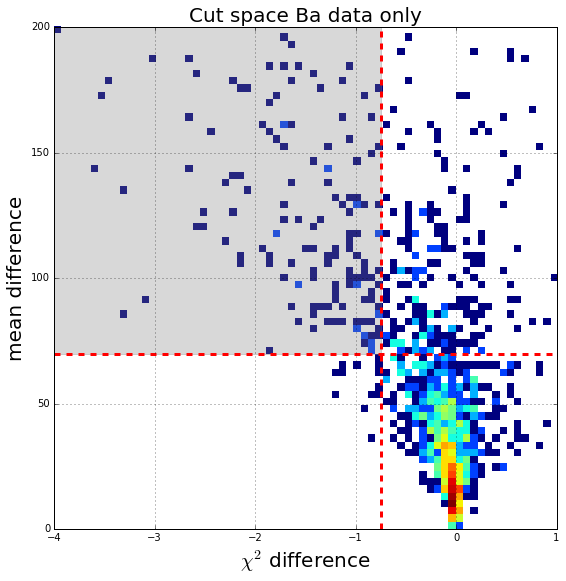

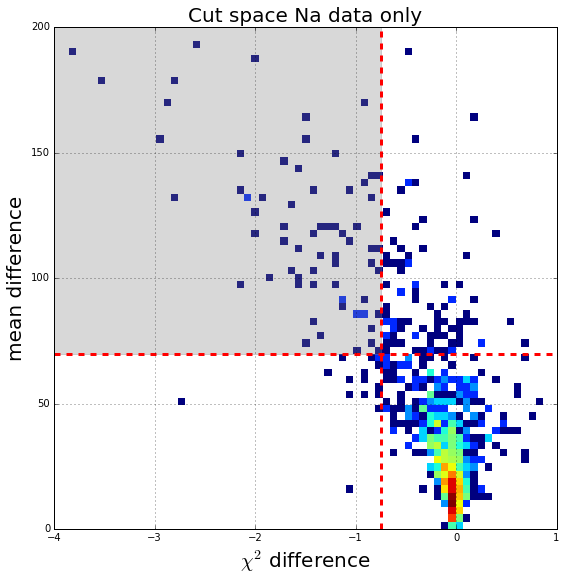

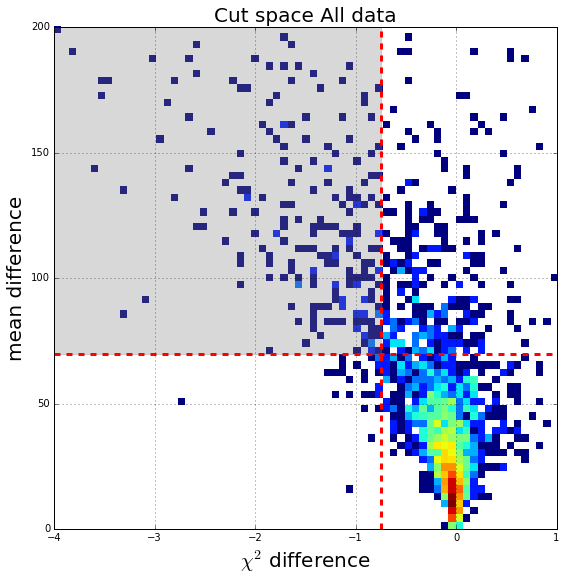

In [98]:
bins = 70
x4 = CHIDIF[0]
y4 = MEAND[0]
plt.figure(figsize=(9,9))
plt.title(r'Cut space Ba data only',fontsize=20)

xedges, yedges = np.linspace(-4, 1, bins), np.linspace(0, 200, bins)
plt.hist2d(x4, y4, bins=(xedges, yedges), norm=LogNorm())
plt.xlim(-4,1)
plt.ylim(0,200)
plt.axvspan(-4, -0.75, ymin=0.35, ymax=200, alpha=0.3, color='grey')
plt.axhline(70,linewidth=3,linestyle='--',color='r')
plt.axvline(-0.75,linewidth=3,linestyle='--',color='r')
plt.grid(True)
plt.xlabel(r'$\chi ^2$ difference', fontsize=20)
plt.ylabel('mean difference', fontsize=20)
#plt.savefig('/Users/austinmcdonald/Desktop/fitting/'+'chiBadata-cut')
plt.show()

bins = 70
x4 = CHIDIF[2]
y4 = MEAND[2]
plt.figure(figsize=(9,9))
plt.title(r'Cut space Na data only',fontsize=20)

xedges, yedges = np.linspace(-4, 1, bins), np.linspace(0, 200, bins)
plt.hist2d(x4, y4, bins=(xedges, yedges), norm=LogNorm())
plt.xlim(-4,1)
plt.ylim(0,200)
plt.axvspan(-4, -0.75, ymin=0.35, ymax=200, alpha=0.3, color='grey')
plt.axhline(70,linewidth=3,linestyle='--',color='r')
plt.axvline(-0.75,linewidth=3,linestyle='--',color='r')
plt.grid(True)
plt.xlabel(r'$\chi ^2$ difference', fontsize=20)
plt.ylabel('mean difference', fontsize=20)
#plt.savefig('/Users/austinmcdonald/Desktop/fitting/'+'chiBadata-cut')
plt.show()

bins = 70
x4 = CHIDIF[0] + CHIDIF[2]
y4 = MEAND[0] + MEAND[2]
plt.figure(figsize=(9,9))
plt.title(r'Cut space All data',fontsize=20)

xedges, yedges = np.linspace(-4, 1, bins), np.linspace(0, 200, bins)
plt.hist2d(x4, y4, bins=(xedges, yedges), norm=LogNorm())
plt.xlim(-4,1)
plt.ylim(0,200)
plt.axvspan(-4, -0.75, ymin=0.35, ymax=200, alpha=0.3, color='grey')
plt.axhline(70,linewidth=3,linestyle='--',color='r')
plt.axvline(-0.75,linewidth=3,linestyle='--',color='r')
plt.grid(True)
plt.xlabel(r'$\chi ^2$ difference', fontsize=20)
plt.ylabel('mean difference', fontsize=20)
#plt.savefig('/Users/austinmcdonald/Desktop/fitting/'+'chiBadata-cut')
plt.show()

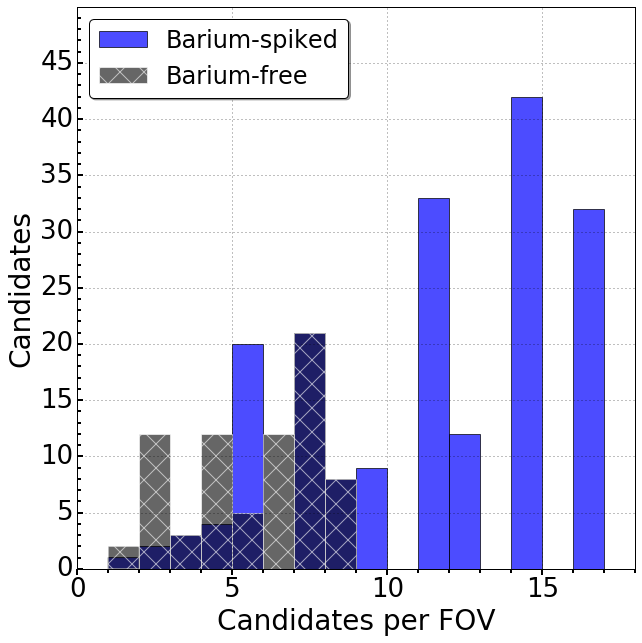

In [99]:

fig, ax = plt.subplots(figsize=(9,9))
num =1

s1 = ax.hist(NUM[0],label='Barium-spiked',alpha=0.7,color='blue',bins=np.arange(1,21,num),weights=NUM[0])
b1 = ax.hist(NUM[2],label='Barium-free',alpha=0.6,color='k',bins=np.arange(1,21,num),weights=NUM[2],edgecolor='w', hatch="x")

ax.set_xlabel('Candidates per FOV', fontsize=28)
ax.set_ylabel('Candidates', fontsize=28)

#handles,labels = ax.get_legend_handles_labels()
#handles = [handles[3], handles[1], handles[2], handles[0]]
#labels = [labels[3], '    '+labels[1], labels[2], '    '+labels[0]]
ax.legend(loc='upper left',fontsize=24,shadow=True, fancybox=True)

plt.xticks(fontsize = 26)
plt.yticks(fontsize = 26)

xmajor_ticks = np.arange(0, 21, 5)
xminor_ticks = np.arange(0, 21, 1)
ymajor_ticks = np.arange(0, 50, 5)
yminor_ticks = np.arange(0, 50, 1)
ax.tick_params(axis = 'x', which = 'major', direction='out',width=2,length=6,top="off",right='off')
ax.tick_params(axis = 'x', which = 'minor', direction='out',width=2,length=4,top="off",right='off')

ax.tick_params(axis = 'y', which = 'major', direction='in',width=2,length=6,top="off",right='off')
ax.tick_params(axis = 'y', which = 'minor', direction='in',width=2,length=4,top="off",right='off')

ax.set_xticks(xmajor_ticks)
ax.set_xticks(xminor_ticks, minor = True)
ax.set_yticks(ymajor_ticks)
ax.set_yticks(yminor_ticks, minor = True)

ax.set_xlim(0,18)
ax.set_ylim(0,50)
plt.grid(True)
plt.tight_layout()
#plt.savefig('/Users/austinmcdonald/Desktop/fitting/Ba-FOV-V3.png')
plt.show()

In [100]:
lifetime=dict()
for x in range(0,len(DataSet)):
    LT=[]
    for z in range(0,len(MEAND[x])):
        if MEAND[x][z]>70 and CHIDIF[x][z]<-0.75:#CHISQUARE[x][z]<CHILINE[x][z] :#and MEANE[x][z]<20:
      
            LT.append(LIFETIME[x][z])
    lifetime[x]=LT# = [item for sublist in LT for item in sublist]
print('Ba Passes Cuts = ',len(lifetime[0]))
print('Na Passes Cuts = ',len(lifetime[2]))
print('sigma = ',(len(lifetime[0])-len(lifetime[2]))/np.sqrt(len(lifetime[2])))

Ba Passes Cuts =  187
Na Passes Cuts =  75
sigma =  12.9326460298


Ba  Passes Cuts =  156
Na  Passes Cuts =  63


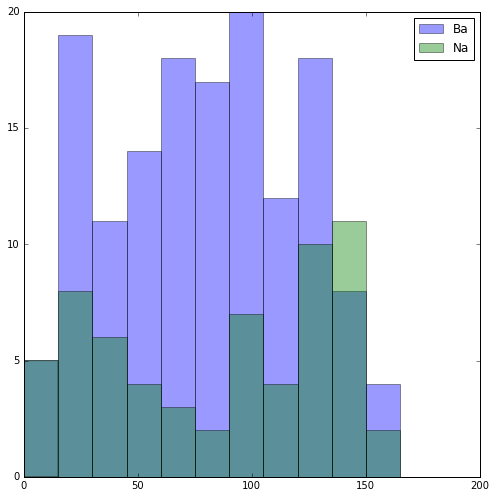

In [70]:
lifetime=dict()
for x in range(0,len(DataSet)):
    LT=[]
    for z in range(0,len(MEAND[x])):
        if MEAND[x][z]>90 and CHIDIF[x][z]<-0.75:#CHISQUARE[x][z]<CHILINE[x][z] :#and MEANE[x][z]<20:
      
            LT.append(LIFETIME[x][z])
    lifetime[x]=LT# = [item for sublist in LT for item in sublist]
print(DataSet[0]+' '+' Passes Cuts = ',len(lifetime[0]))    
print(DataSet[2]+' '+' Passes Cuts = ',len(lifetime[2]))    
plt.figure(figsize=(7,7))
num =15
plt.hist(lifetime[0],label=DataSet[0],alpha=0.4,color='b',bins=np.arange(0,200,num))
#plt.hist(AreaPass[1],label=DataSet[1],alpha=0.4,color='r',bins=np.arange(0,80,num))
plt.hist(lifetime[2],label=DataSet[2],alpha=0.4,color='g',bins=np.arange(0,200,num))
#plt.xlim(0,300)
#plt.ylim(0,250)
plt.legend()
#plt.axvline(70,linewidth=3,color='k')
#plt.title("area 5 frame avg cut at 7k area")
plt.tight_layout()
#plt.savefig('/Users/austinmcdonald/Desktop/'+'Hist-life')
plt.show()

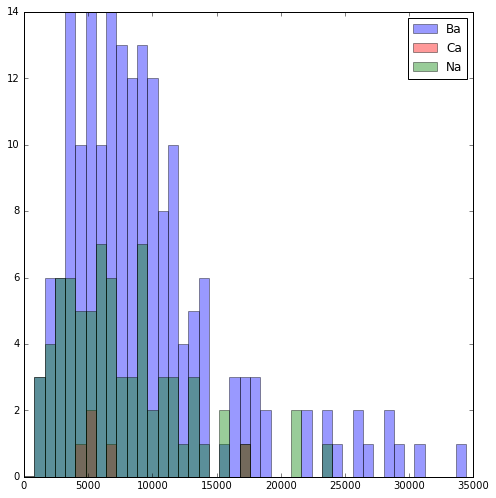

In [90]:
'''Hist of the areas before the bleach'''
AreaPass=dict()
for x in range(0,len(DataSet)):
    AP=[]
    for z in range(0,len(MEAND[x])):
        if MEAND[x][z]>70 and CHIDIF[x][z]<-0.75:
            AP.append(sum(AREAPRE[x][z]))
    AreaPass[x] = AP
plt.figure(figsize=(7,7))
num =800
plt.hist(AreaPass[0],label=DataSet[0],alpha=0.4,color='b',bins=np.arange(0,35e3,num))
plt.hist(AreaPass[1],label=DataSet[1],alpha=0.4,color='r',bins=np.arange(0,35e3,num))
plt.hist(AreaPass[2],label=DataSet[2],alpha=0.4,color='g',bins=np.arange(0,35e3,num))
#plt.xlim(0,300)
#plt.ylim(0,25)
plt.legend()
plt.title("area before the bleach")
plt.tight_layout()
#plt.savefig(SAVE+'Hist-areapre')
plt.show()

In [87]:
len(np.arange(0,40e3,700))

58

mean diff= 162.892825769
sigma front = 51.8483314813
sigma end = 22.0985579066


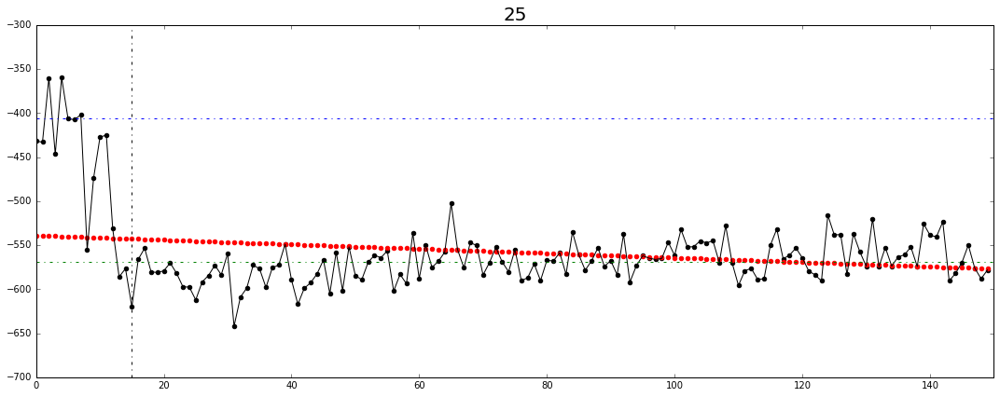

mean diff= 133.152901167
sigma front = 67.0405148527
sigma end = 39.3631258327


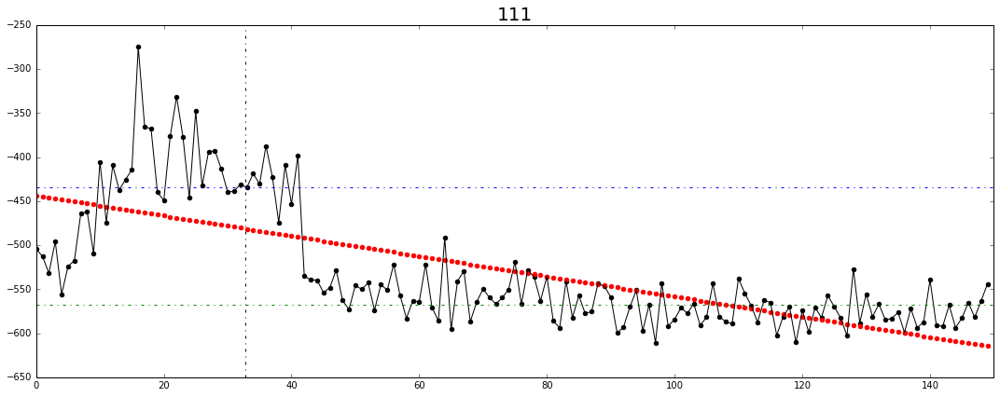

mean diff= 117.860384187
sigma front = 56.1221520644
sigma end = 16.97721451


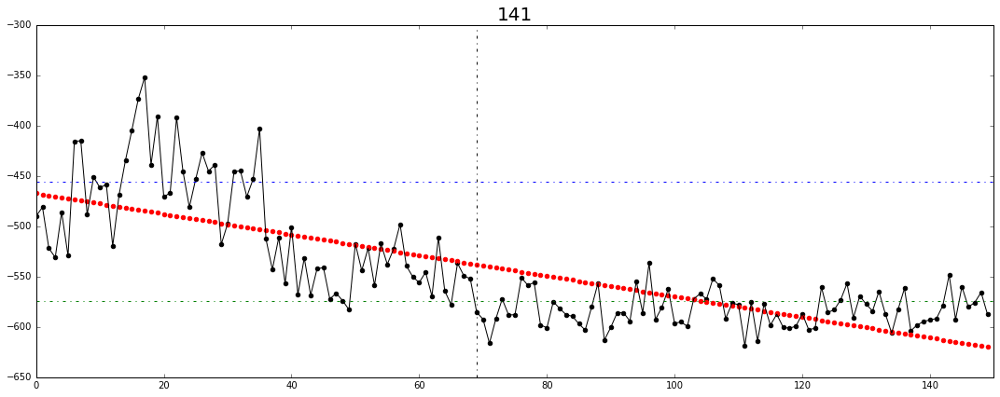

mean diff= 83.9424126656
sigma front = 29.6651277763
sigma end = 26.7292259308


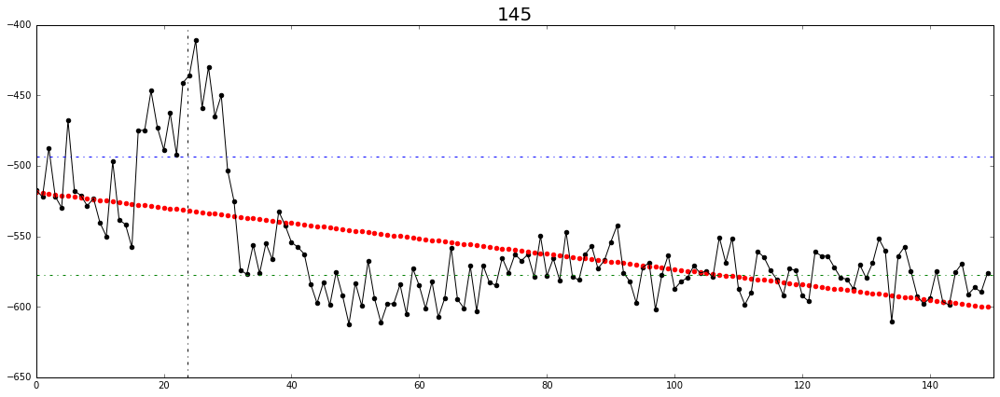

mean diff= 84.8489726085
sigma front = 51.5540882092
sigma end = 11.1322925768


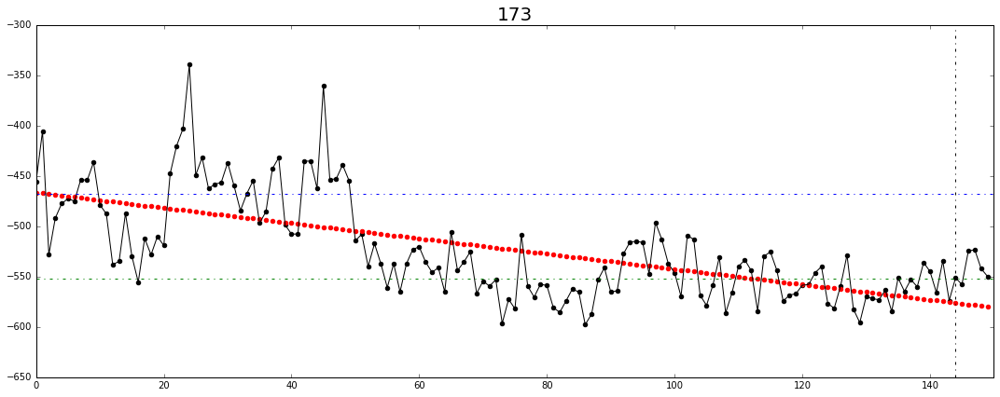

mean diff= 105.620845523
sigma front = 38.1002720522
sigma end = 41.1032073734


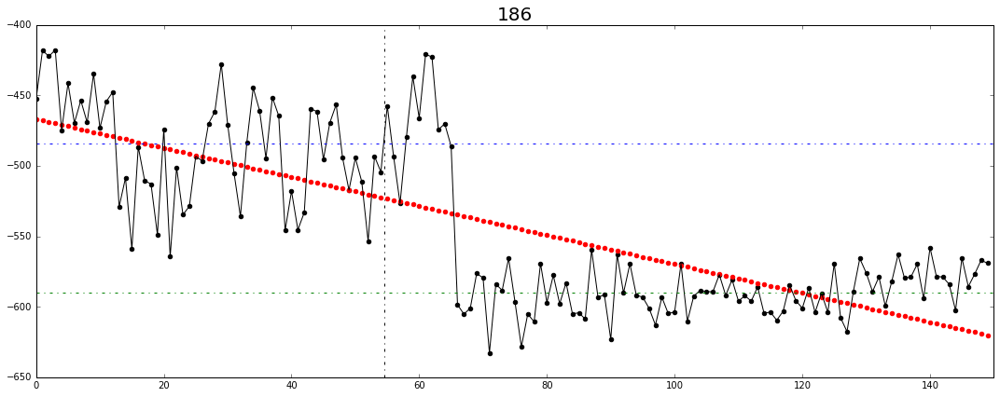

mean diff= 108.201784492
sigma front = 57.0890951503
sigma end = 14.7752466229


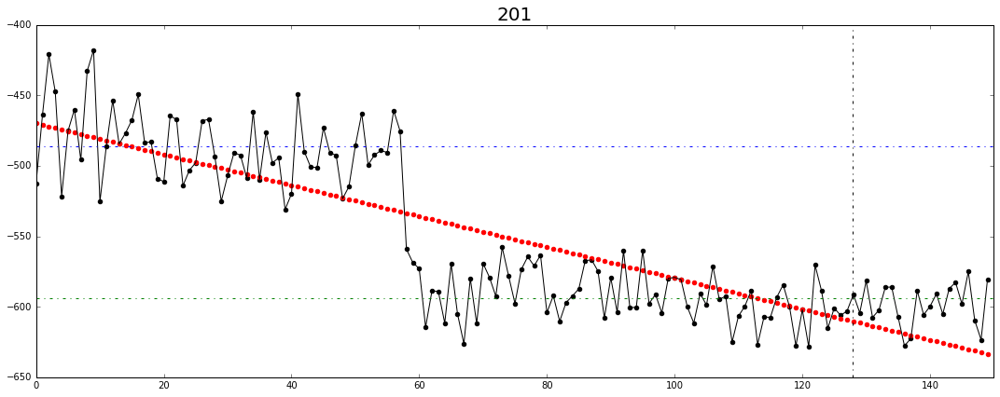

mean diff= 175.612638484
sigma front = 43.7805156551
sigma end = 38.3904727841


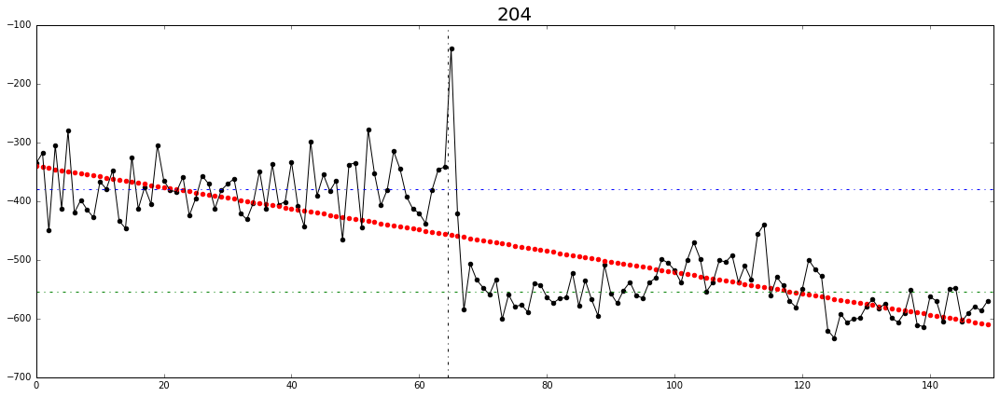

mean diff= 82.49855351
sigma front = 27.0827081213
sigma end = 17.721111389


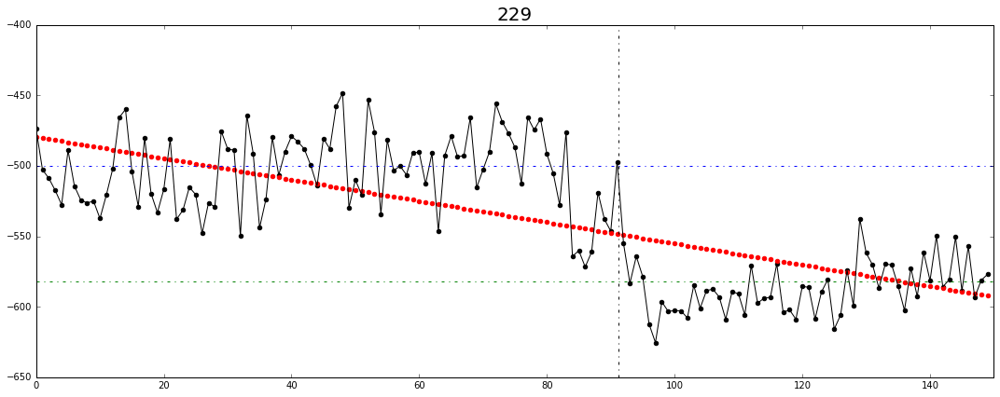

mean diff= 85.5049987319
sigma front = 61.3224018738
sigma end = 46.7653291132


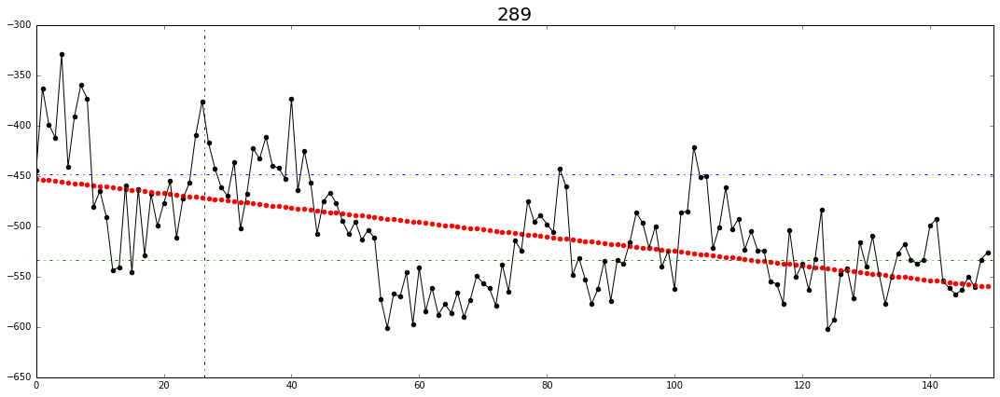

mean diff= 156.244177273
sigma front = 49.9692913297
sigma end = 27.3818176596


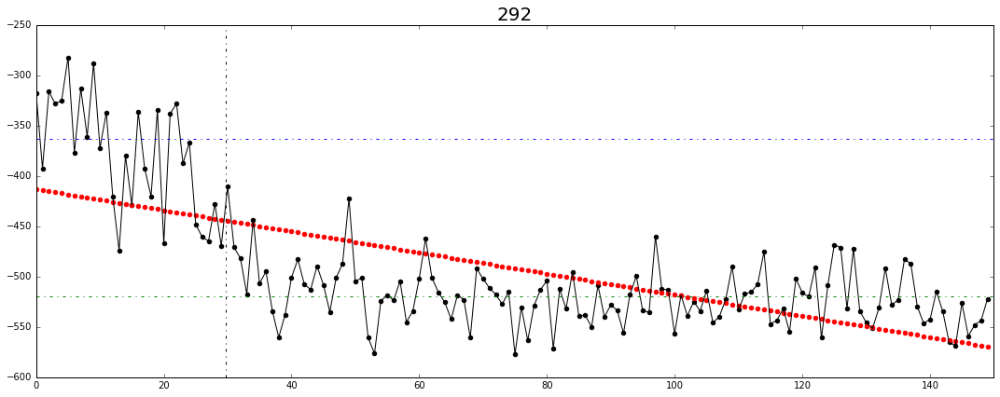

mean diff= 77.6786580181
sigma front = 42.5065706049
sigma end = 3.95651519988


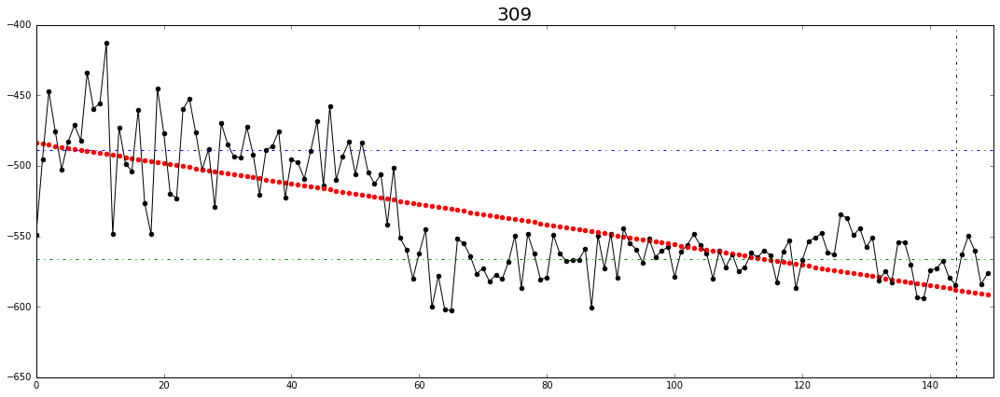

mean diff= 83.6234918064
sigma front = 51.2568722516
sigma end = 15.8335745017


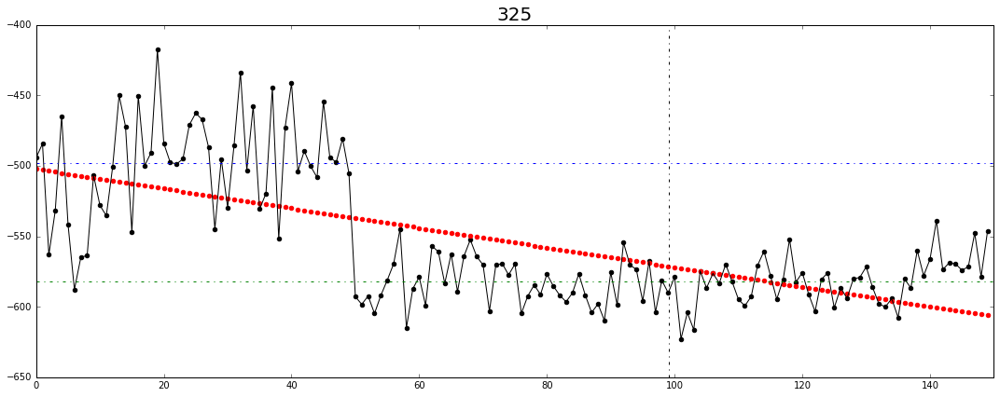

mean diff= 139.187506676
sigma front = 53.8865189718
sigma end = 85.3346351467


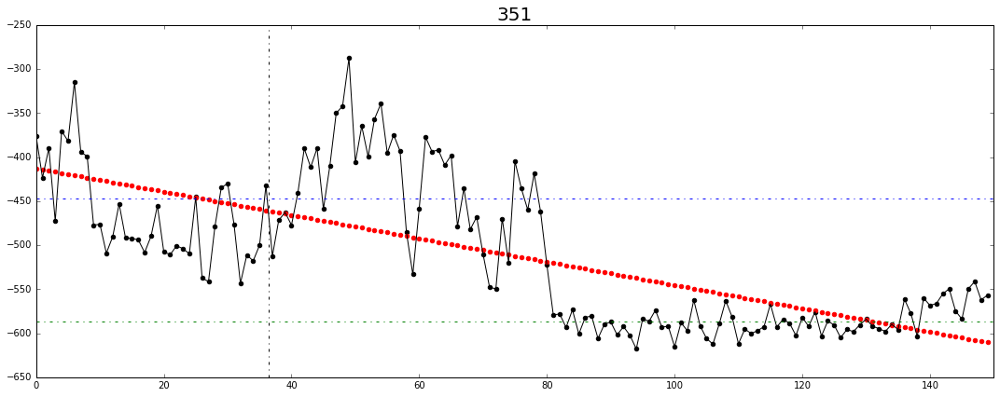

mean diff= 386.116284319
sigma front = 101.144411215
sigma end = 65.9440981574


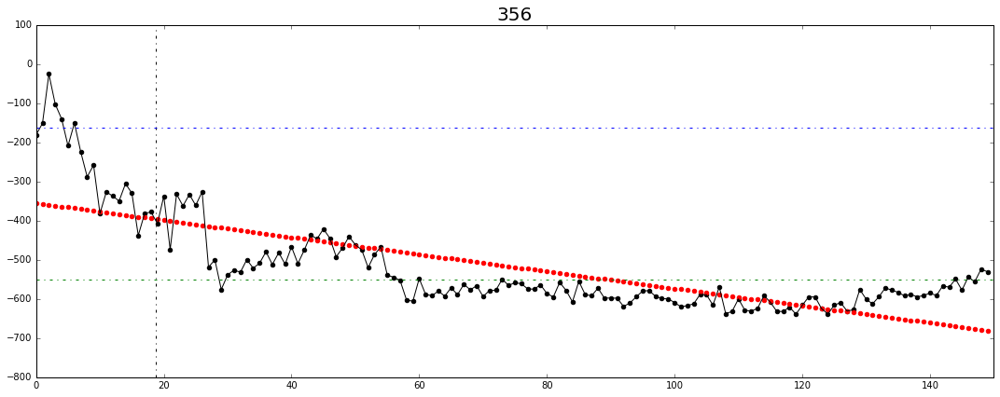

mean diff= 147.690839481
sigma front = 57.3260997722
sigma end = 16.6366134869


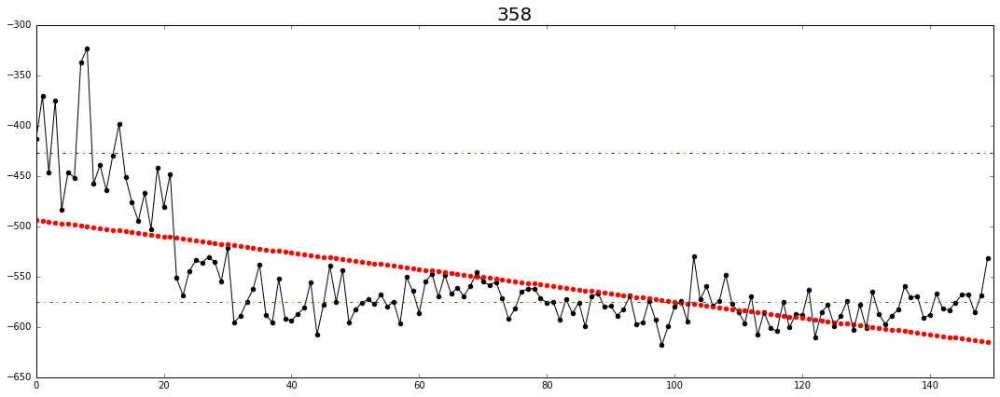

mean diff= 202.948785204
sigma front = 108.511085538
sigma end = 20.5059520646


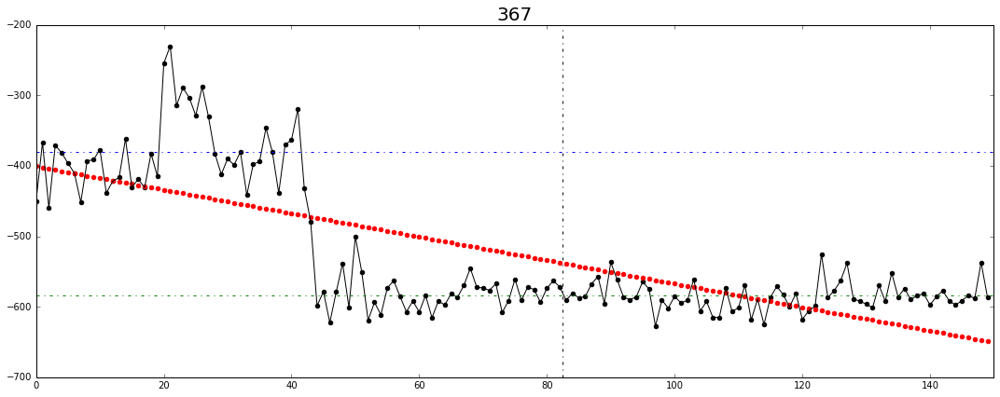

mean diff= 78.5716474476
sigma front = 40.0025159125
sigma end = 51.3172738991


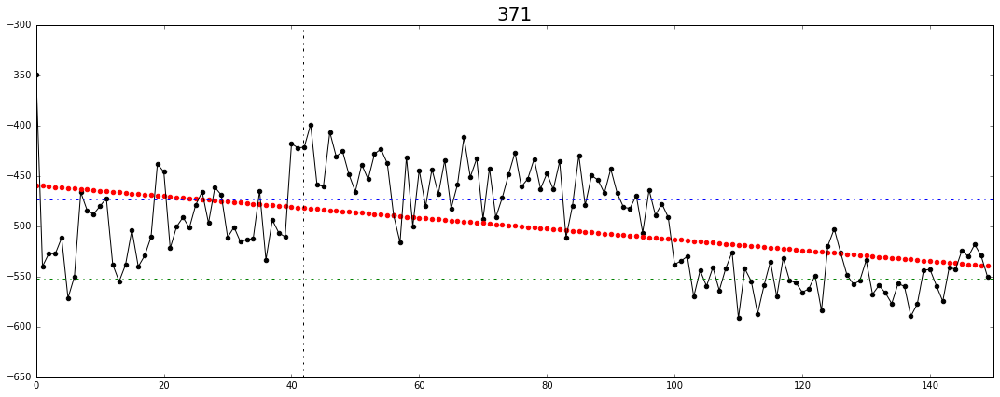

mean diff= 130.137057353
sigma front = 66.4072916768
sigma end = 20.3624055626


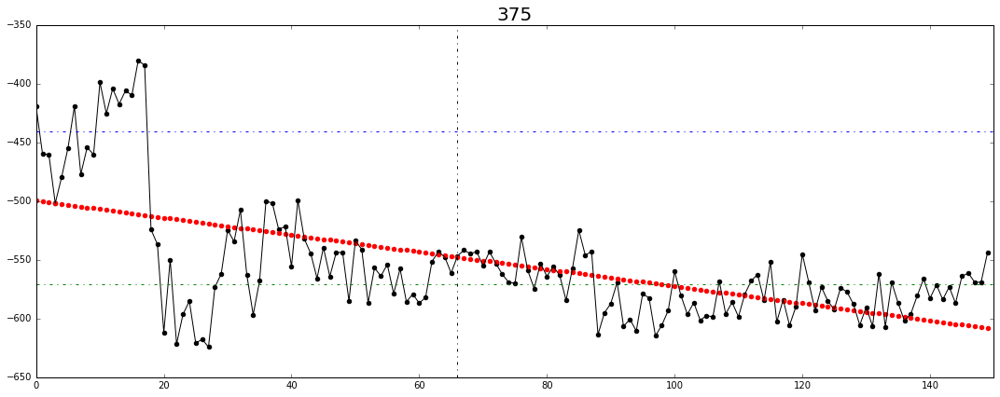

mean diff= 111.50155869
sigma front = 54.2980228813
sigma end = 15.3643713061


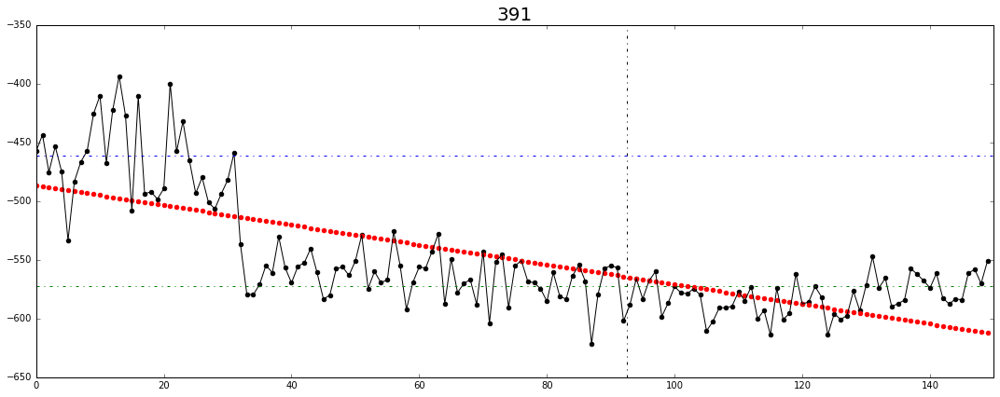

mean diff= 184.469740077
sigma front = 42.1754137254
sigma end = 40.2365827124


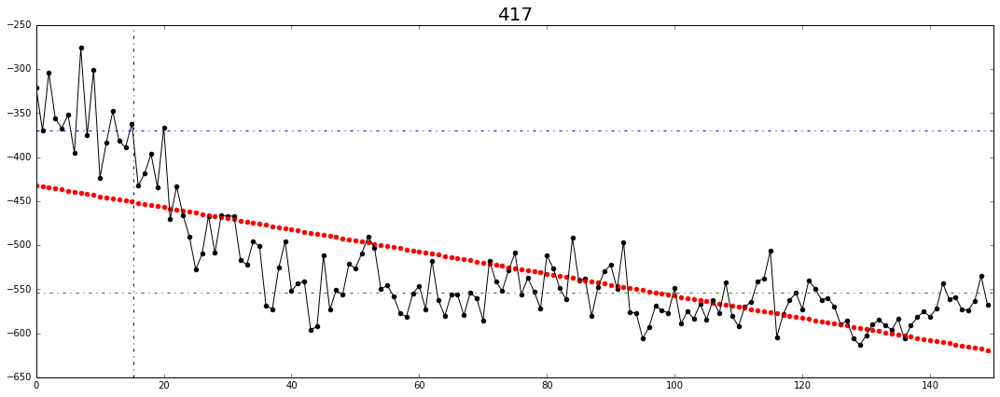

mean diff= 87.700117381
sigma front = 79.3797799676
sigma end = 36.4978197696


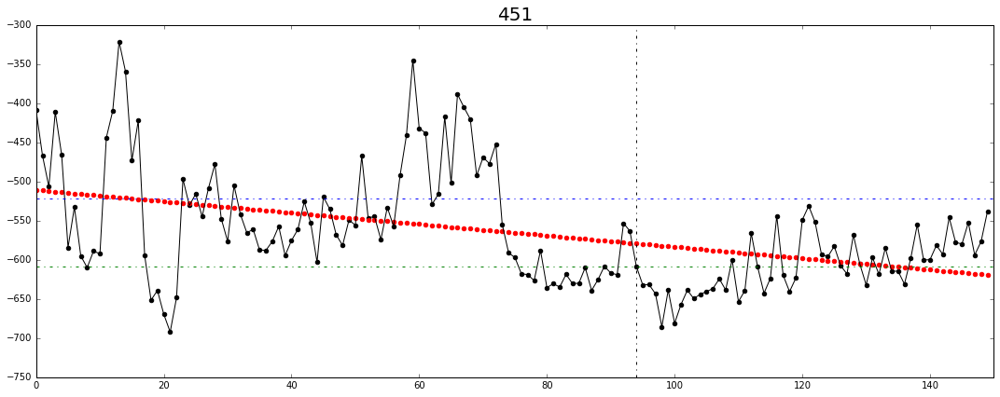

mean diff= 114.319008243
sigma front = 62.2343858364
sigma end = 23.188303628


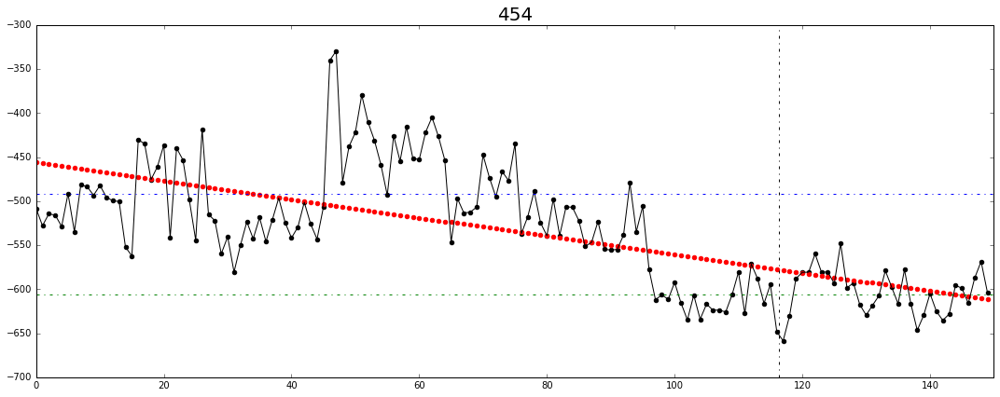

mean diff= 77.7757053241
sigma front = 51.0493469206
sigma end = 28.1176991944


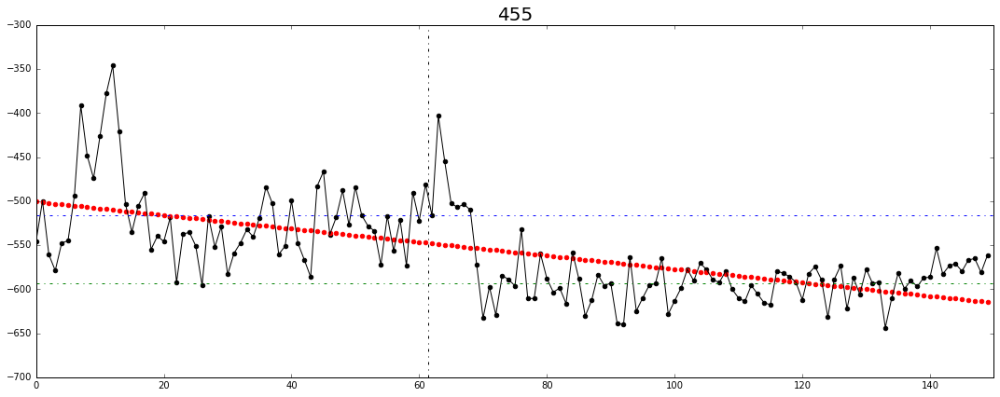

mean diff= 96.3932783661
sigma front = 39.3112221563
sigma end = 57.0389496931


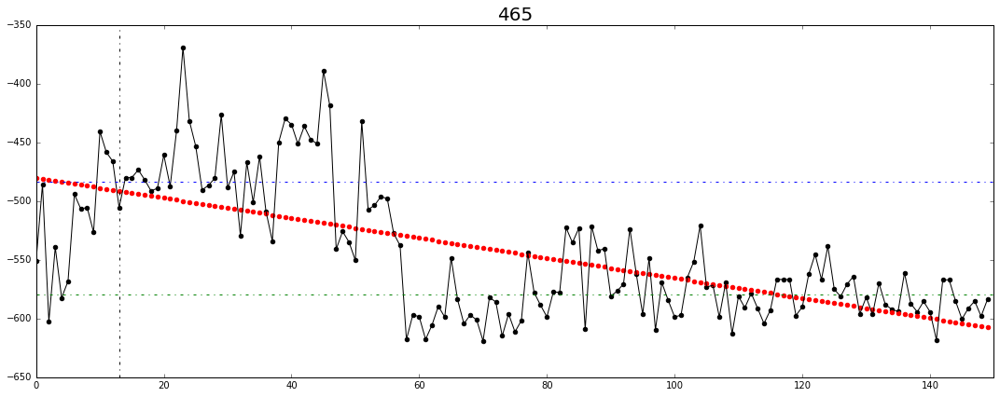

mean diff= 335.72532254
sigma front = 74.7858935585
sigma end = 33.5500707018


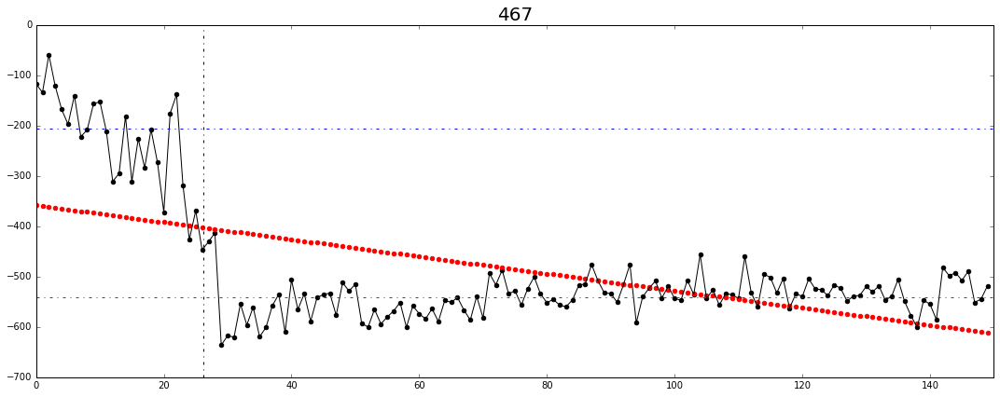

mean diff= 187.615075806
sigma front = 99.8862949906
sigma end = nan


//anaconda/envs/py35/lib/python3.5/site-packages/numpy/core/_methods.py:82: RuntimeWarning: Degrees of freedom <= 0 for slice
  warnings.warn("Degrees of freedom <= 0 for slice", RuntimeWarning)


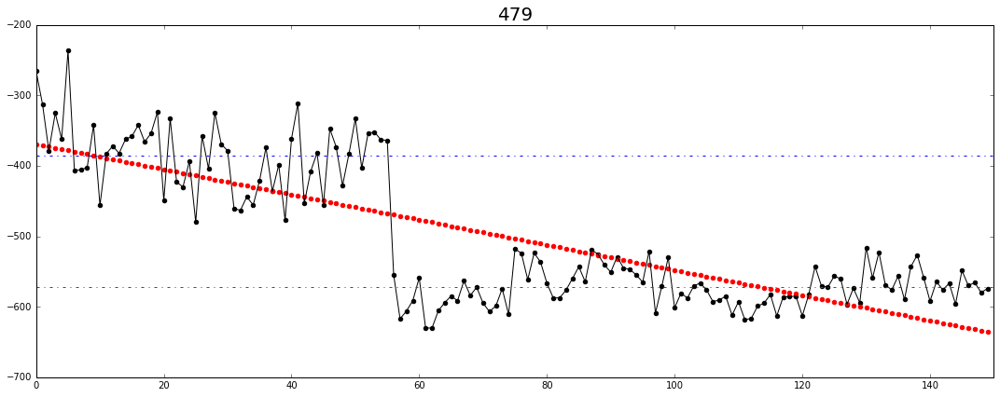

mean diff= 528.276338167
sigma front = 187.095560234
sigma end = 34.0300795816


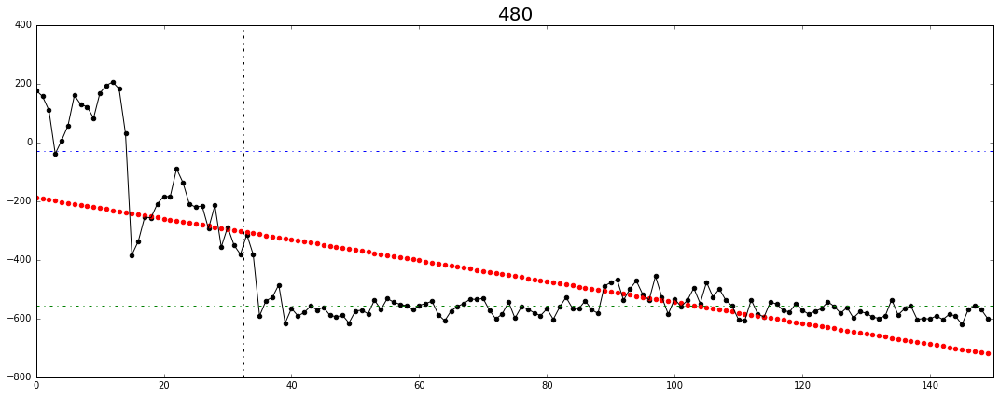

mean diff= 88.1631363453
sigma front = 54.7499678211
sigma end = 57.5738499834


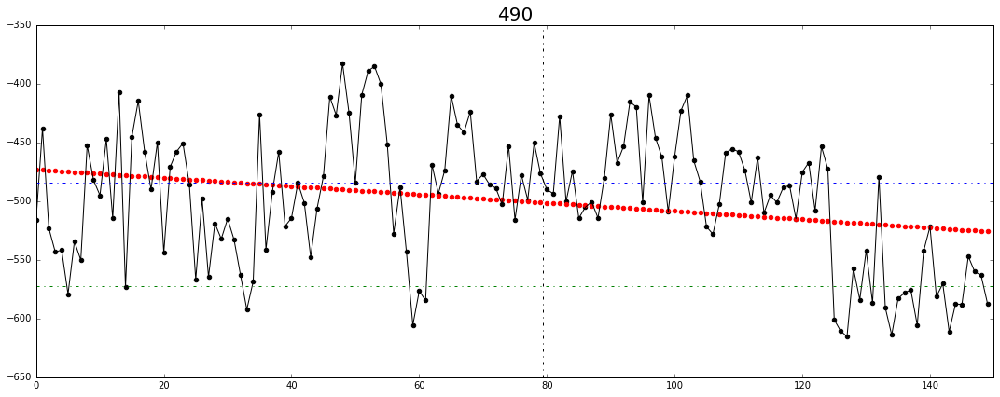

mean diff= 356.944634237
sigma front = 176.931946572
sigma end = 16.3677338926


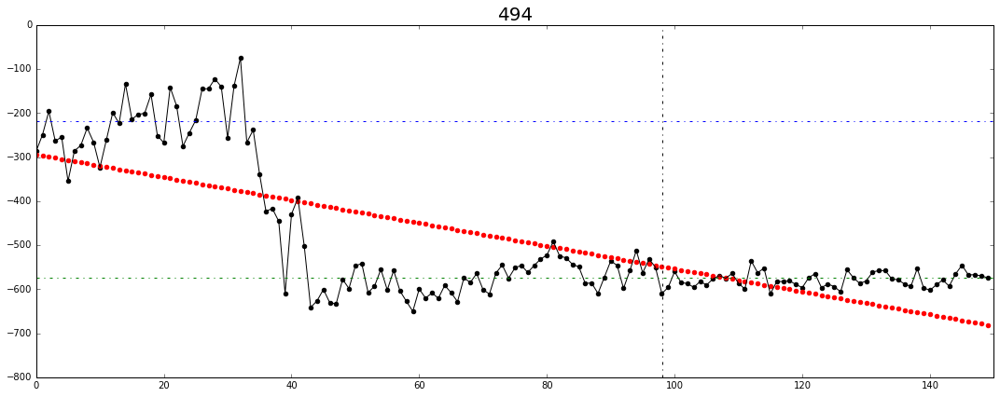

mean diff= 105.036396186
sigma front = 62.4427995493
sigma end = 16.8157268671


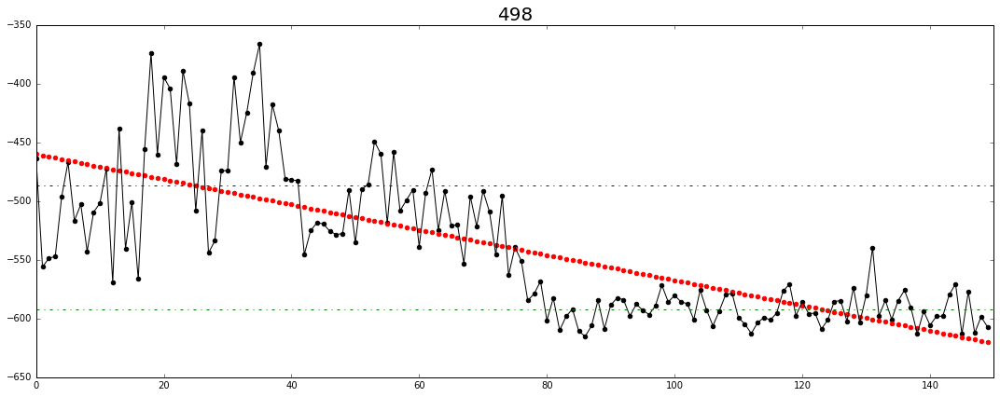

mean diff= 72.2153689701
sigma front = 44.6661870604
sigma end = 16.7279126754


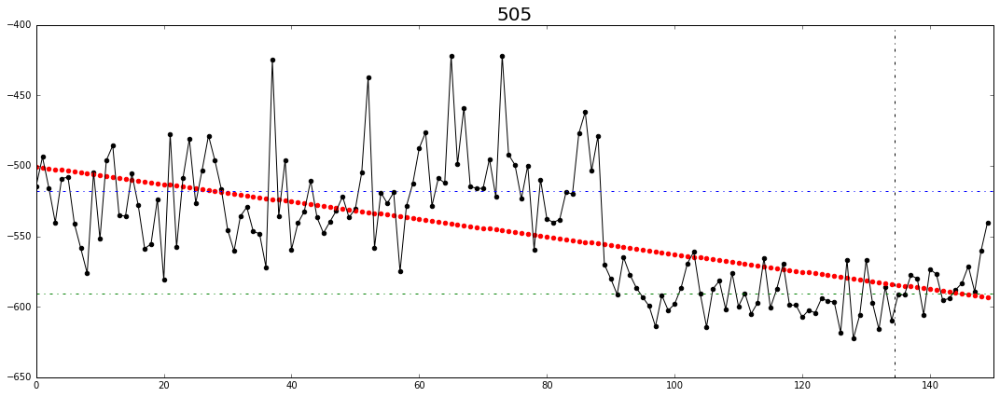

mean diff= 109.320814642
sigma front = 40.3538915573
sigma end = 56.6299959015


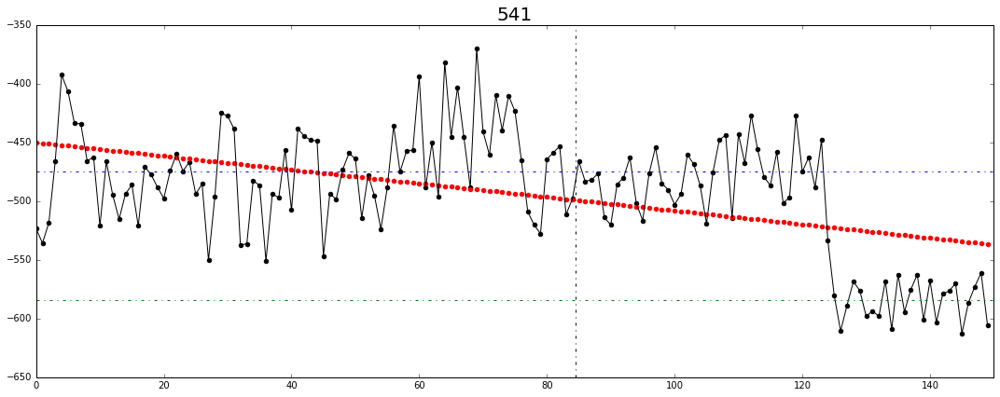

mean diff= 128.566768549
sigma front = 73.8809089416
sigma end = 30.3674161223


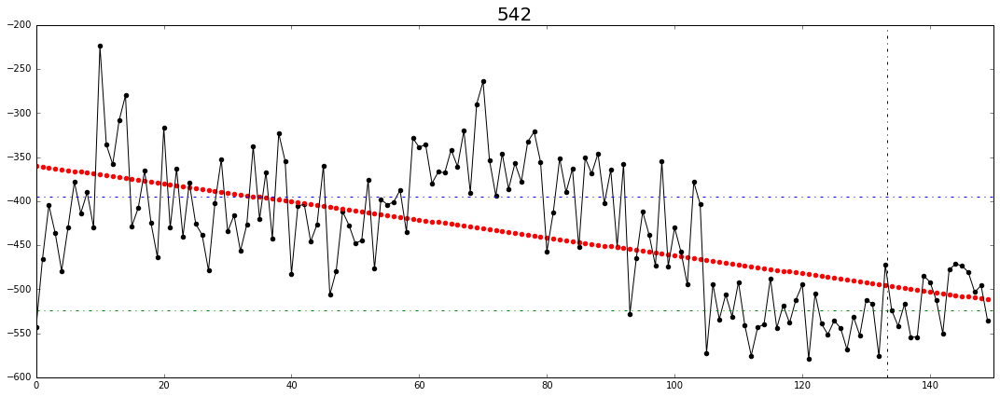

mean diff= 275.415124505
sigma front = 144.165086075
sigma end = 27.1270067243


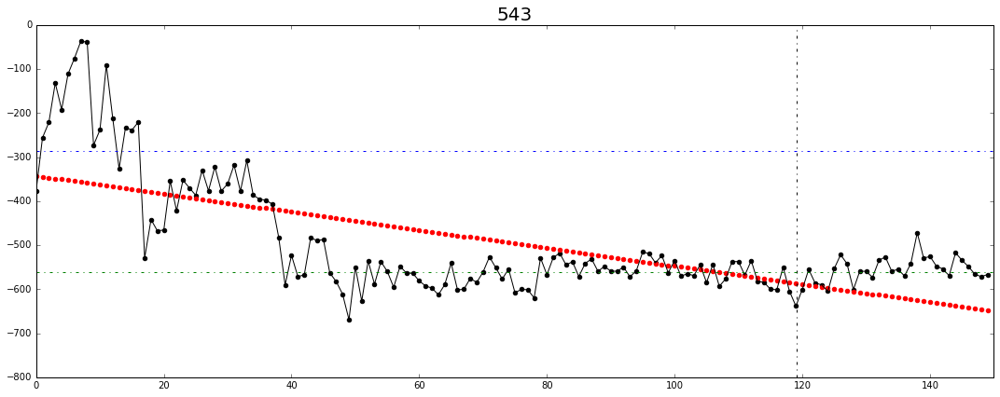

mean diff= 206.942866403
sigma front = 71.1363261837
sigma end = 87.4164278233


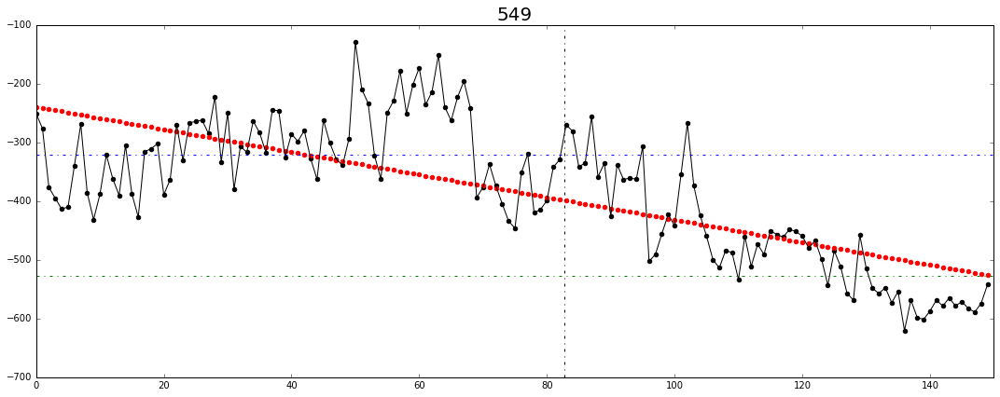

mean diff= 212.988989692
sigma front = 117.380582566
sigma end = 13.9835883687


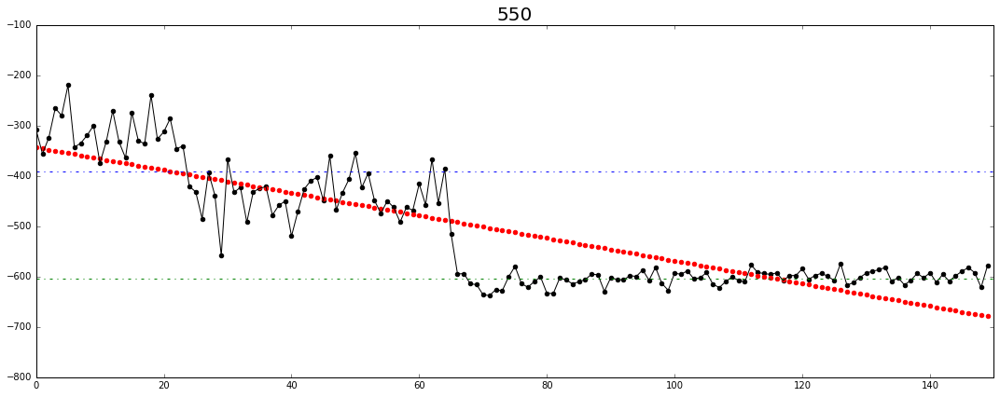

mean diff= 81.6920386348
sigma front = 55.8156383466
sigma end = 24.7715175674


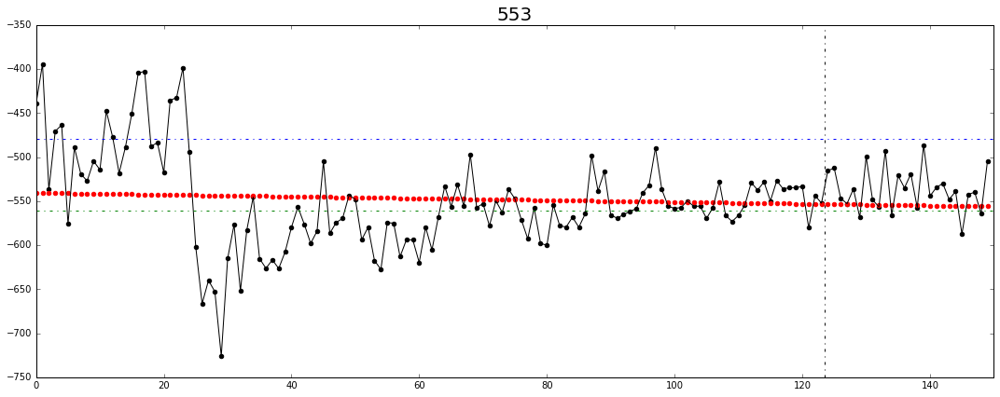

mean diff= 263.067082833
sigma front = 137.74302974
sigma end = 28.5538771516


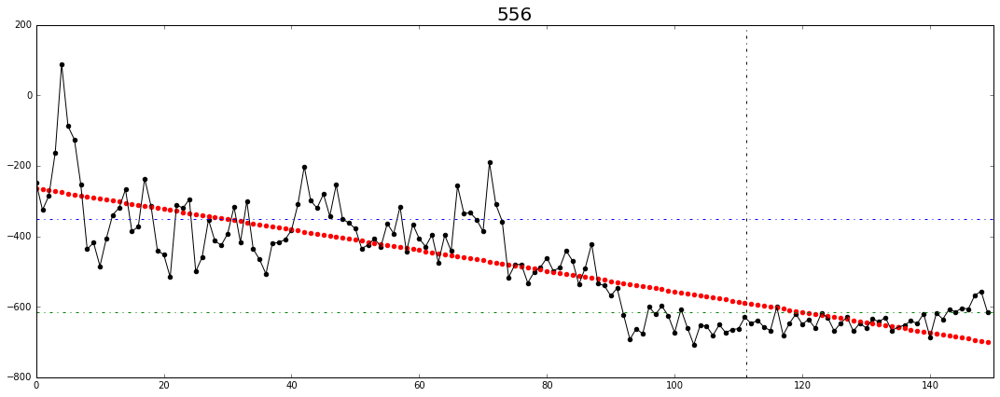

mean diff= 101.651308895
sigma front = 64.5097033008
sigma end = 14.2275202466


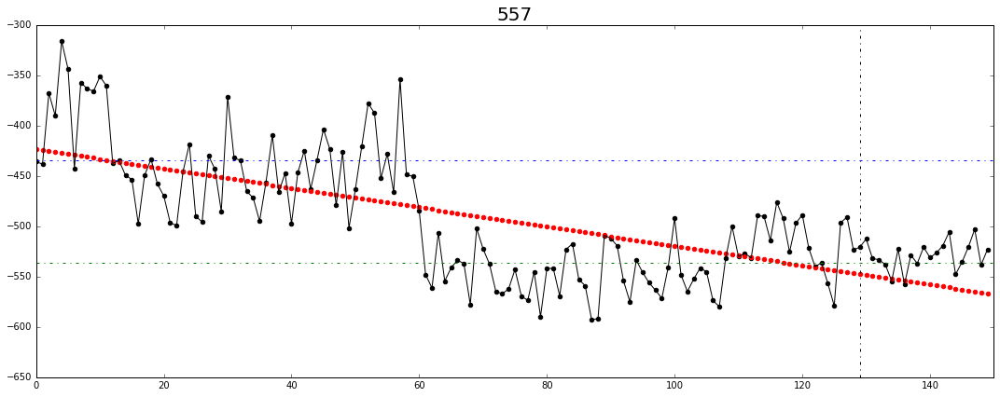

mean diff= 153.385239197
sigma front = 67.1973365064
sigma end = 77.1153673733


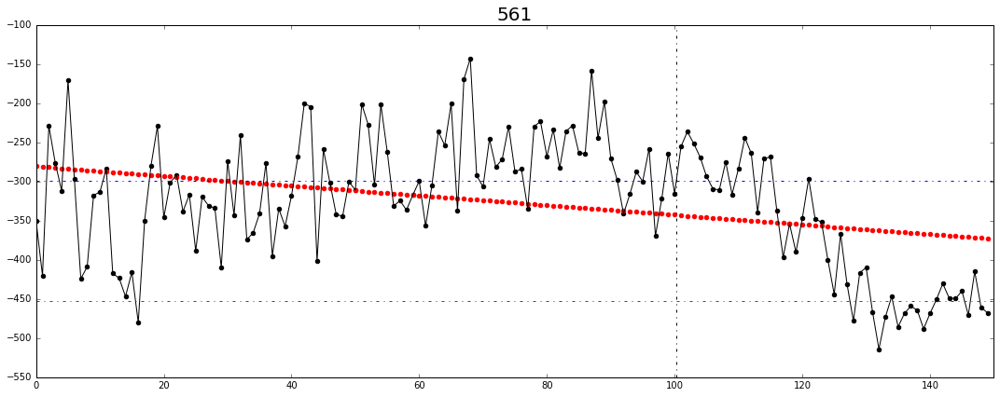

mean diff= 303.510726194
sigma front = 109.287780373
sigma end = 149.317201848


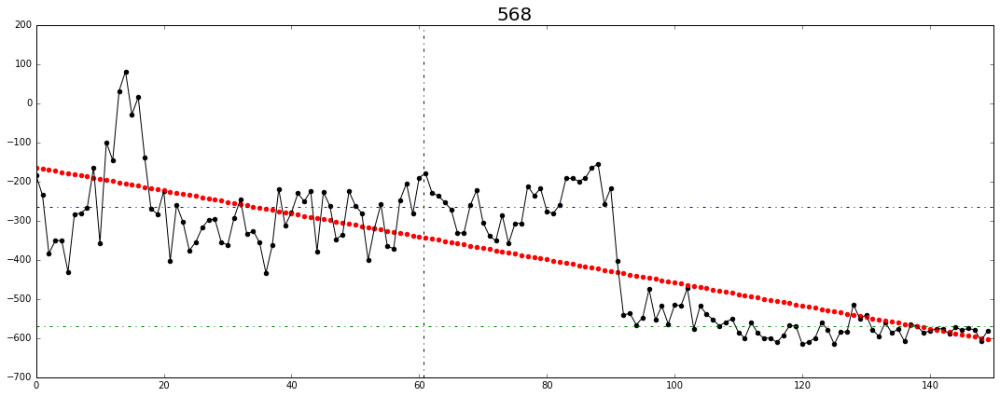

mean diff= 77.3233826275
sigma front = 75.9560665357
sigma end = 35.8514174856


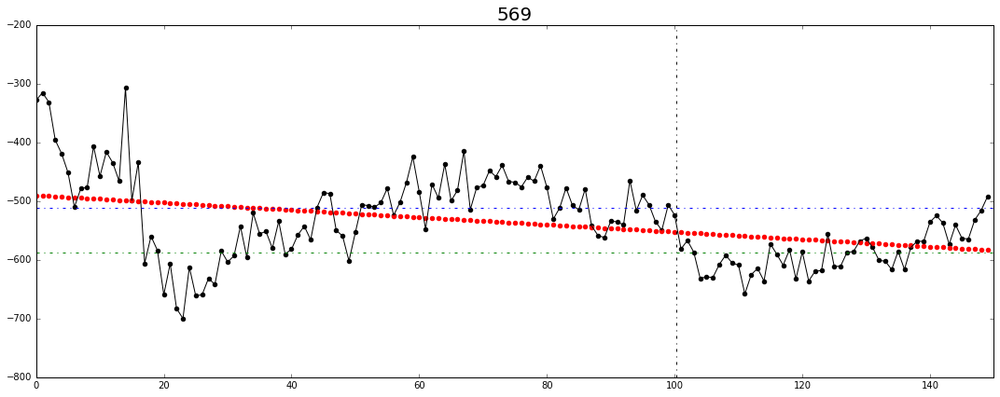

mean diff= 282.737215503
sigma front = 70.7558119504
sigma end = 130.430470822


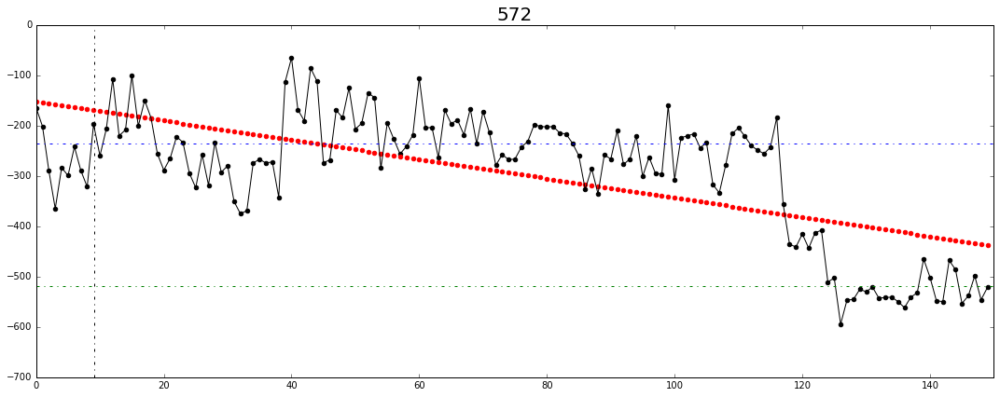

mean diff= 86.4977760575
sigma front = 44.2364686927
sigma end = 60.6126141449


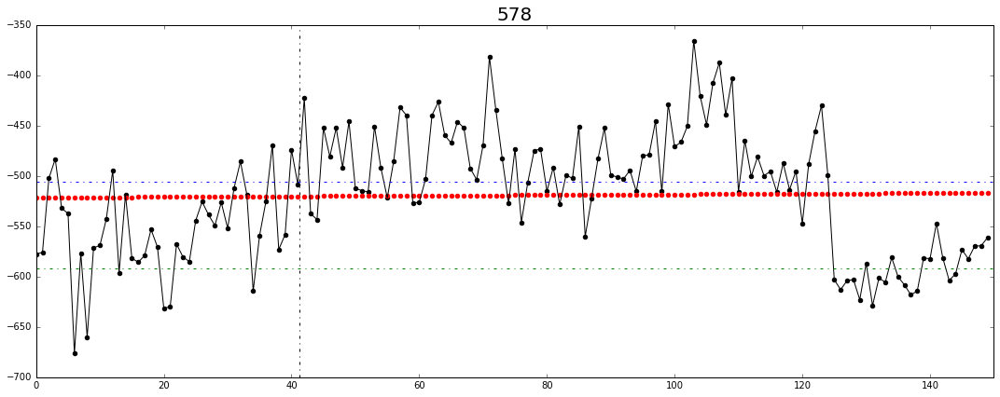

mean diff= 178.857364408
sigma front = 126.874579179
sigma end = 41.8567164177


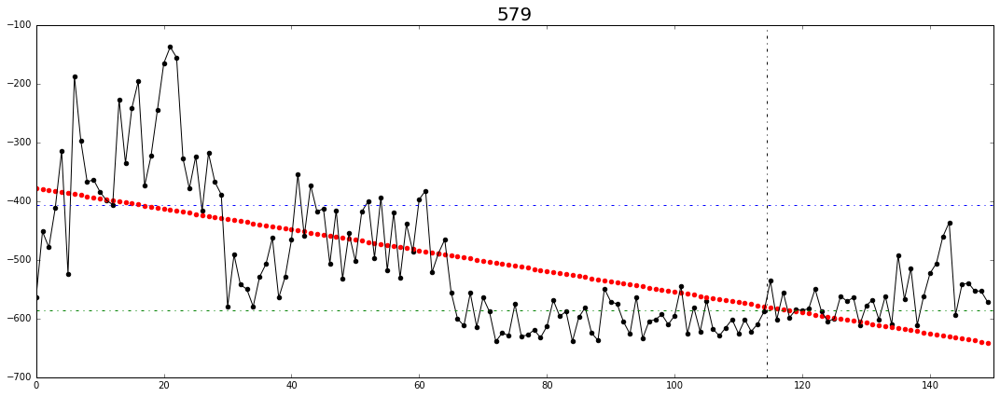

mean diff= 140.61326034
sigma front = 89.2354229128
sigma end = 84.4191901764


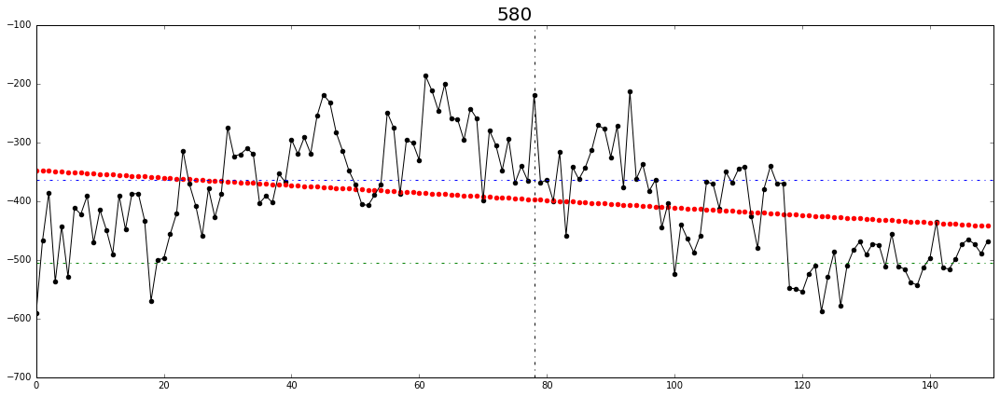

mean diff= 155.842269606
sigma front = 80.9001757369
sigma end = nan


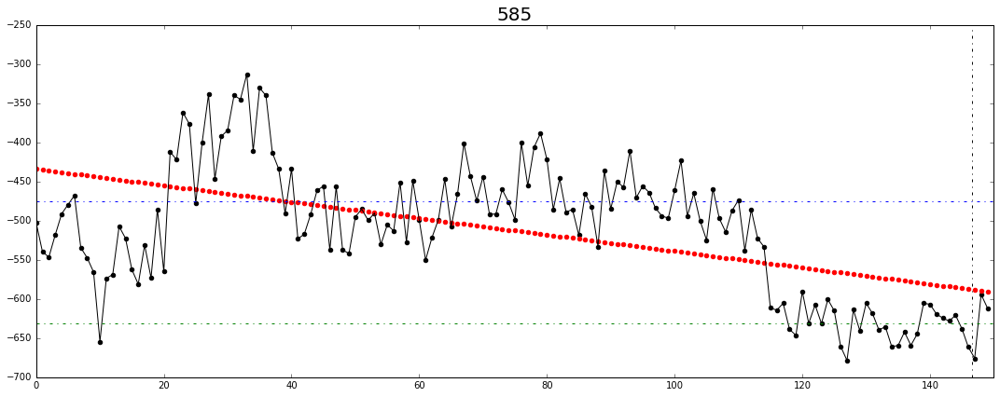

mean diff= 198.407500319
sigma front = 90.1631238081
sigma end = 21.3868234443


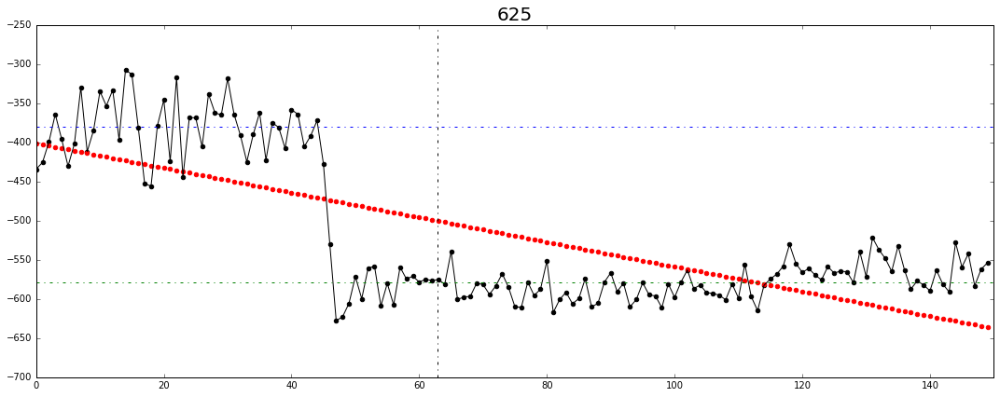

mean diff= 121.388483257
sigma front = 70.9929591334
sigma end = 22.9507503353


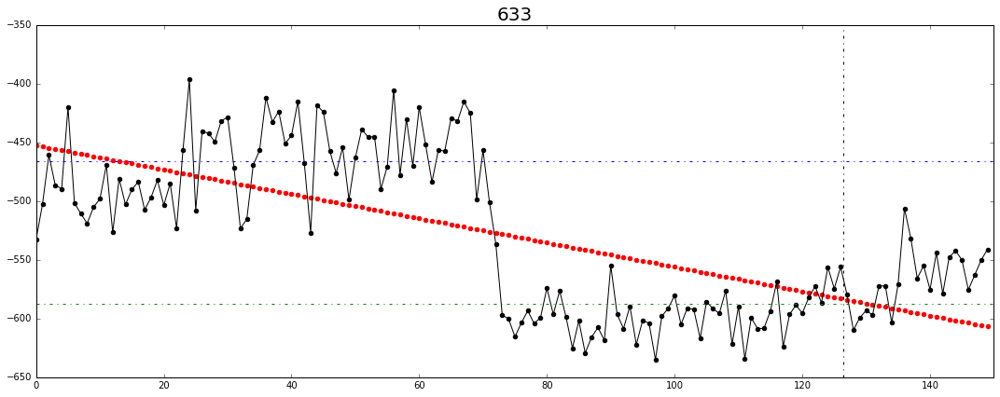

mean diff= 98.1958368463
sigma front = 42.0047985992
sigma end = 34.6479220448


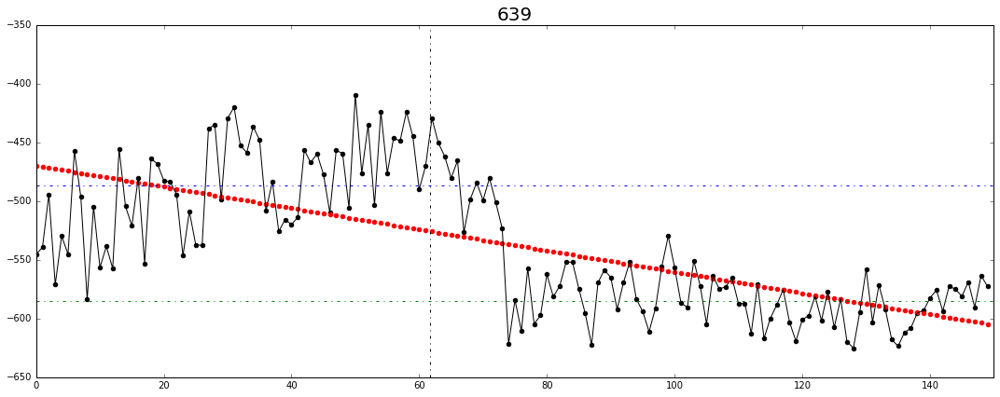

mean diff= 122.51990099
sigma front = 61.137411428
sigma end = 20.5094297826


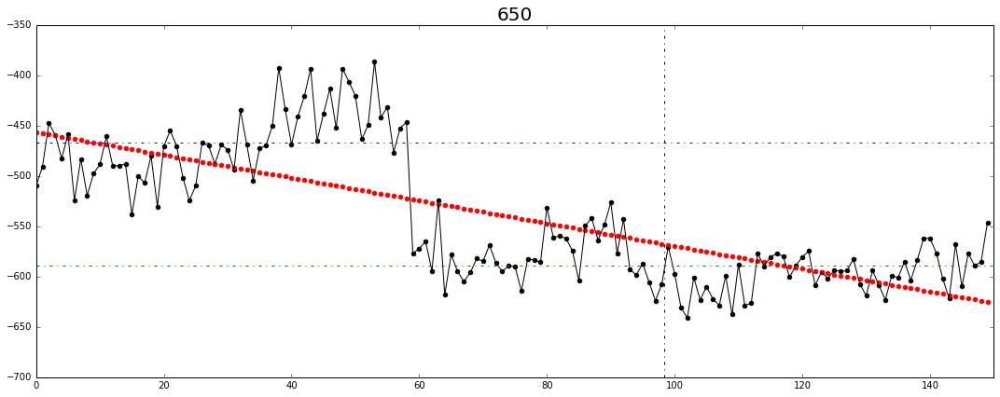

mean diff= 243.000080832
sigma front = 54.9682732847
sigma end = 117.073521012


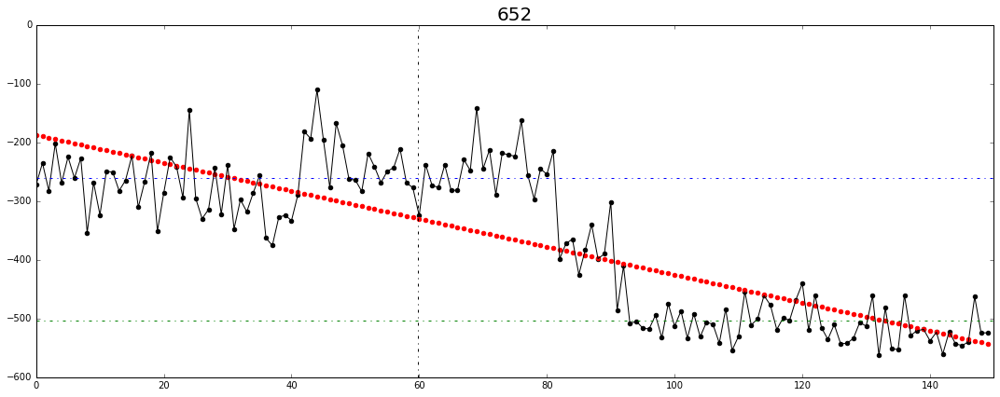

mean diff= 136.204713638
sigma front = 58.0156118038
sigma end = 73.2765355173


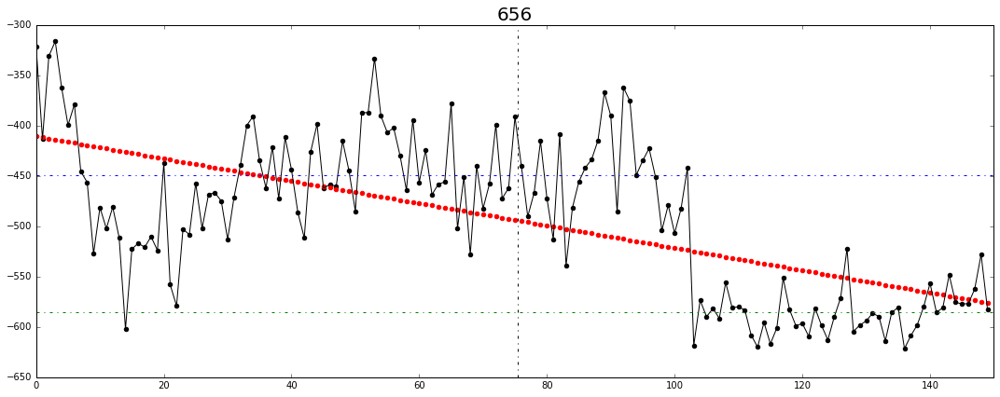

mean diff= 123.77836882
sigma front = 83.3230191468
sigma end = 16.1585648014


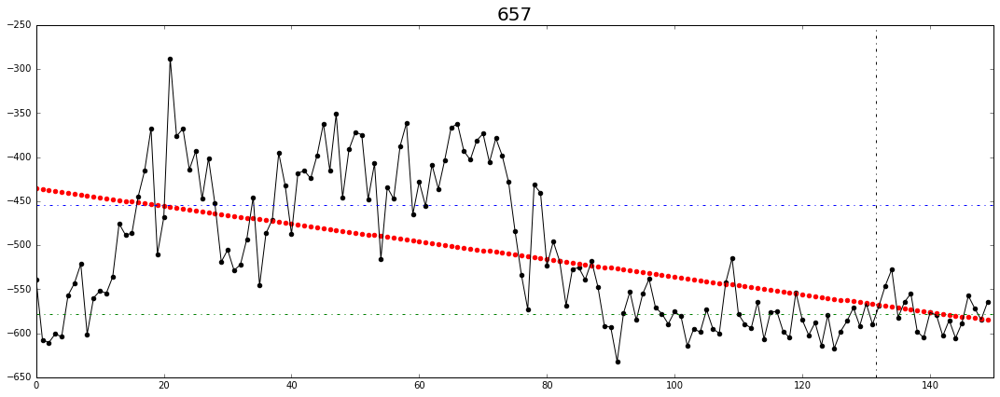

mean diff= 111.223374878
sigma front = 56.2378242449
sigma end = 21.3317633805


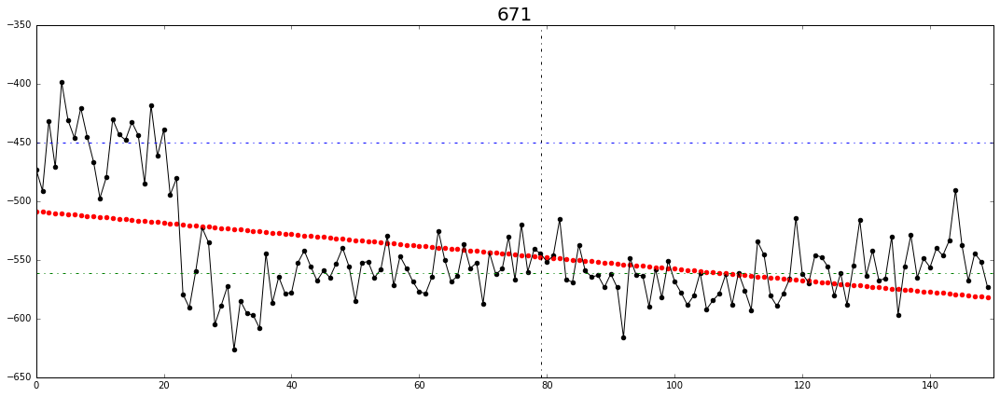

mean diff= 281.44233268
sigma front = 83.6592025671
sigma end = 132.503651846


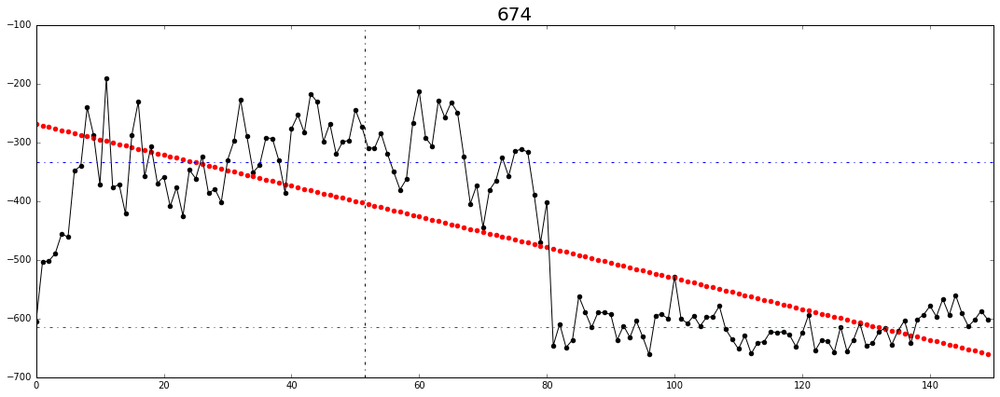

mean diff= 91.119360308
sigma front = 56.5937208257
sigma end = 14.9718559457


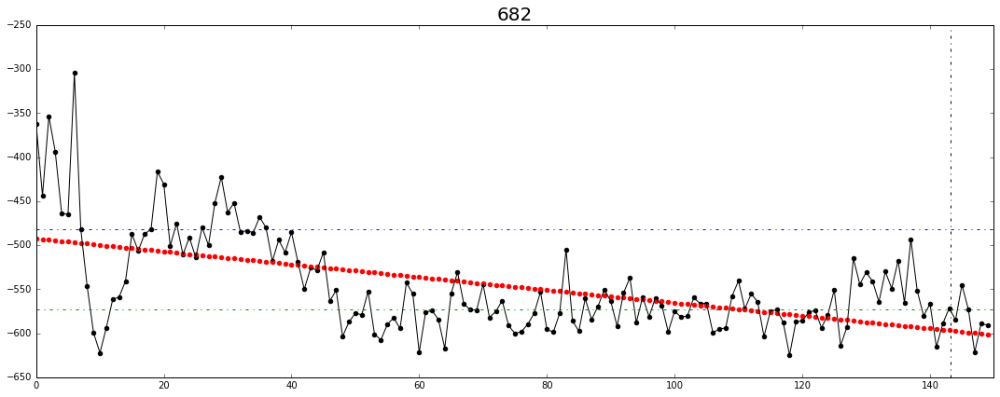

mean diff= 168.331243546
sigma front = 78.5564371695
sigma end = 18.9683535764


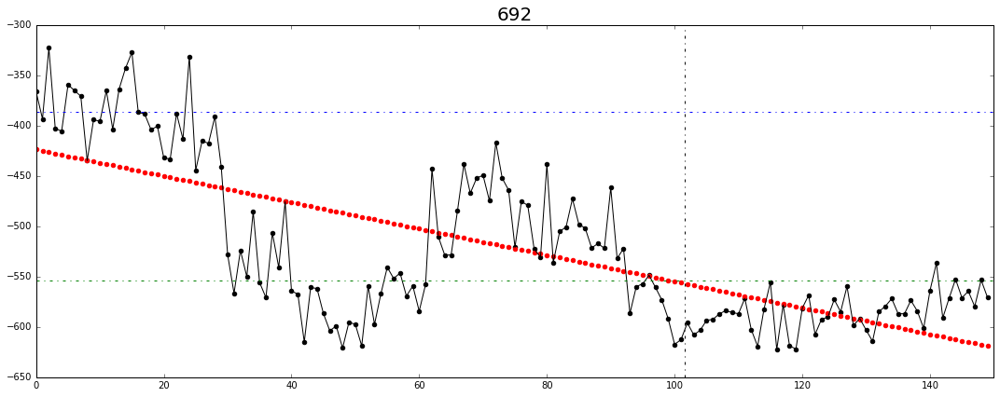

mean diff= 134.570530265
sigma front = 71.117181963
sigma end = 29.6395615088


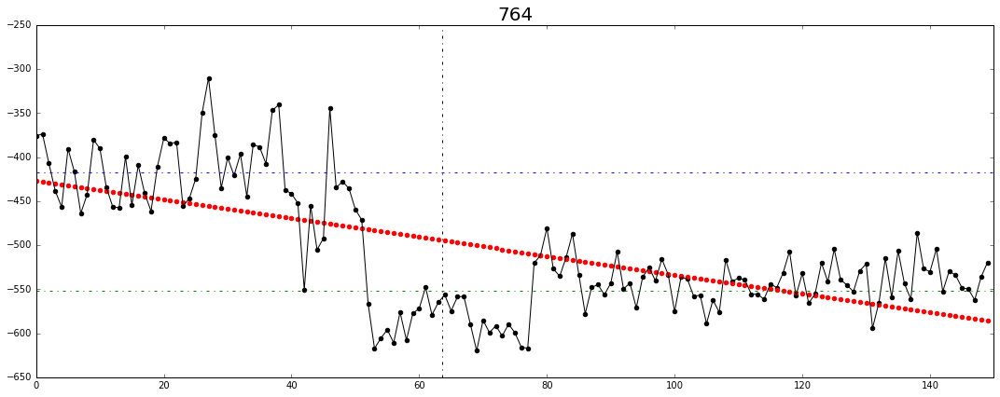

mean diff= 219.400781858
sigma front = 118.226869314
sigma end = 36.73362704


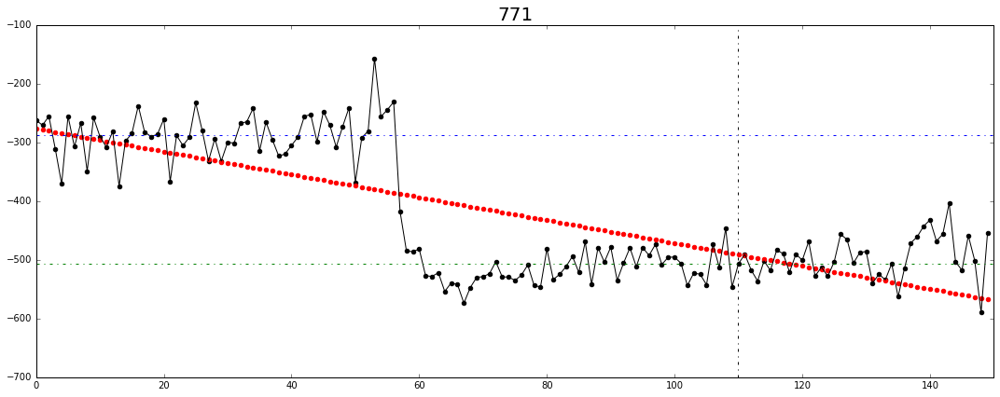

mean diff= 223.453008413
sigma front = 50.2070517299
sigma end = nan


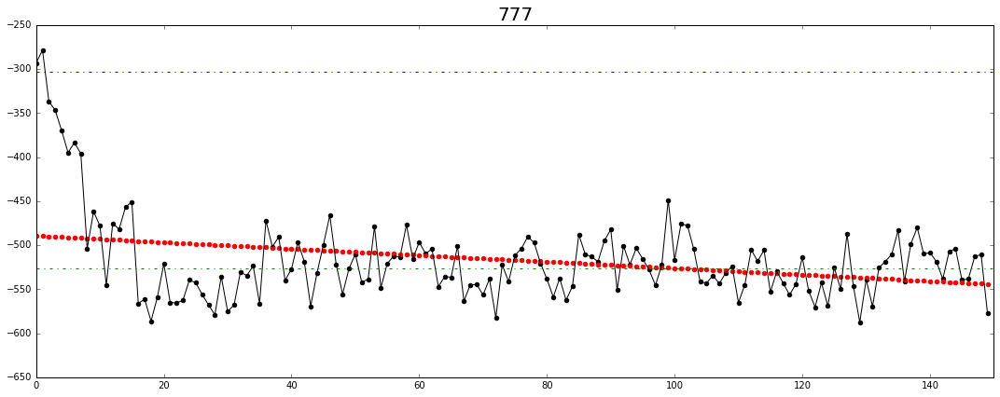

mean diff= 124.784464542
sigma front = 105.248329451
sigma end = 84.5411765411


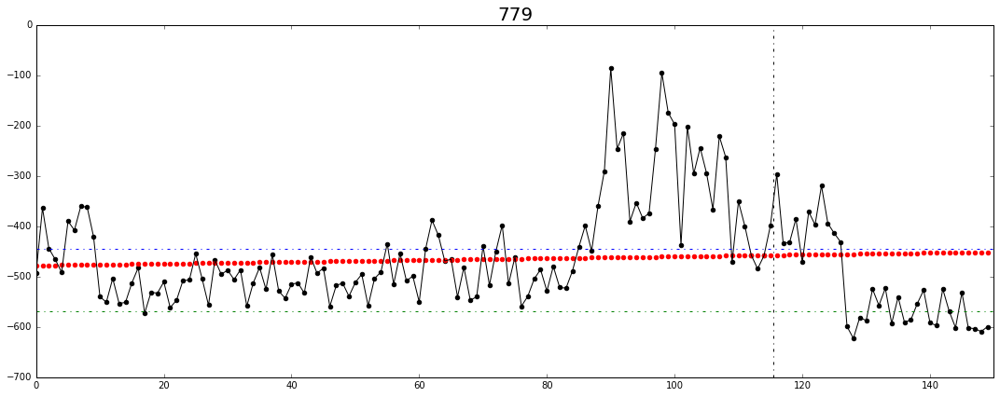

mean diff= 87.2712287324
sigma front = 84.2933126958
sigma end = 38.5305281861


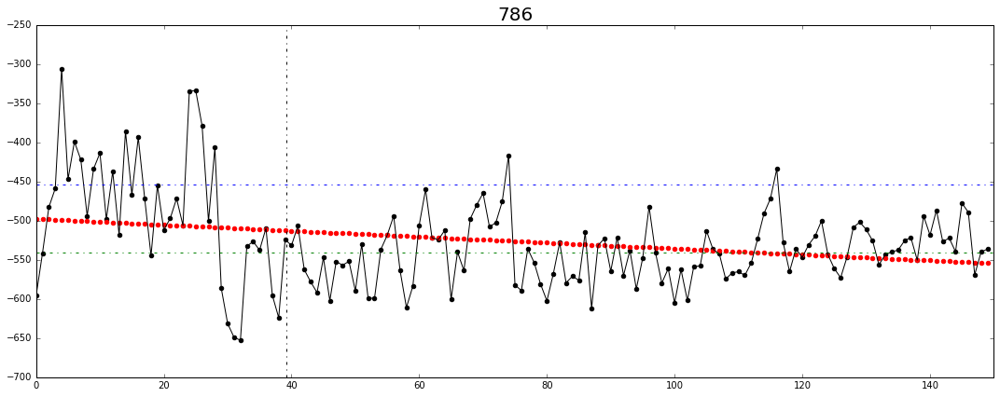

mean diff= 95.6704573404
sigma front = 47.3745972037
sigma end = 14.6855979606


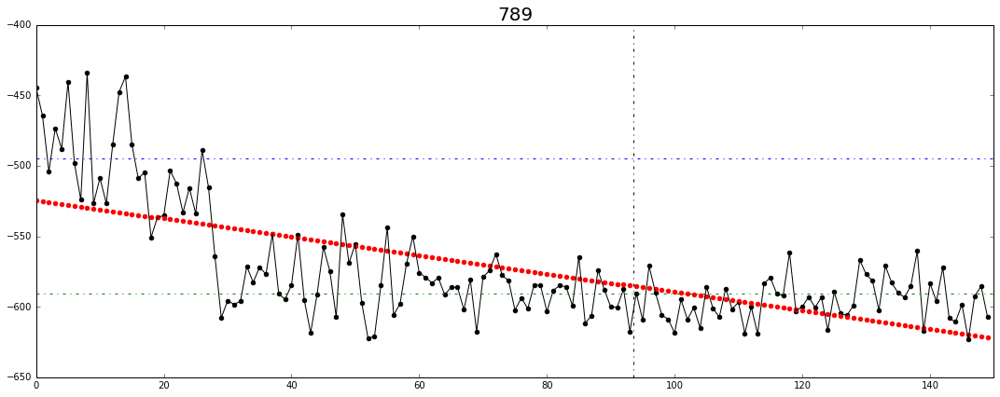

mean diff= 234.580259952
sigma front = 104.574940434
sigma end = 122.080315296


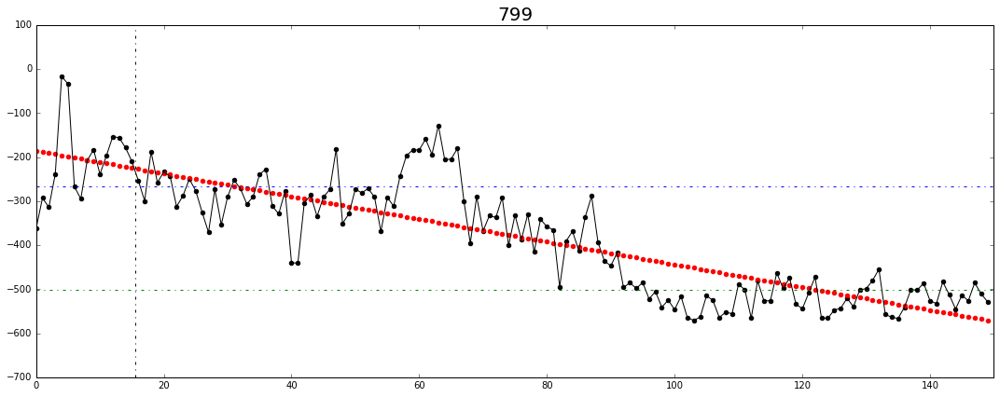

mean diff= 127.938093725
sigma front = 87.7220999795
sigma end = 25.7031671198


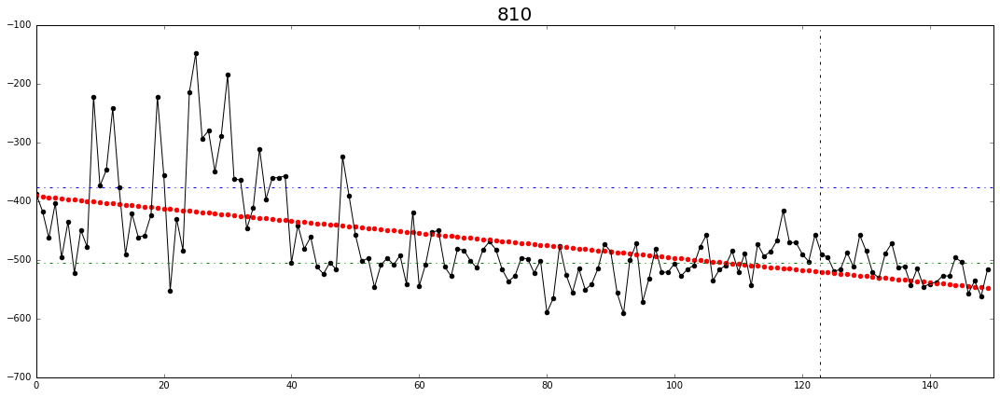

mean diff= 172.573600145
sigma front = 120.852473588
sigma end = 21.0958152306


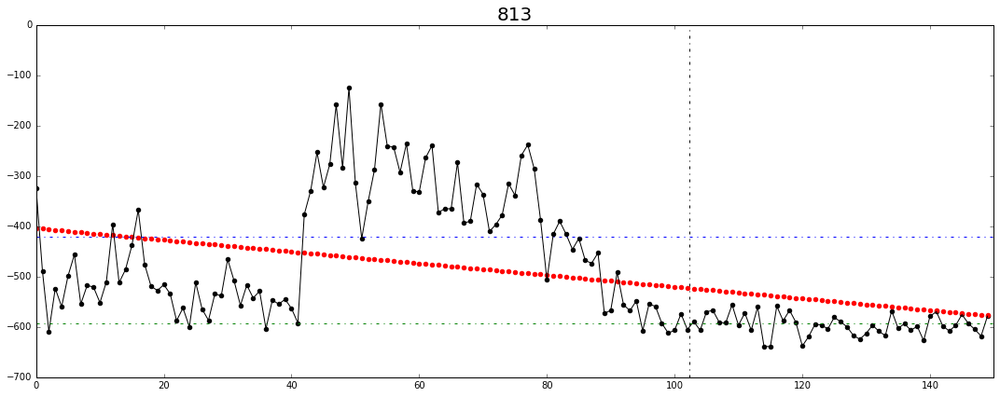

mean diff= 327.290117733
sigma front = 131.089158246
sigma end = 42.4298615488


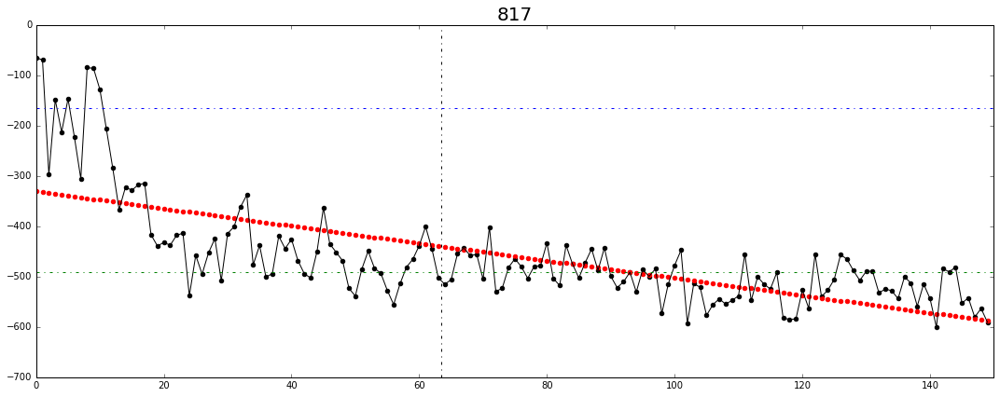

mean diff= 175.991728637
sigma front = 109.952445233
sigma end = 16.0254566285


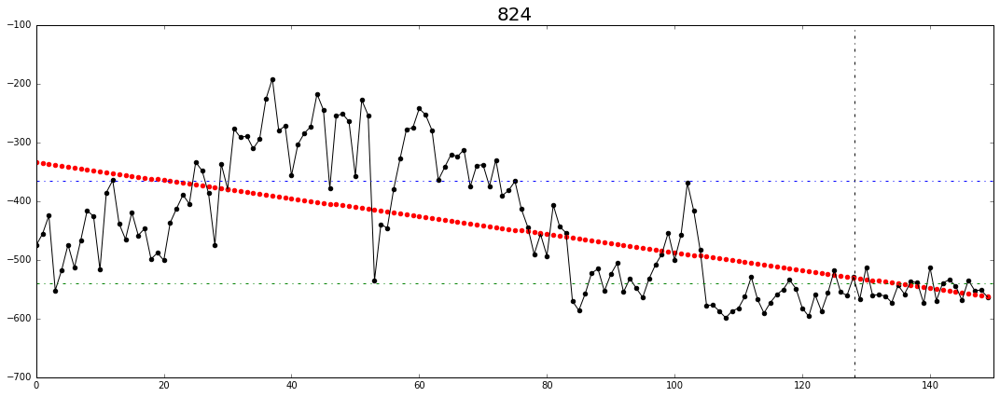

mean diff= 373.691438817
sigma front = 161.403638667
sigma end = 32.3520408983


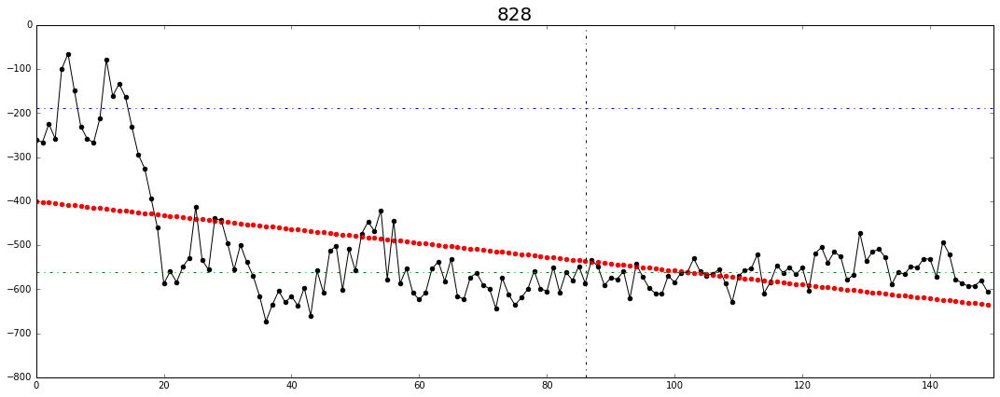

mean diff= 178.720476913
sigma front = 94.0096179745
sigma end = 92.9393921525


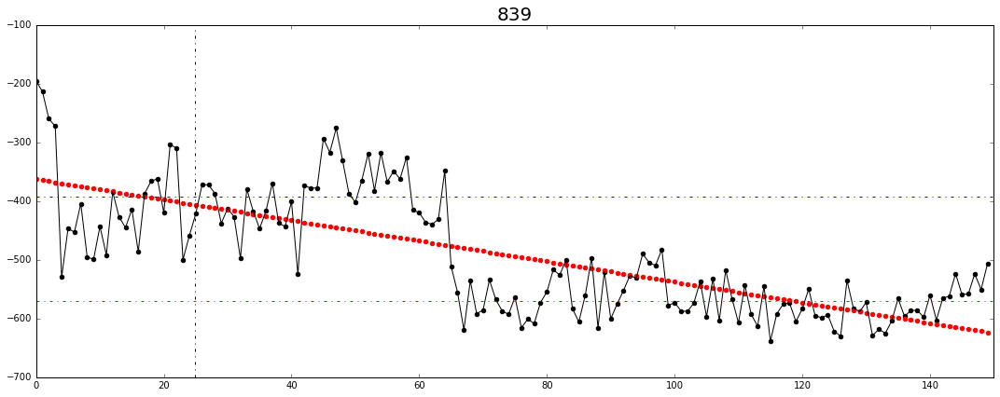

mean diff= 85.2411155454
sigma front = 48.2247368485
sigma end = nan


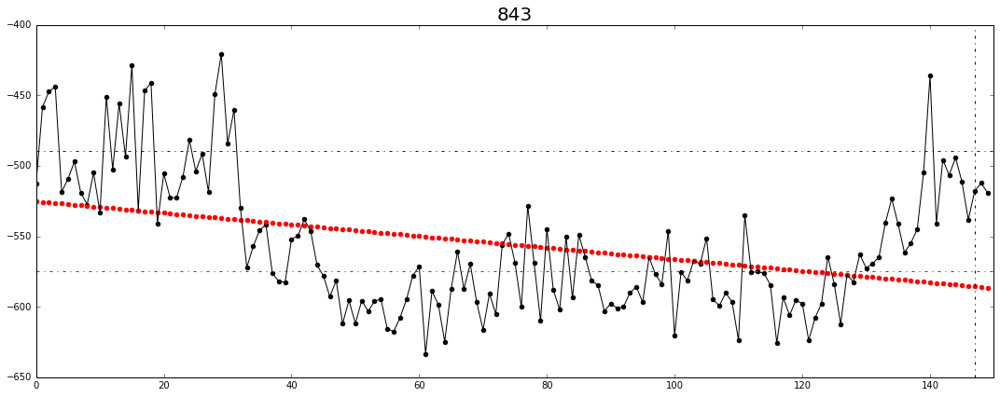

mean diff= 78.7268126426
sigma front = 42.0152483996
sigma end = 38.5927881281


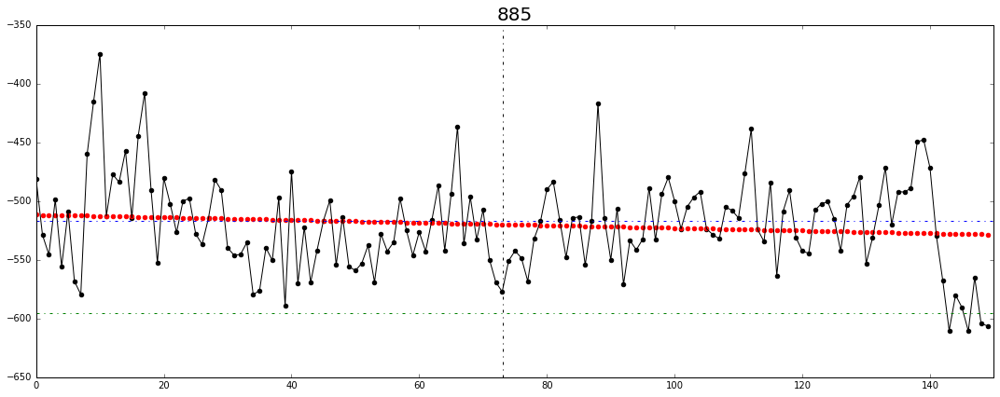

mean diff= 117.023812326
sigma front = 60.4200453081
sigma end = 19.7679699707


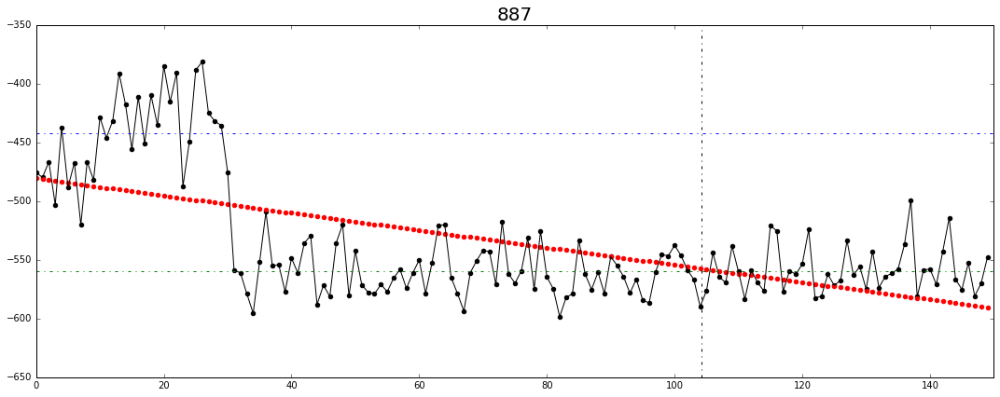

mean diff= 364.344718614
sigma front = 162.408360632
sigma end = 32.9055620868


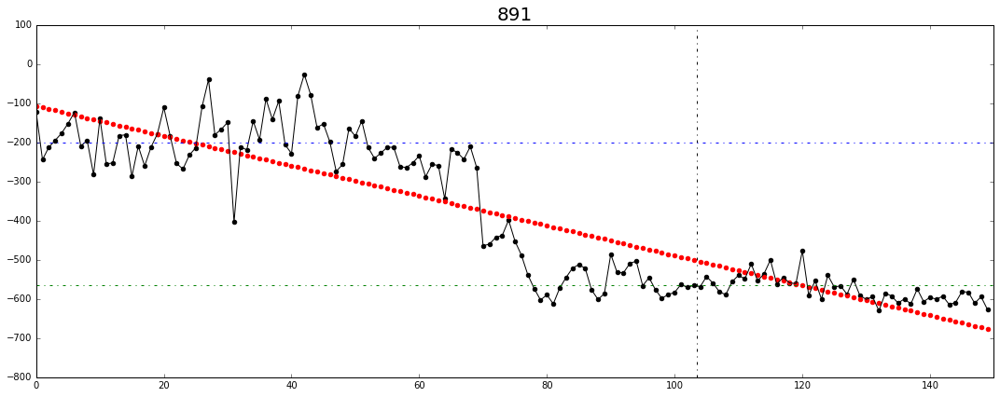

mean diff= 210.138064082
sigma front = 133.054477903
sigma end = 95.7875448137


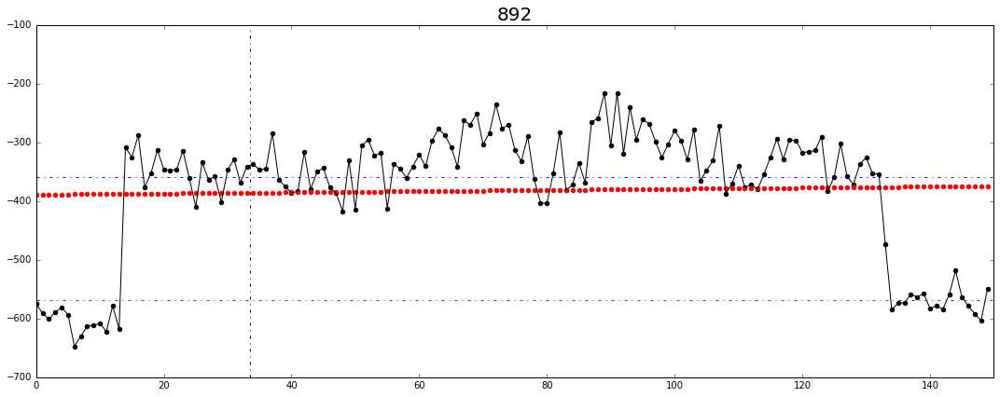

mean diff= 171.625967004
sigma front = 74.9305509364
sigma end = 32.2795042818


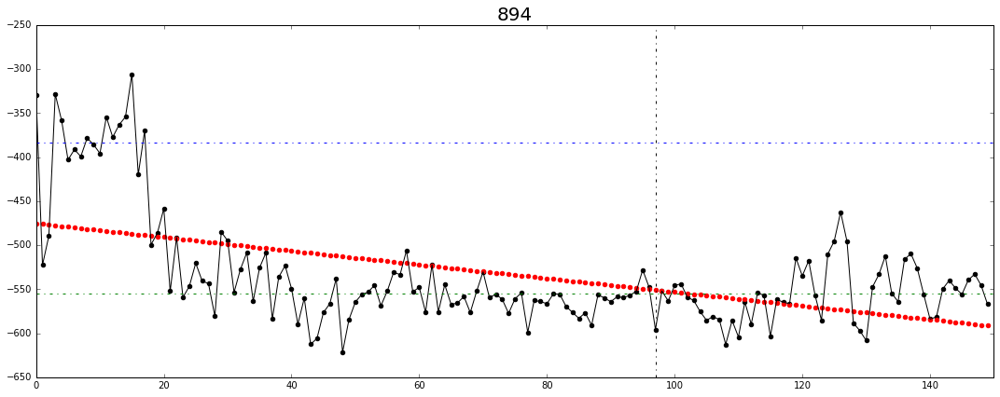

mean diff= 104.296289676
sigma front = 50.7255201327
sigma end = 44.0390244935


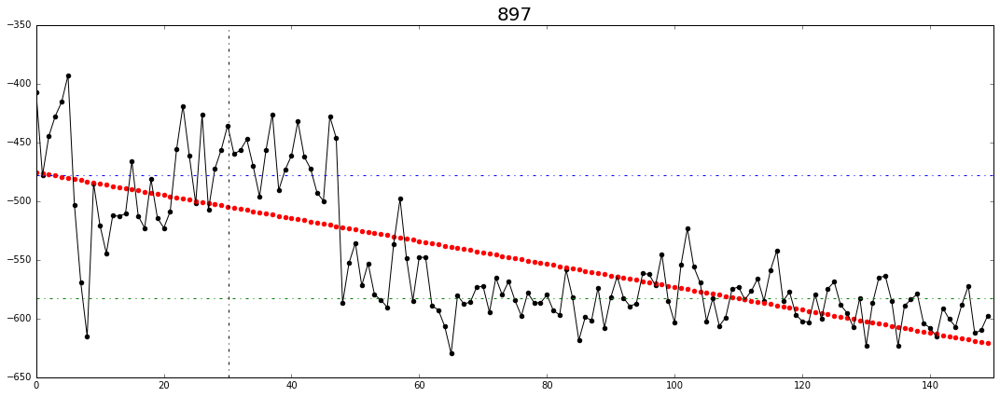

mean diff= 235.192110259
sigma front = 96.1743606429
sigma end = nan


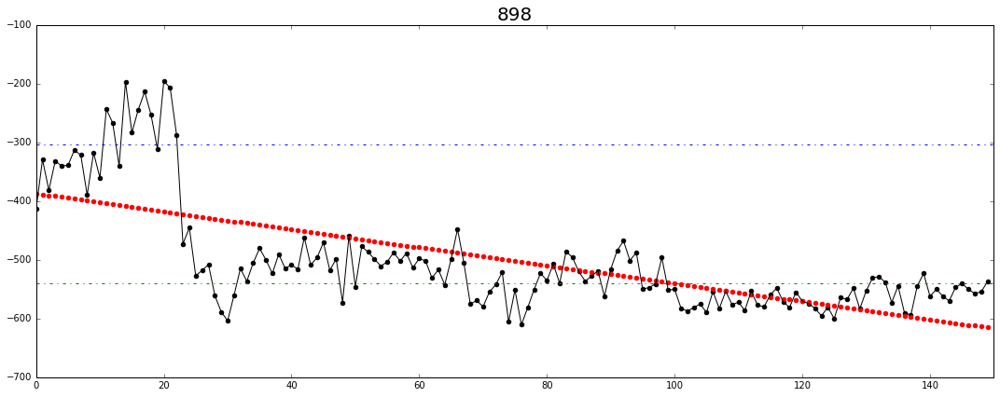

mean diff= 292.714244116
sigma front = 107.806762076
sigma end = 40.6135167039


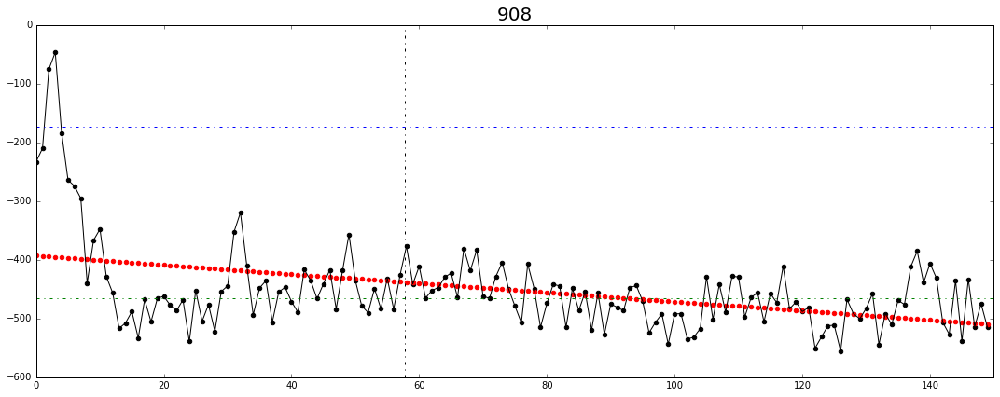

mean diff= 72.1685368317
sigma front = 53.7857386068
sigma end = 18.8739852066


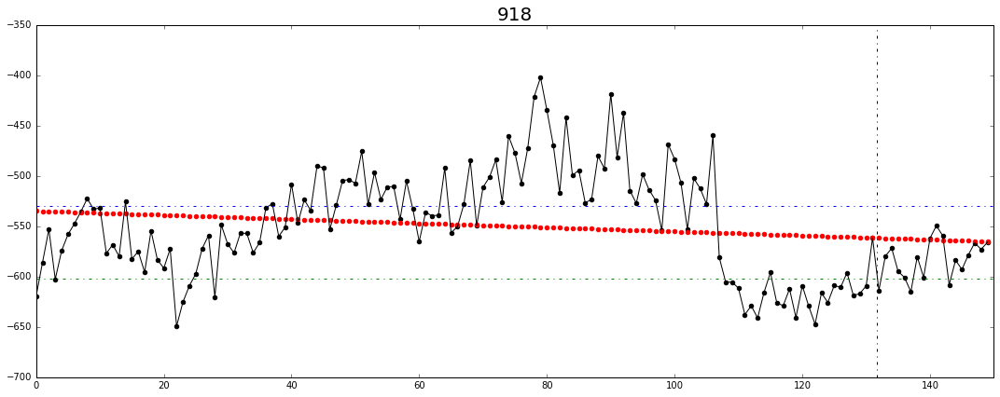

mean diff= 105.261313941
sigma front = 73.6656985247
sigma end = 23.1474517153


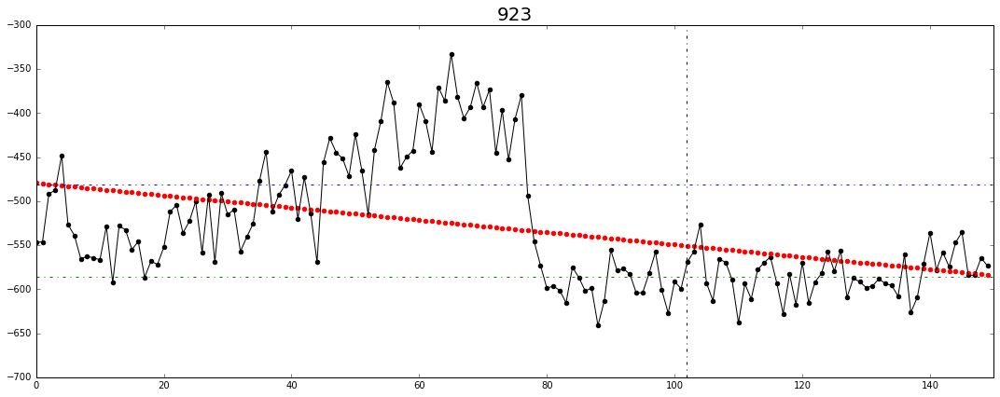

mean diff= 100.138950503
sigma front = 45.0995897107
sigma end = 15.9582322602


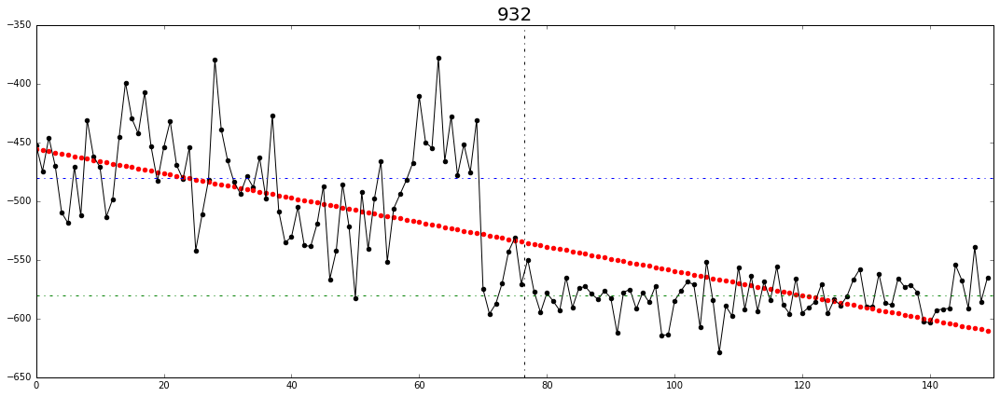

mean diff= 159.747716742
sigma front = 87.4756198891
sigma end = 35.7063318351


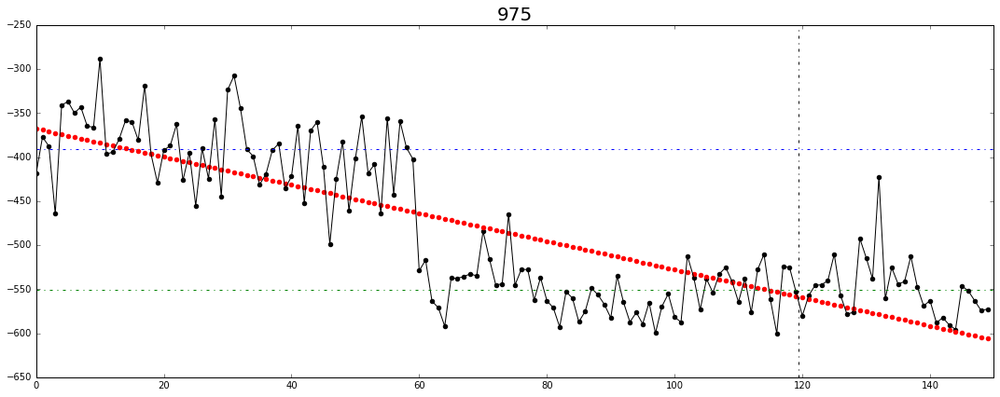

mean diff= 128.913210667
sigma front = 71.4721501605
sigma end = 39.2596747834


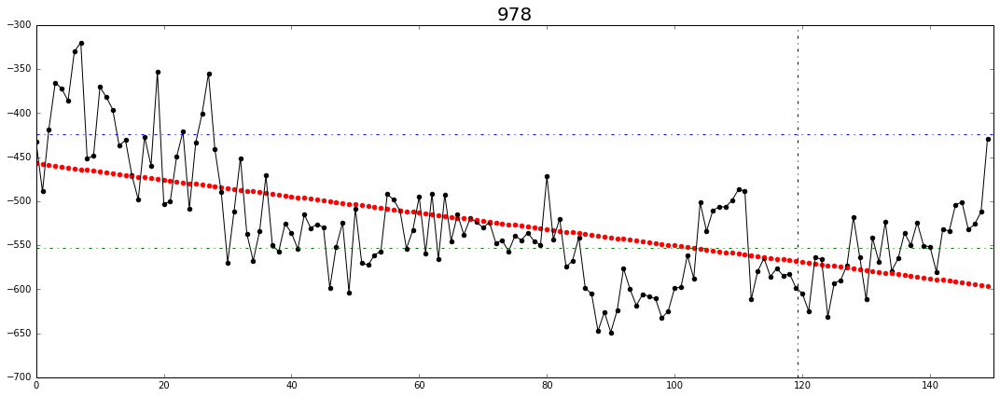

mean diff= 117.056357138
sigma front = 44.6183337858
sigma end = 77.6105747641


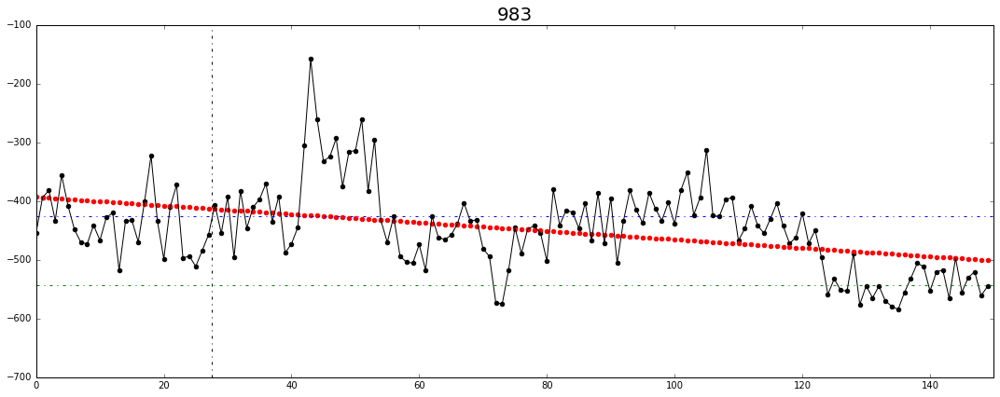

mean diff= 174.132264188
sigma front = 84.0033826136
sigma end = 29.4891935927


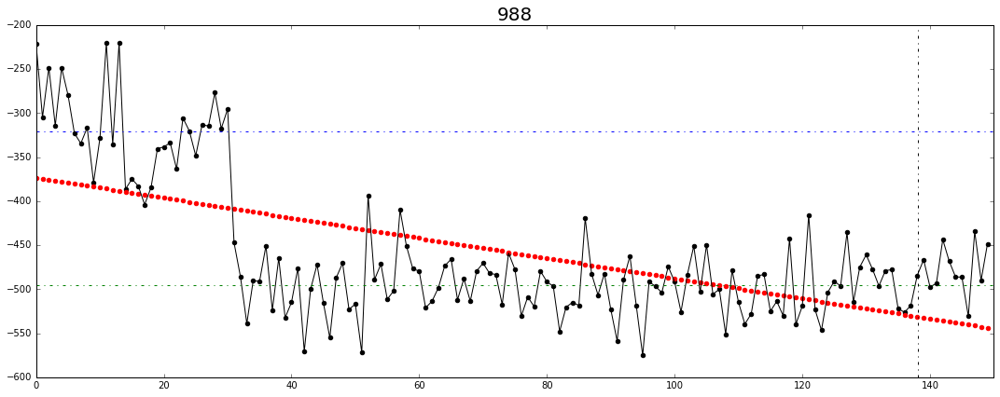

mean diff= 96.8615424686
sigma front = 52.2324131498
sigma end = 65.1372702167


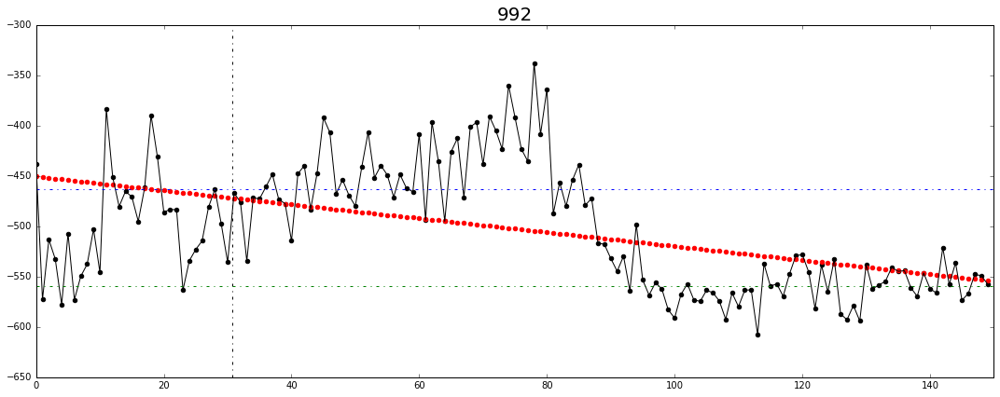

mean diff= 120.918799286
sigma front = 60.5342691433
sigma end = 30.6780402774


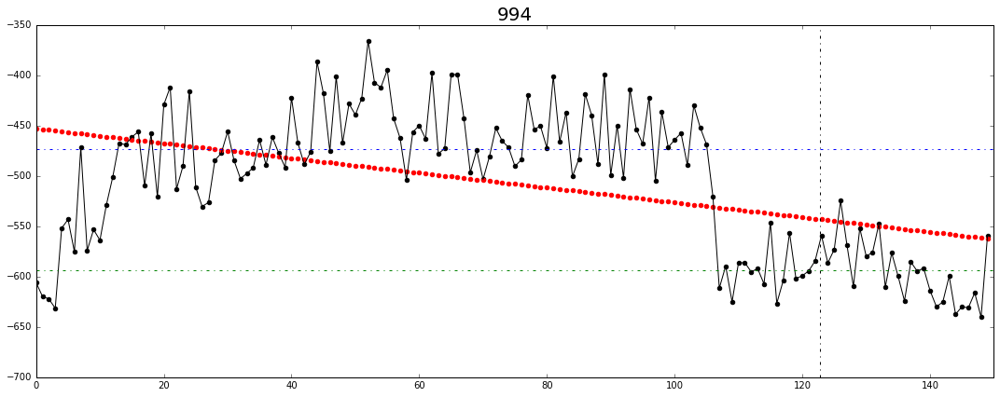

mean diff= 144.528710474
sigma front = 44.2920380764
sigma end = 28.9470943233


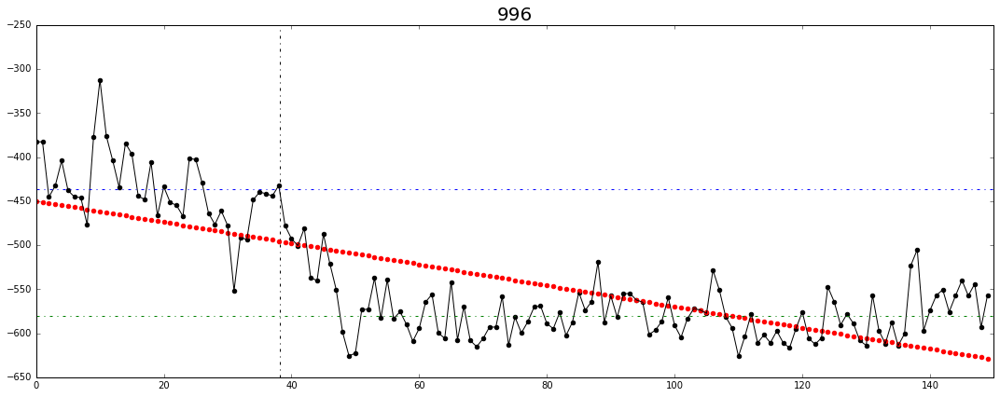

mean diff= 184.527678166
sigma front = 87.1061673127
sigma end = 49.6771176404


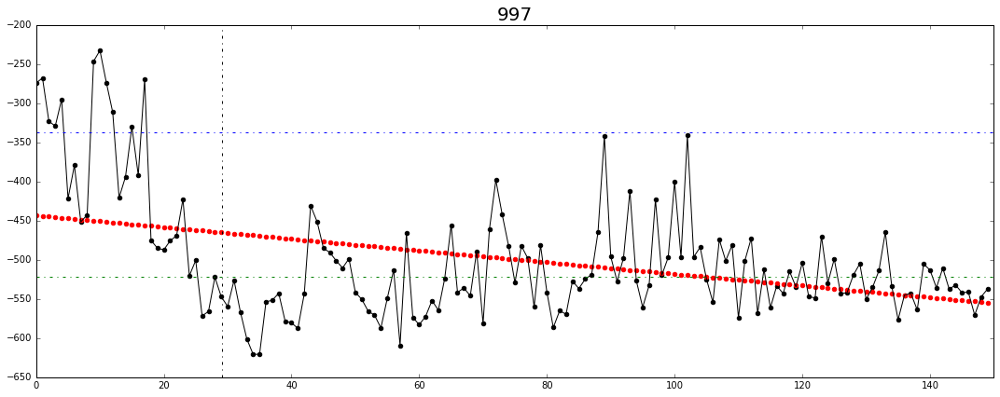

mean diff= 183.092638086
sigma front = 144.617683916
sigma end = 53.3994558594


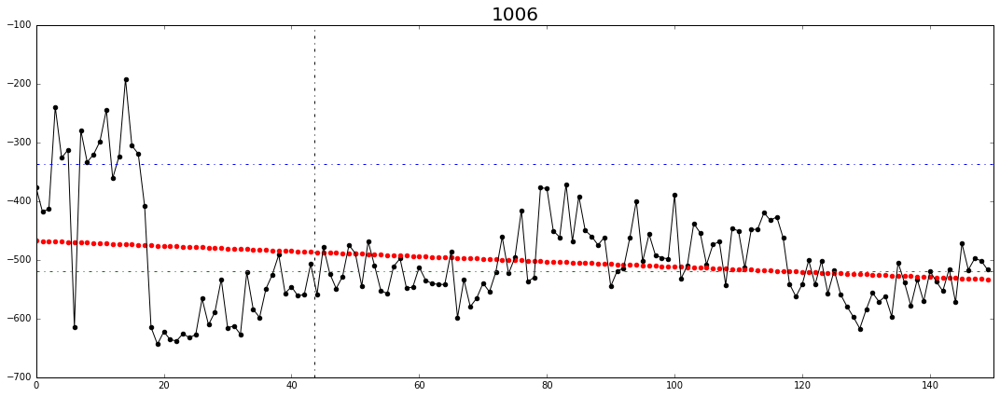

mean diff= 197.807225999
sigma front = 44.0494769044
sigma end = 96.6533467117


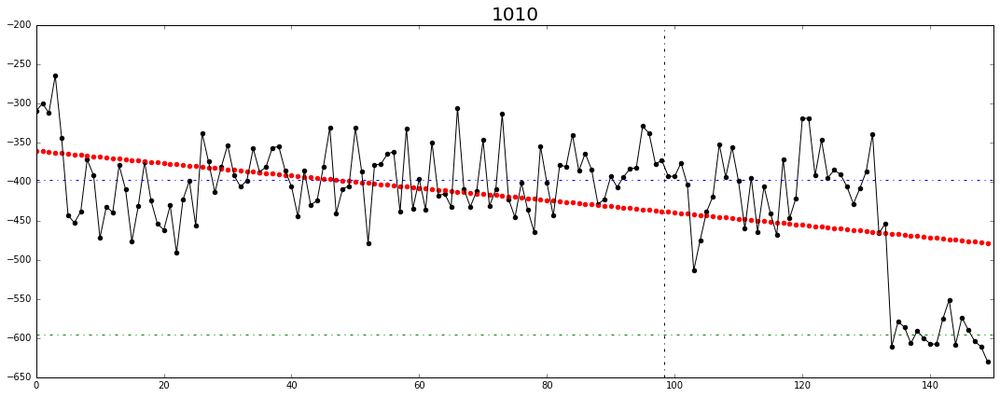

mean diff= 112.492567798
sigma front = 28.4975074486
sigma end = 69.1085909826


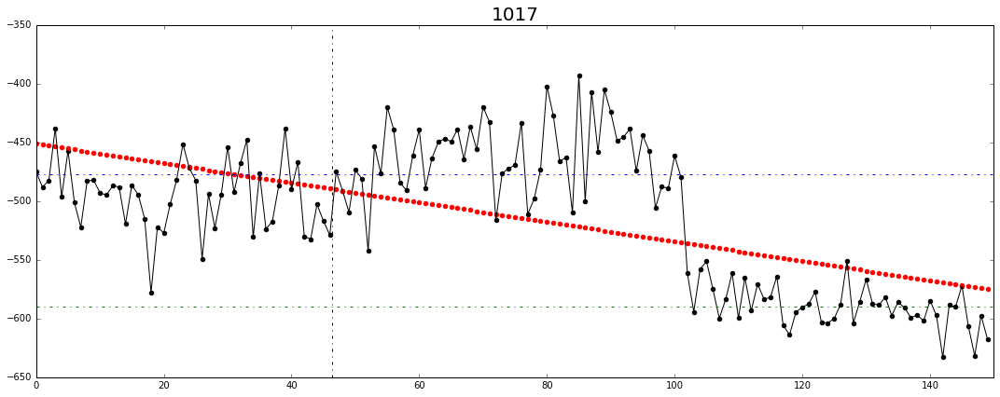

mean diff= 263.235250924
sigma front = 122.01831023
sigma end = 15.9742283289


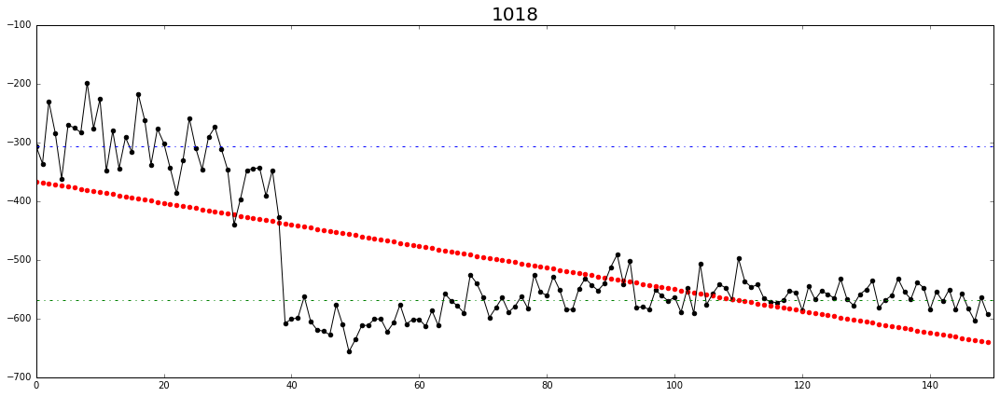

mean diff= 89.6999404745
sigma front = 57.4129668406
sigma end = 22.6302100118


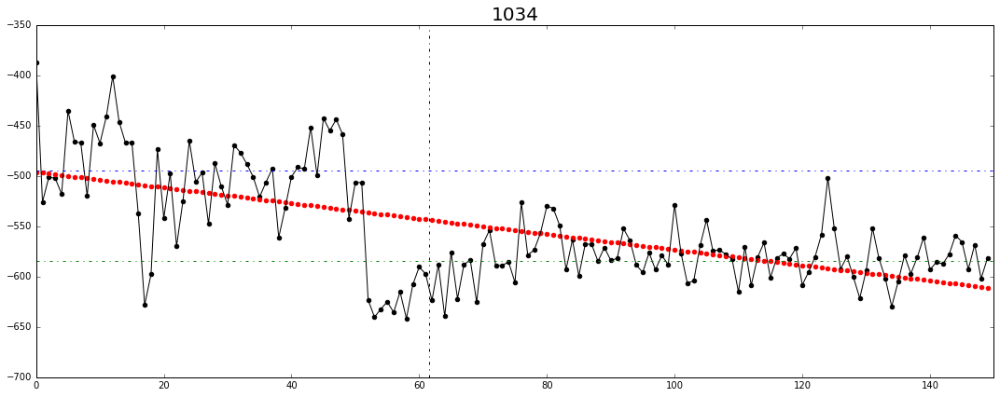

mean diff= 99.9035882668
sigma front = 39.5040799225
sigma end = 57.6437382372


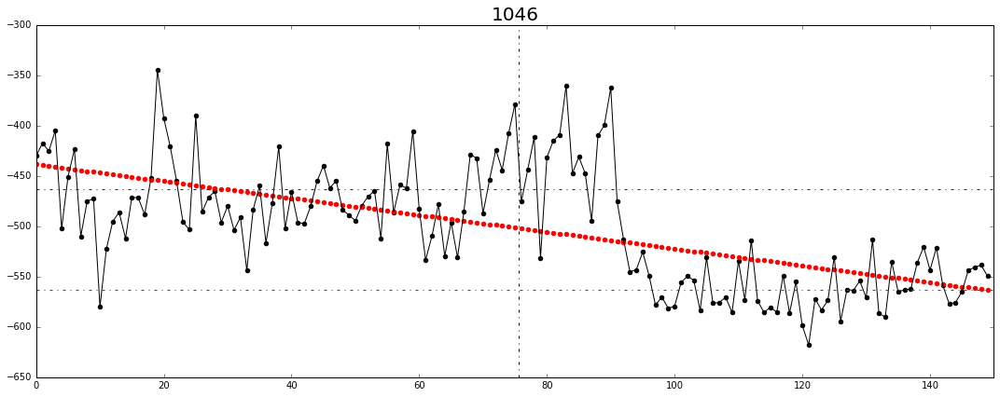

mean diff= 75.3032941263
sigma front = 47.1303830818
sigma end = 15.1420921767


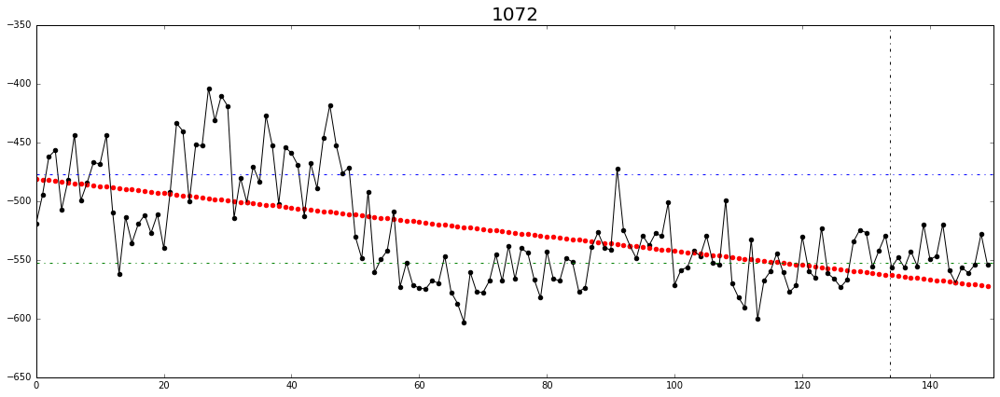

mean diff= 138.578180437
sigma front = 28.2460251019
sigma end = 48.7363755788


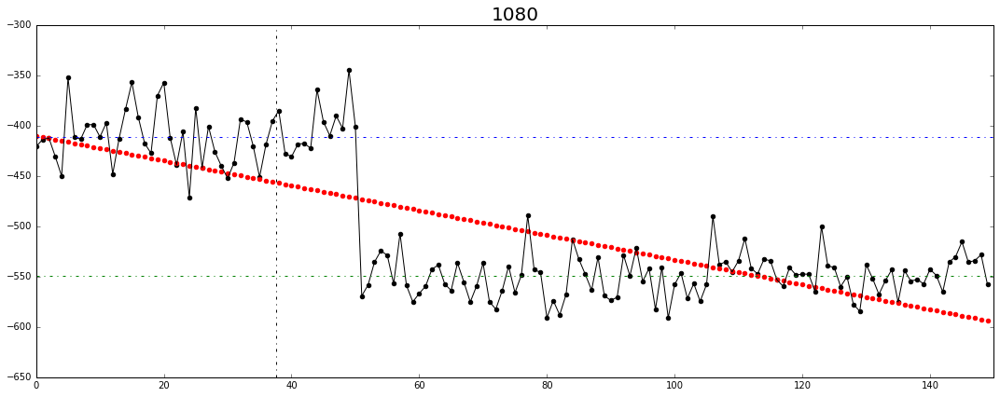

mean diff= 89.382816608
sigma front = 32.614732435
sigma end = 31.004064376


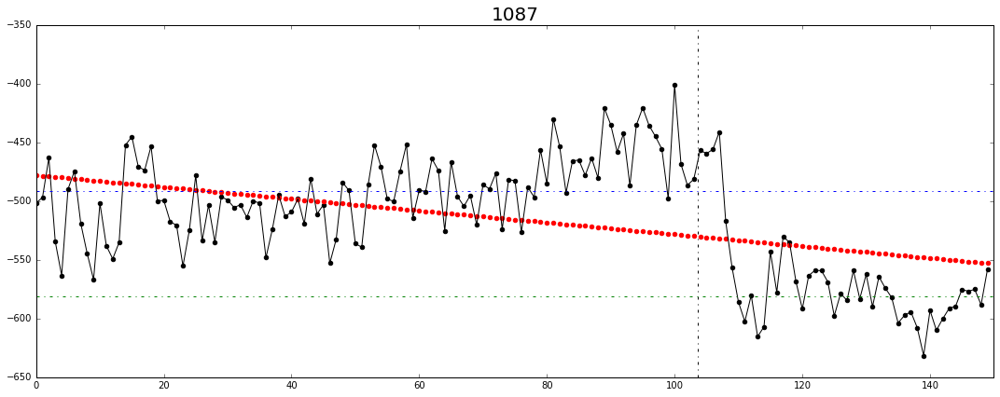

mean diff= 177.271644417
sigma front = 38.2034261526
sigma end = 85.1007390123


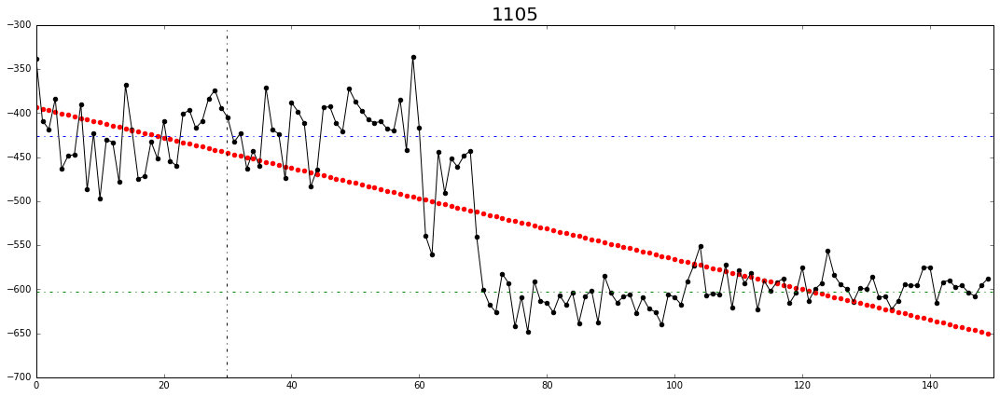

mean diff= 179.901971559
sigma front = 62.1849705692
sigma end = 33.3010901781


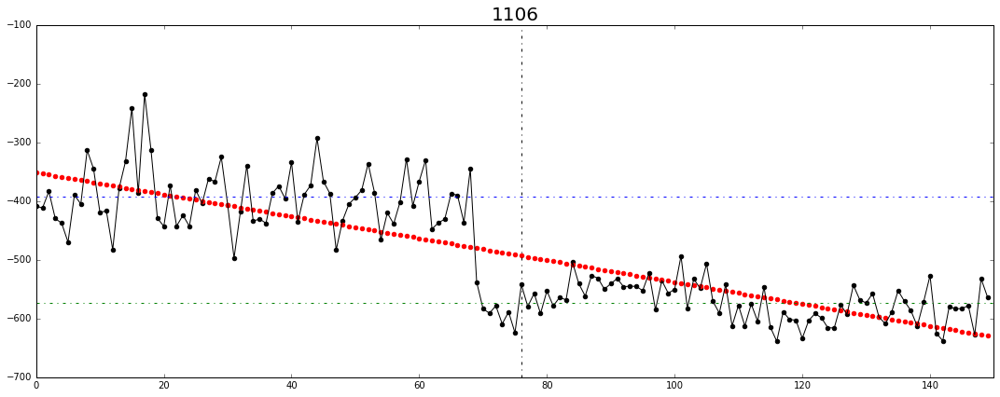

mean diff= 91.9581868148
sigma front = 70.3591528313
sigma end = 19.104007988


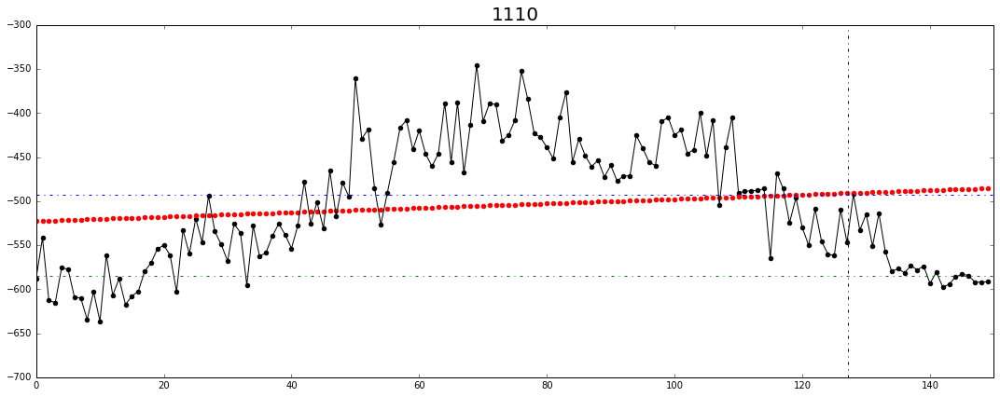

mean diff= 129.705022337
sigma front = 61.8321148265
sigma end = nan


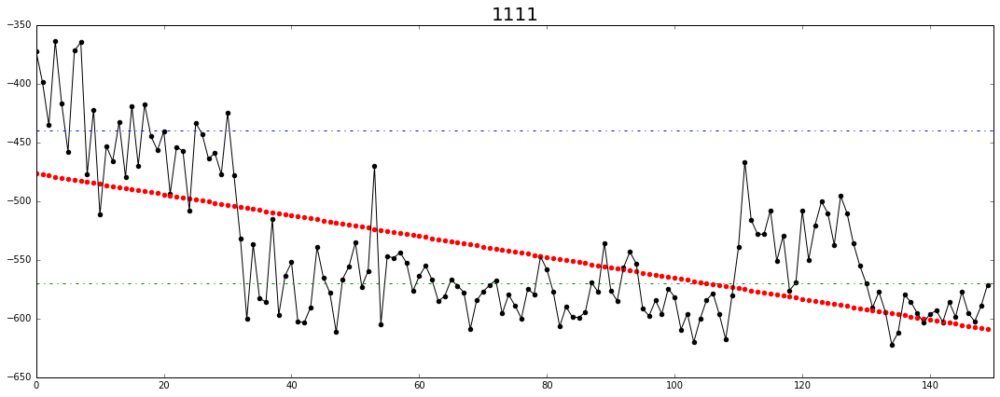

mean diff= 102.876839887
sigma front = 45.116462454
sigma end = 41.768776865


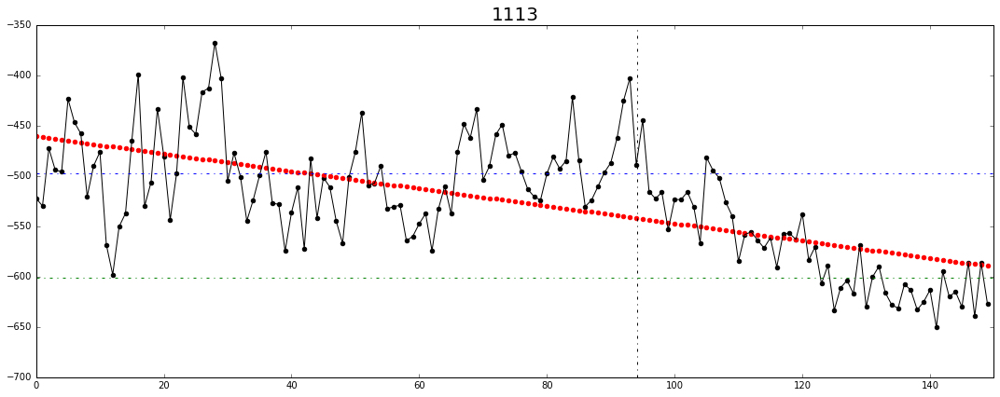

mean diff= 208.476853497
sigma front = 112.513325464
sigma end = 18.1106161826


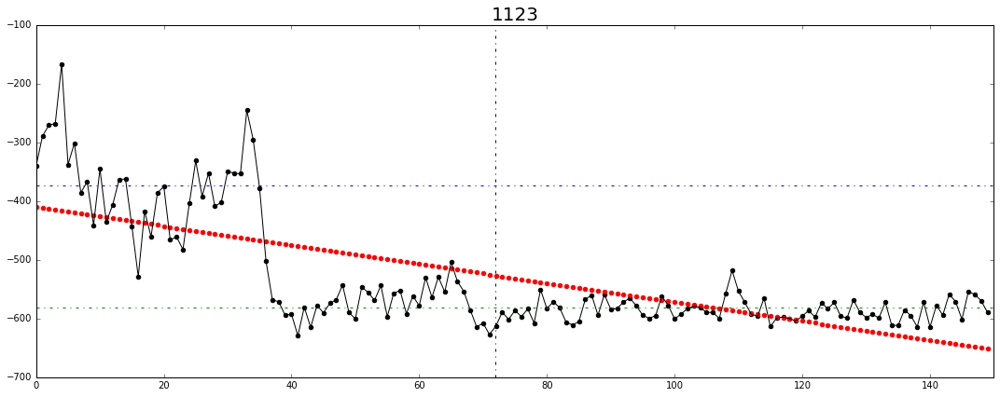

mean diff= 142.695951364
sigma front = 82.6446928821
sigma end = 17.0702837653


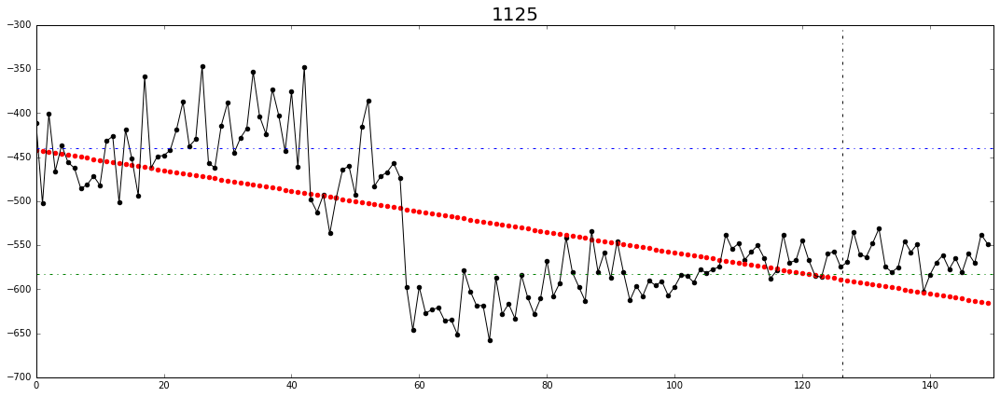

mean diff= 232.751148057
sigma front = 100.669082868
sigma end = 136.247780066


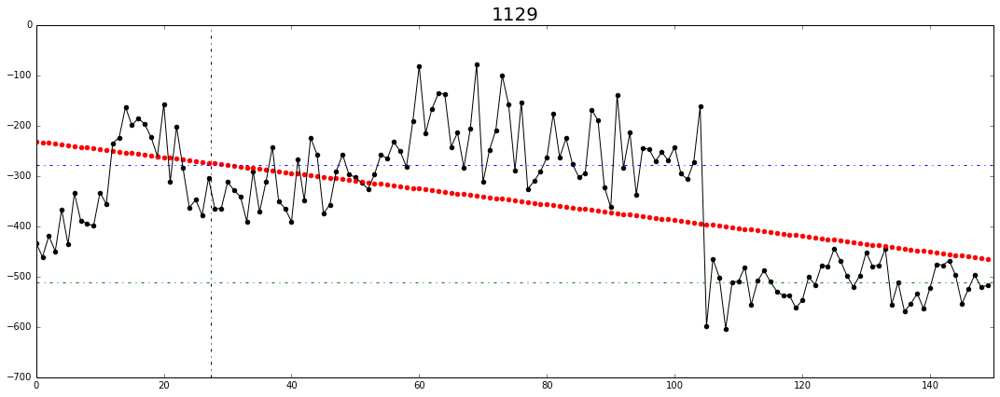

mean diff= 252.13038199
sigma front = 61.520350587
sigma end = 110.55220692


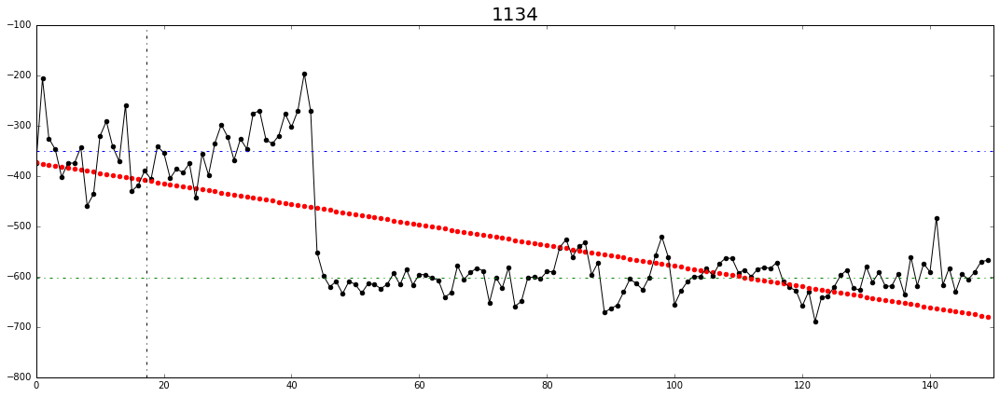

mean diff= 184.15052186
sigma front = 102.812050561
sigma end = 31.1100550252


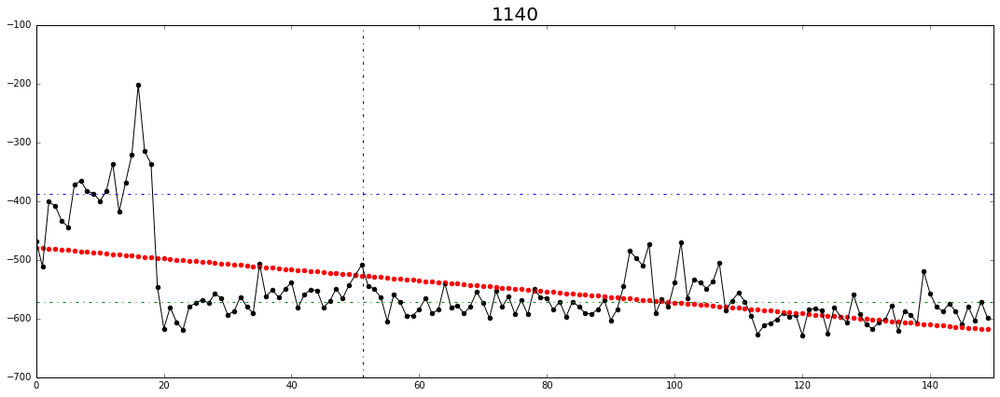

mean diff= 185.559158231
sigma front = 89.723944586
sigma end = 15.1685851591


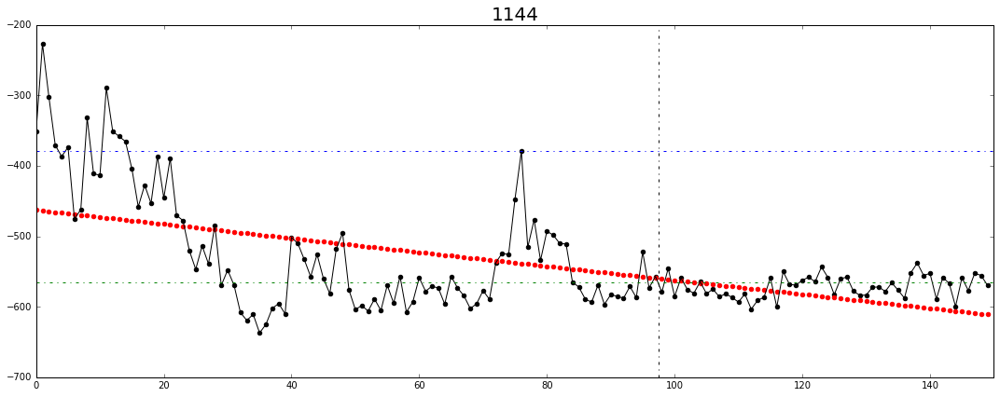

mean diff= 209.648232816
sigma front = 91.9300583502
sigma end = 31.9383444264


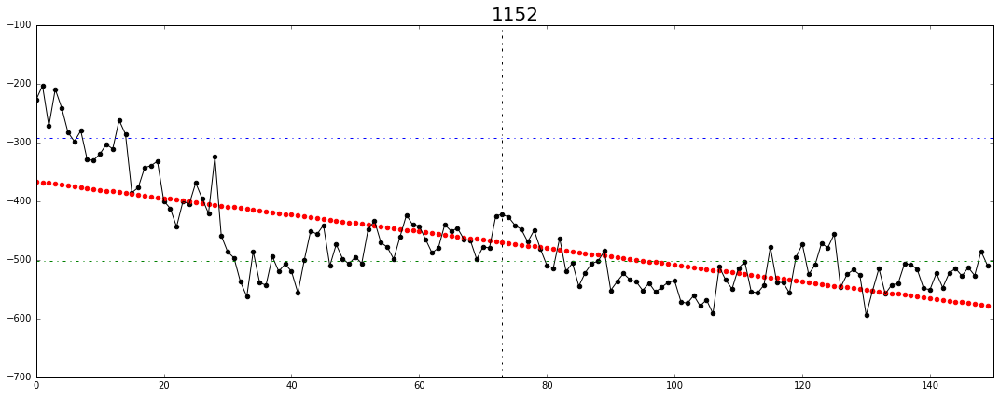

mean diff= 73.1135875614
sigma front = 46.2478732644
sigma end = 20.3604329421


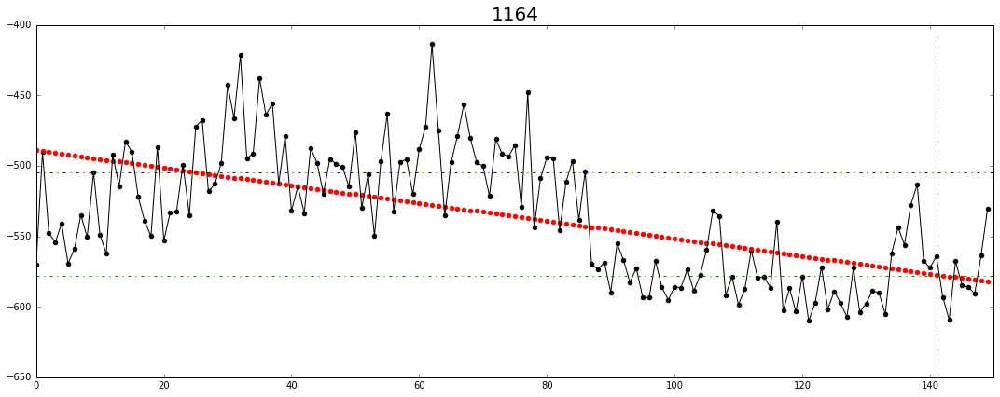

mean diff= 82.5763231635
sigma front = 55.2184237931
sigma end = 36.303840171


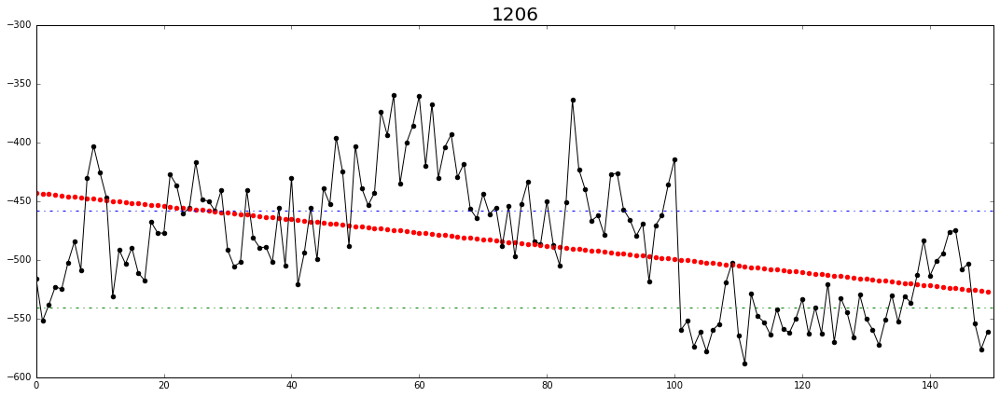

mean diff= 150.681828499
sigma front = 87.4668331253
sigma end = 30.0005601097


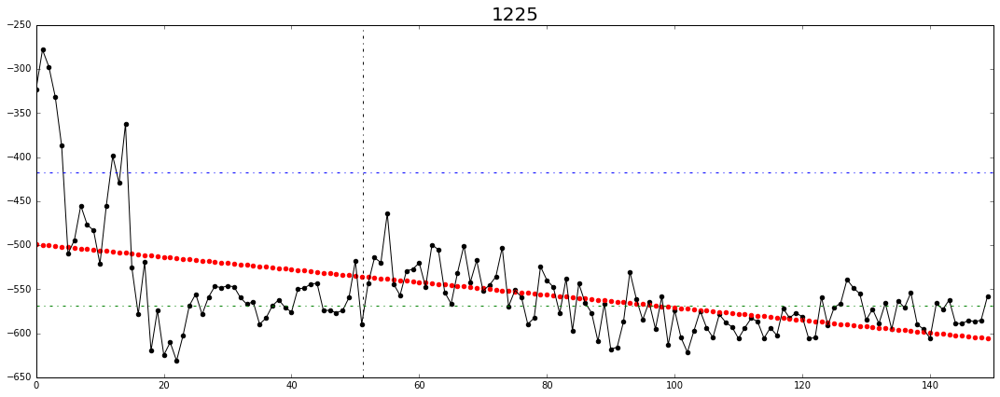

mean diff= 265.79447951
sigma front = 145.541759519
sigma end = 13.3132330974


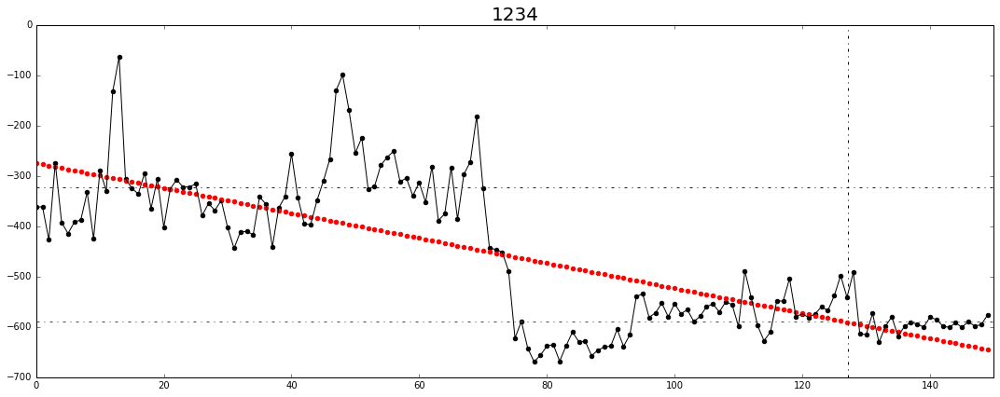

mean diff= 107.323688357
sigma front = 48.2995373069
sigma end = 18.1885951359


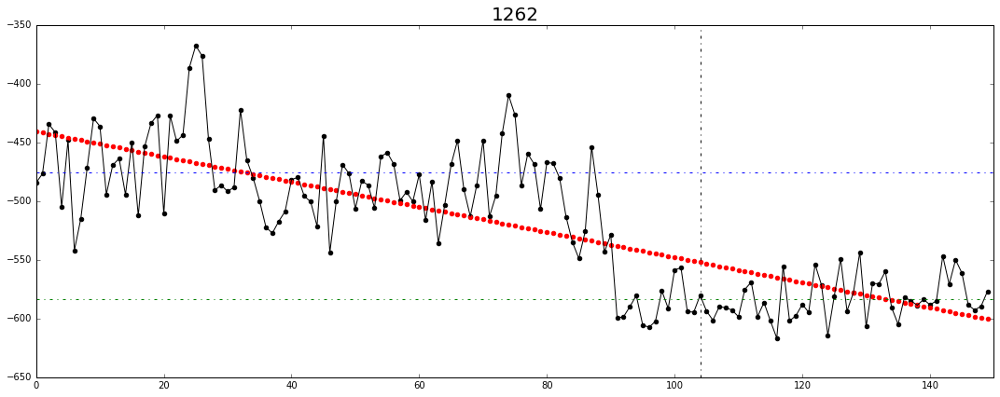

mean diff= 193.515363491
sigma front = 61.2797783291
sigma end = 16.2804253462


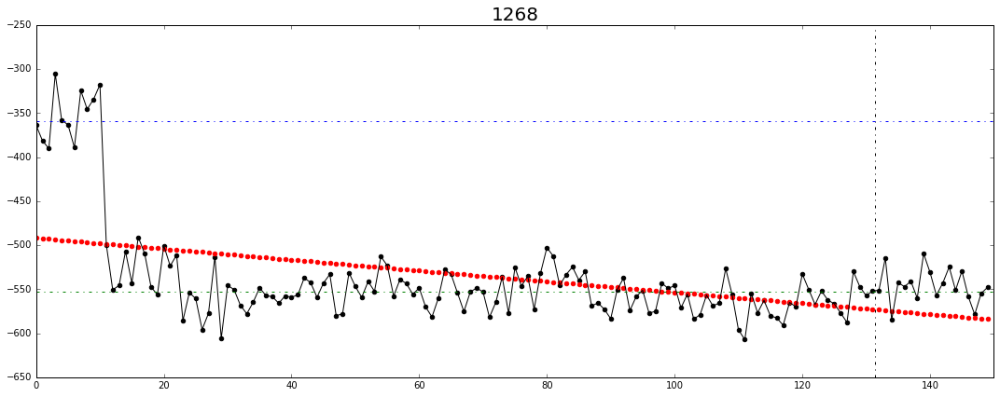

mean diff= 391.121239547
sigma front = 79.8889145391
sigma end = 123.270820304


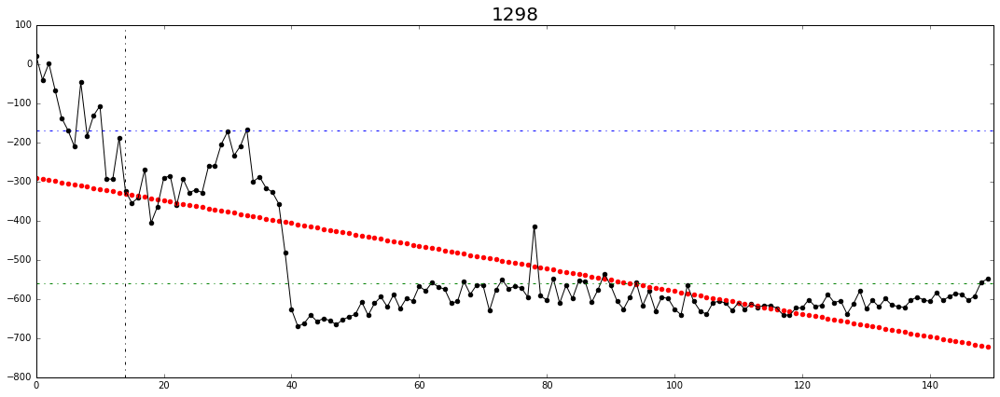

mean diff= 212.260997937
sigma front = 84.1613537992
sigma end = 87.0900734665


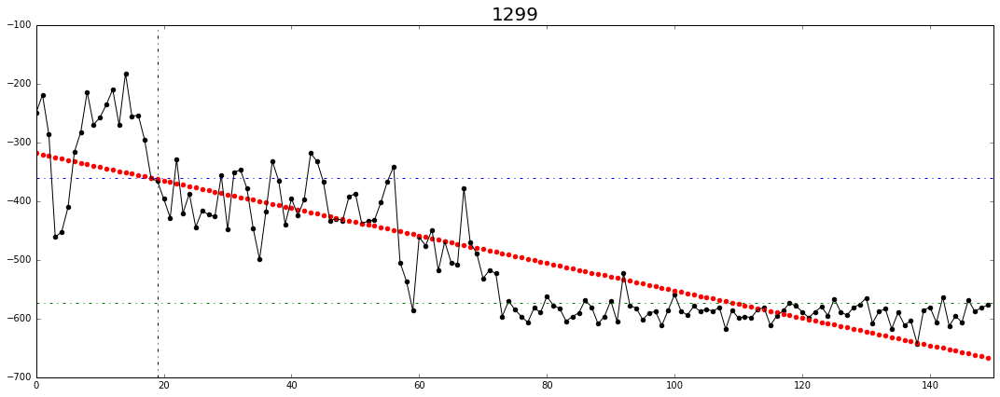

mean diff= 196.164724511
sigma front = 85.5253557666
sigma end = 40.584106877


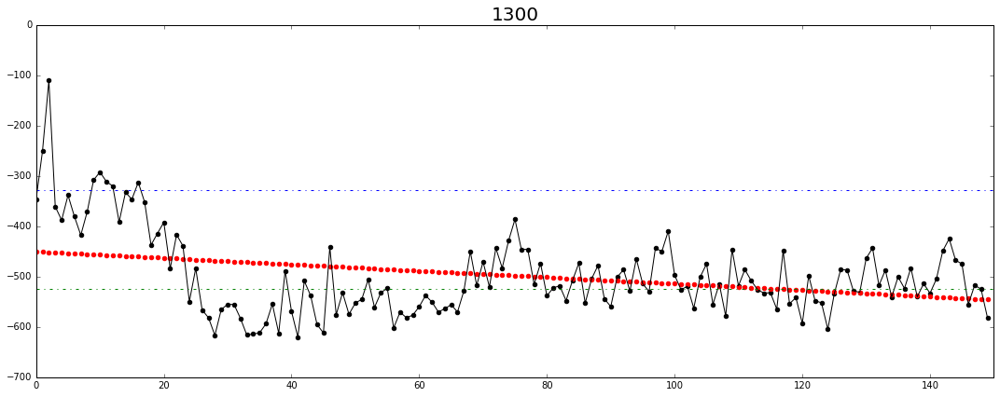

mean diff= 130.510605688
sigma front = 89.3332663906
sigma end = 51.9078091172


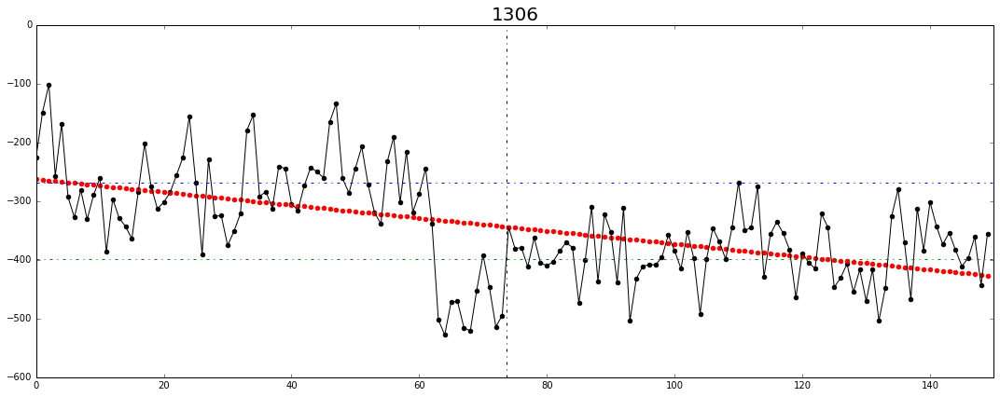

mean diff= 212.088061779
sigma front = 102.697642764
sigma end = 93.496494139


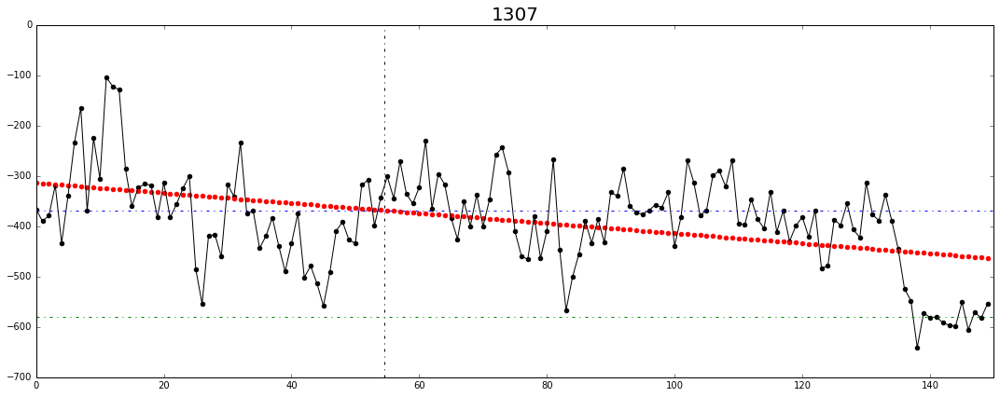

mean diff= 102.187547353
sigma front = 77.4235955378
sigma end = 28.6476548256


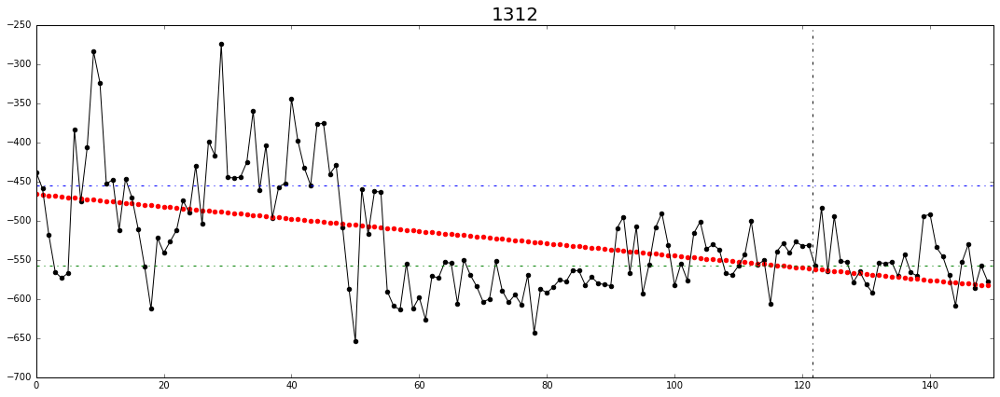

mean diff= 80.0435846993
sigma front = 79.0060694918
sigma end = 71.0968536563


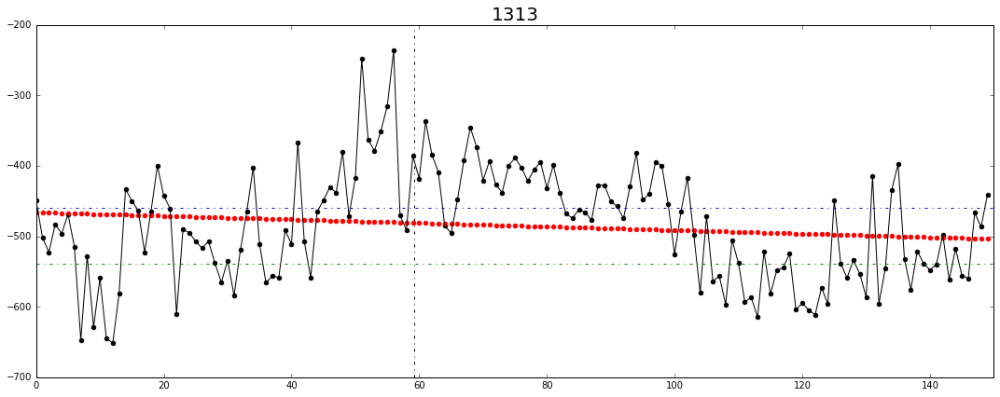

mean diff= 144.377357712
sigma front = 75.2661479231
sigma end = 36.2171923682


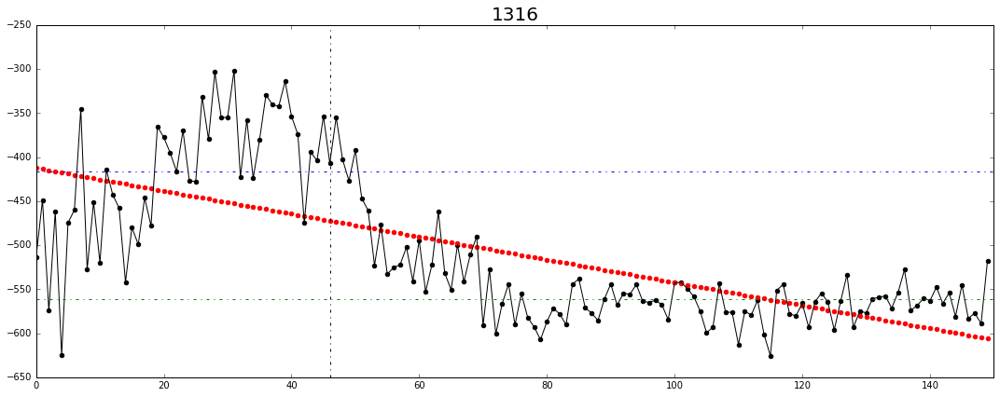

mean diff= 89.8751913438
sigma front = 98.6325904491
sigma end = 38.1691999054


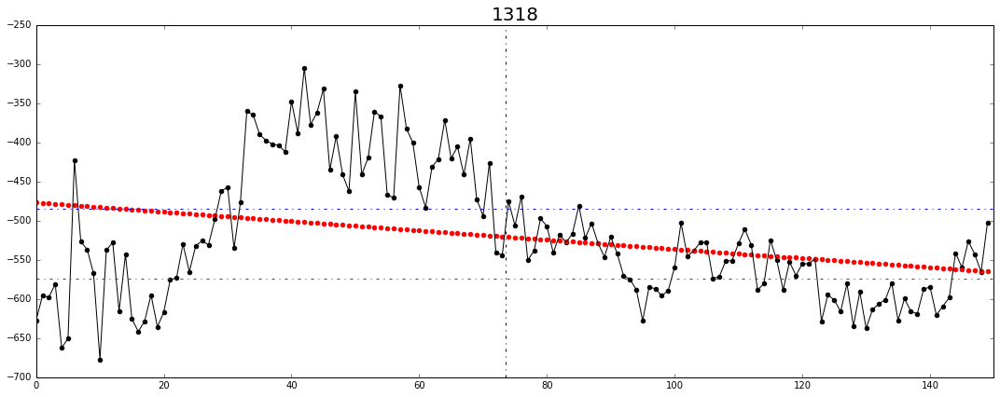

mean diff= 125.76882209
sigma front = 53.4637438359
sigma end = 91.3212928628


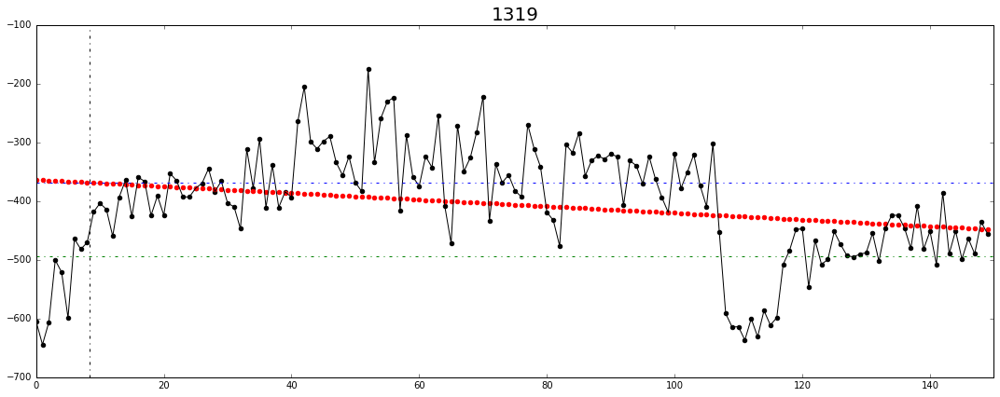

mean diff= 298.336834946
sigma front = 170.94738373
sigma end = 16.5082450862


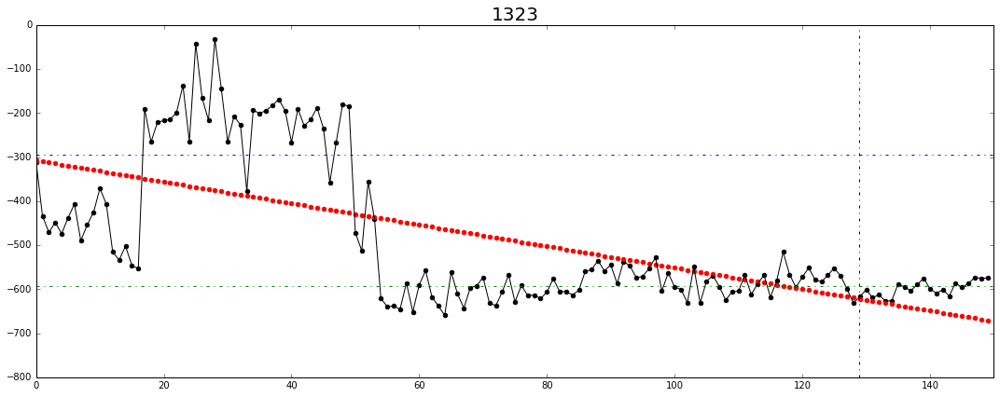

mean diff= 181.047966813
sigma front = 100.603826284
sigma end = 21.2394980067


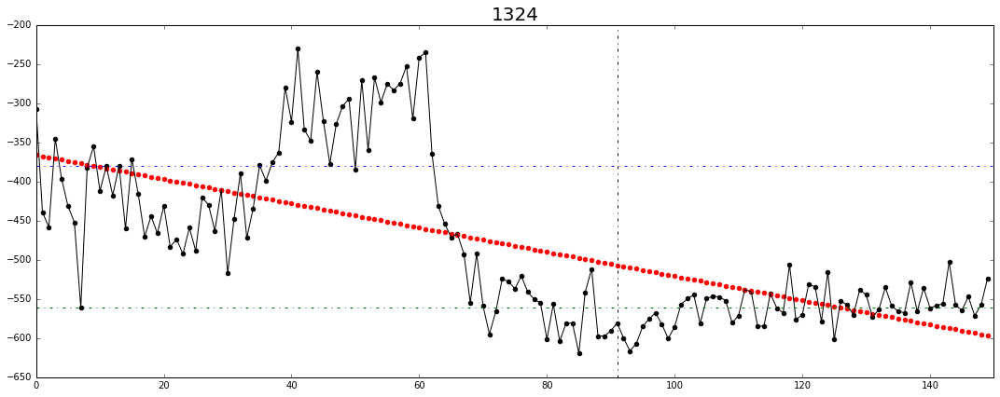

mean diff= 215.579585233
sigma front = 118.377127625
sigma end = 19.8020636932


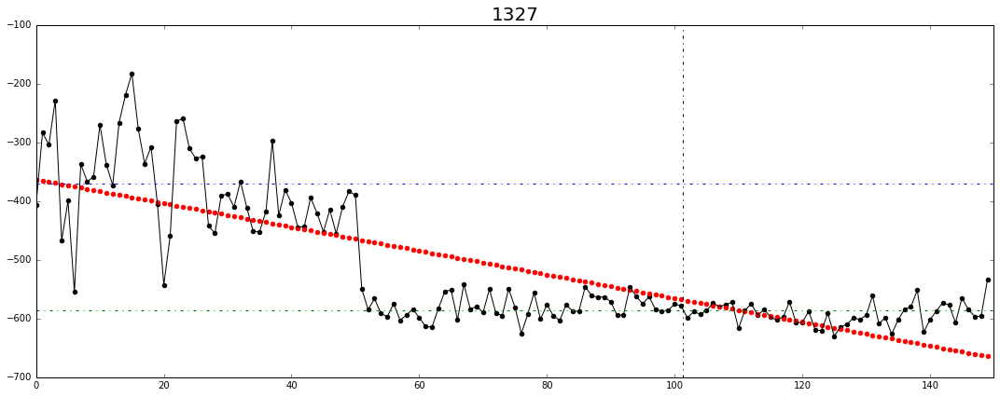

mean diff= 88.9175555226
sigma front = 53.6739925073
sigma end = 17.9661205566


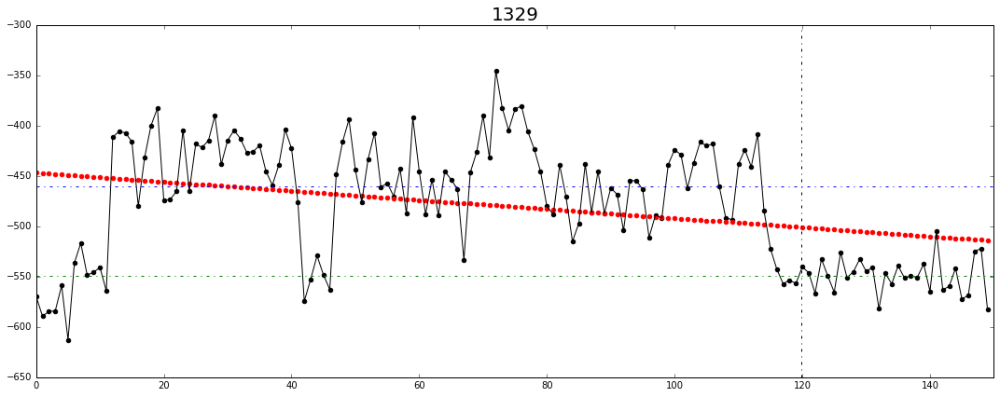

mean diff= 127.890447785
sigma front = 60.466005235
sigma end = 24.8934528767


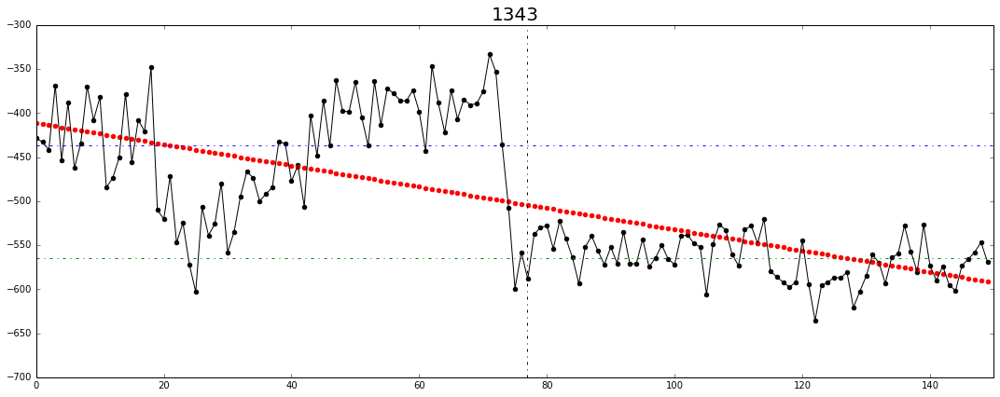

mean diff= 116.919589899
sigma front = 35.852723775
sigma end = 66.3596876917


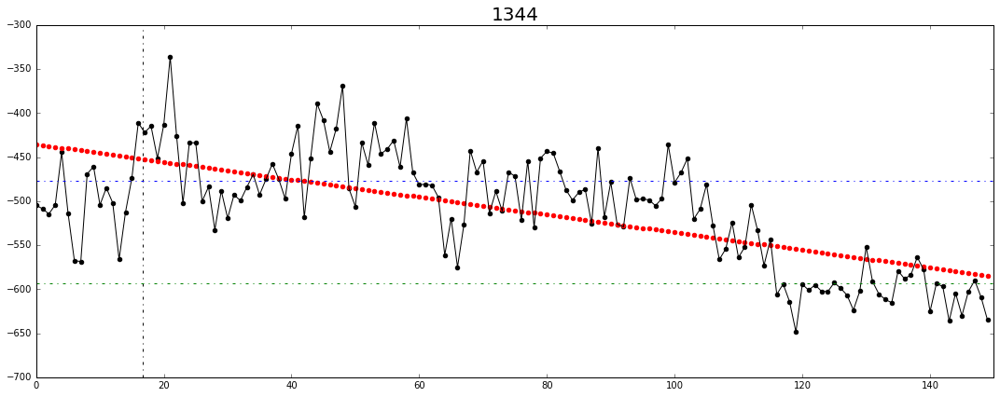

mean diff= 138.969734535
sigma front = 85.4530937241
sigma end = 8.25540832938


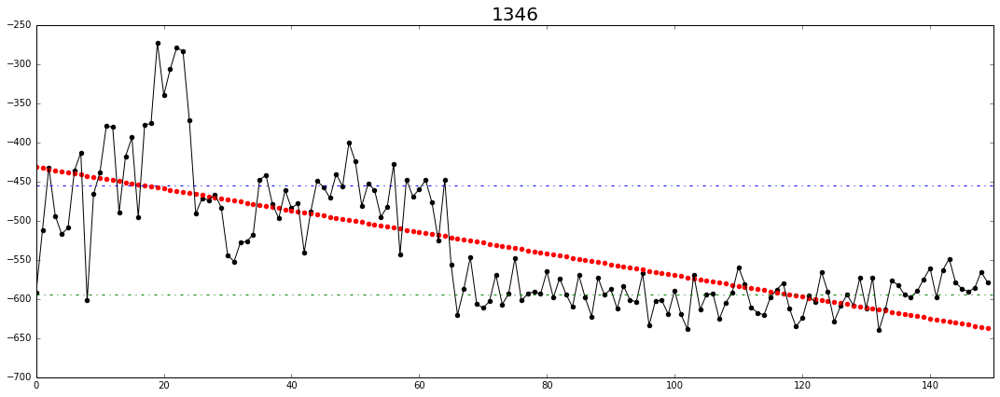

mean diff= 203.077630809
sigma front = 96.5443874317
sigma end = 101.063208607


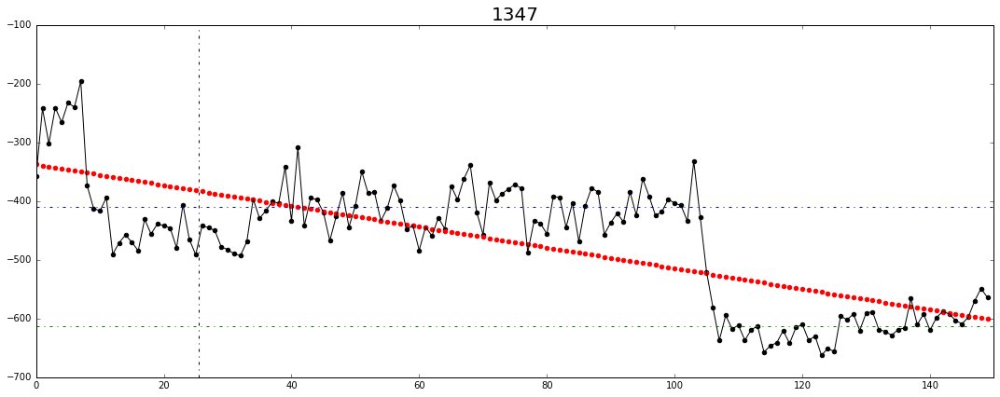

mean diff= 173.878169623
sigma front = 40.1677170909
sigma end = 82.8051878531


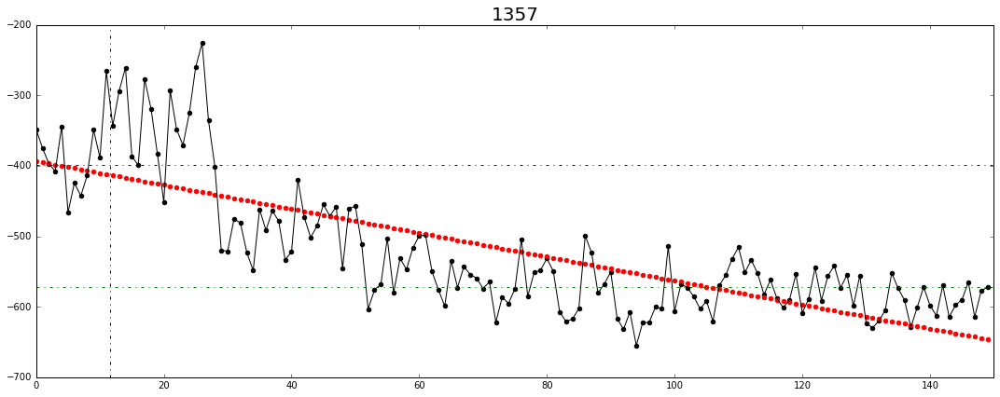

mean diff= 93.7400823396
sigma front = 40.4285164945
sigma end = 55.5593757291


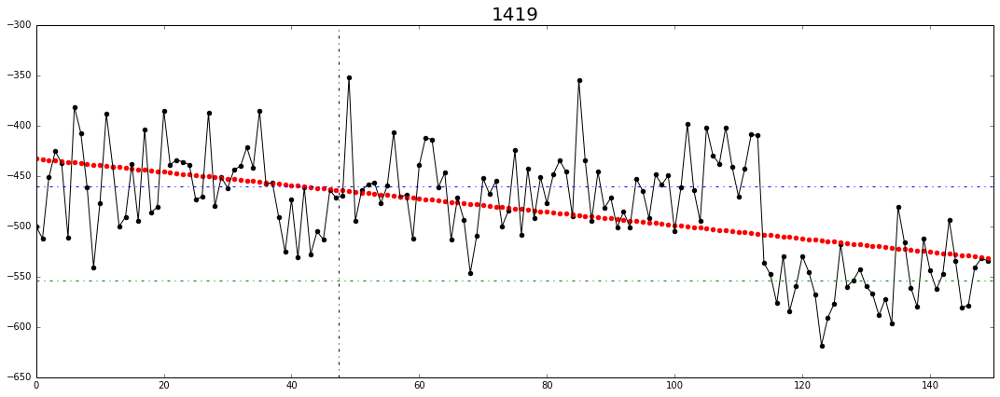

mean diff= 108.786428176
sigma front = 62.8018586322
sigma end = 16.8037308639


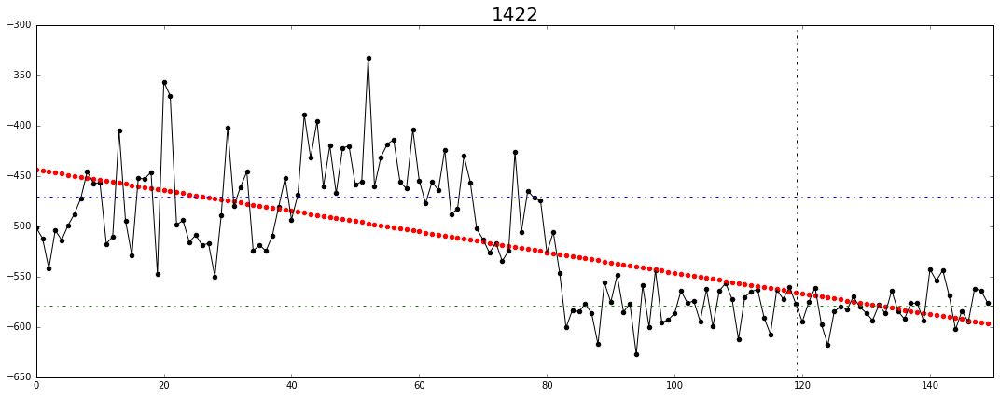

mean diff= 177.125618181
sigma front = 101.00469257
sigma end = 20.1758032777


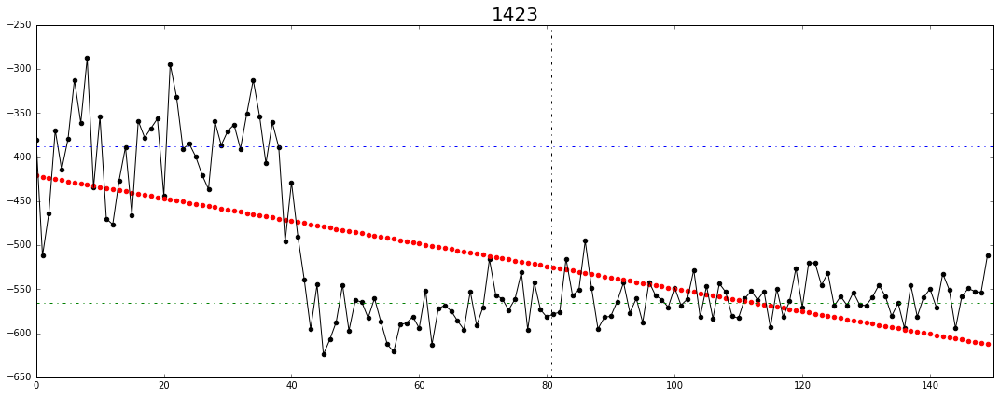

mean diff= 156.879348668
sigma front = 67.9654882802
sigma end = 69.9733850363


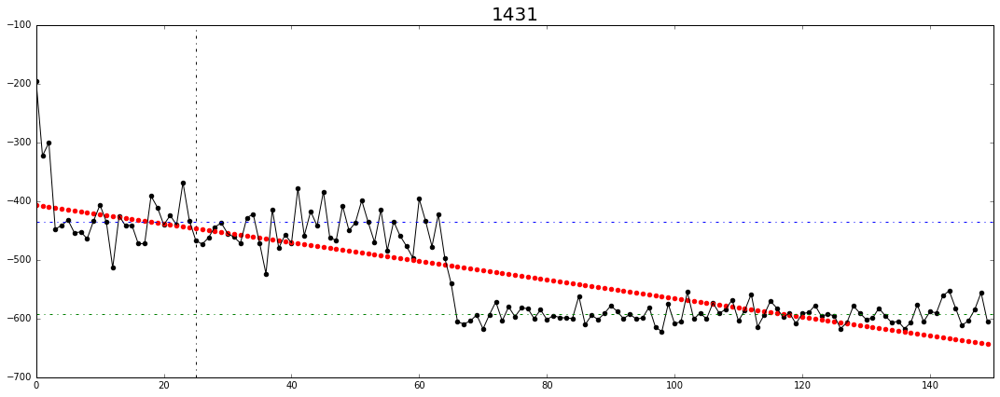

mean diff= 96.8591073128
sigma front = 40.1165190582
sigma end = 58.7007774188


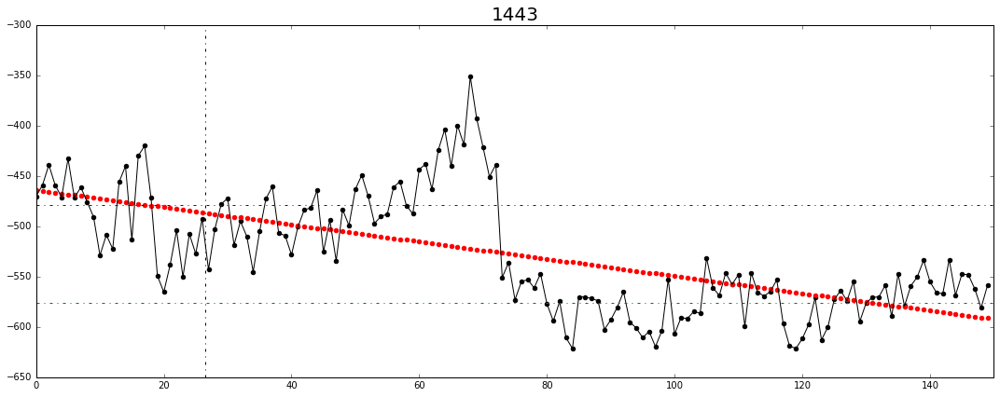

mean diff= 79.9539180382
sigma front = 28.8137718288
sigma end = 46.6431055716


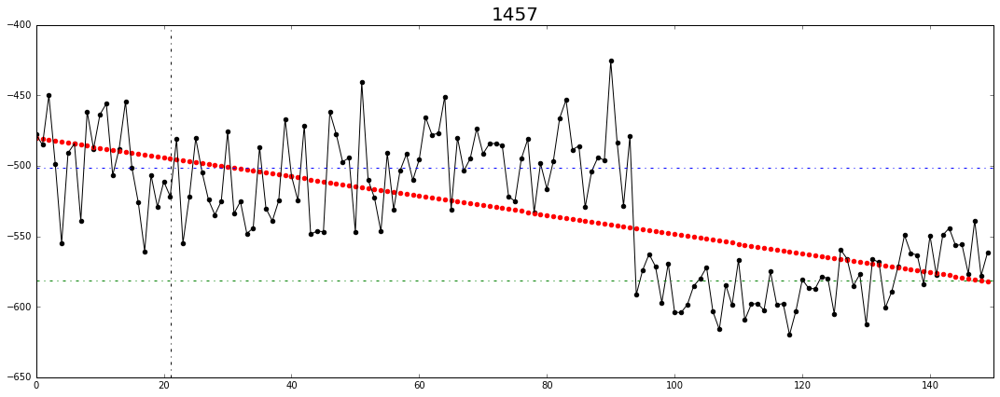

mean diff= 100.961381162
sigma front = 53.8821419209
sigma end = 23.1027555766


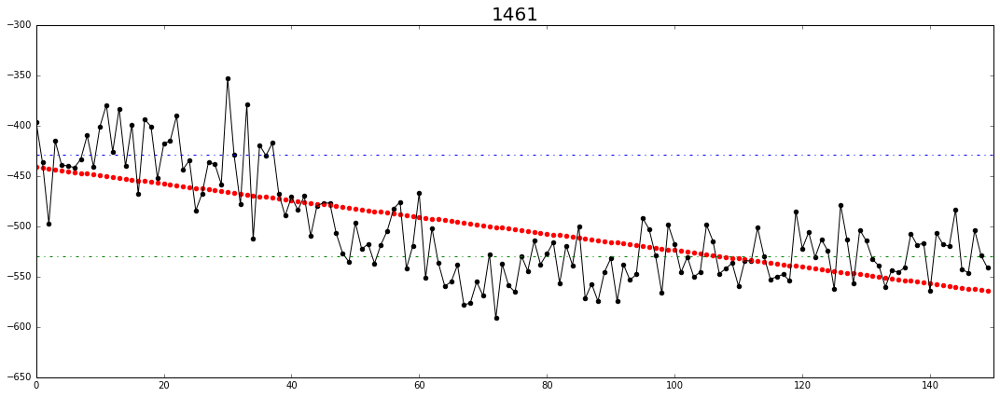

mean diff= 132.705719226
sigma front = 66.8669323734
sigma end = 18.6368882862


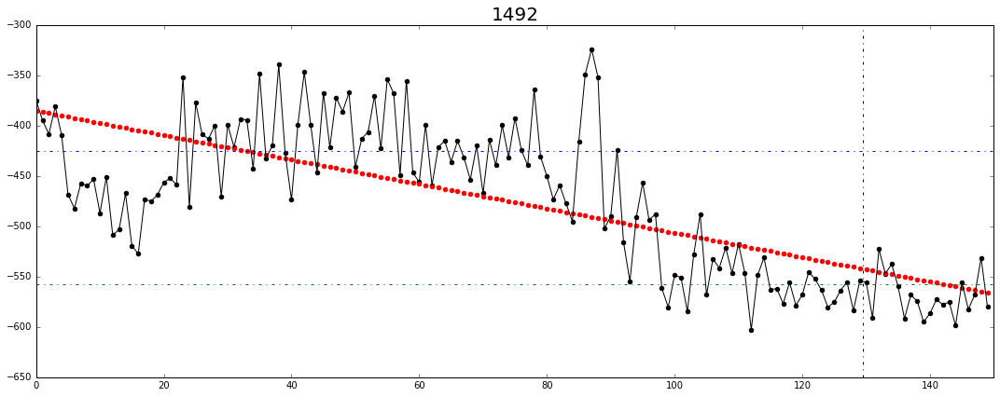

mean diff= 138.286837239
sigma front = 71.7144365483
sigma end = 16.1243888815


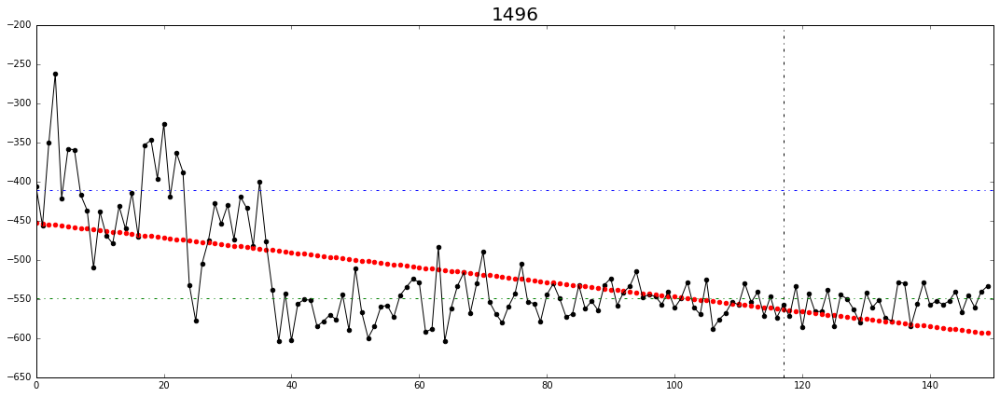

mean diff= 159.537181798
sigma front = 55.5367325049
sigma end = 24.2335066816


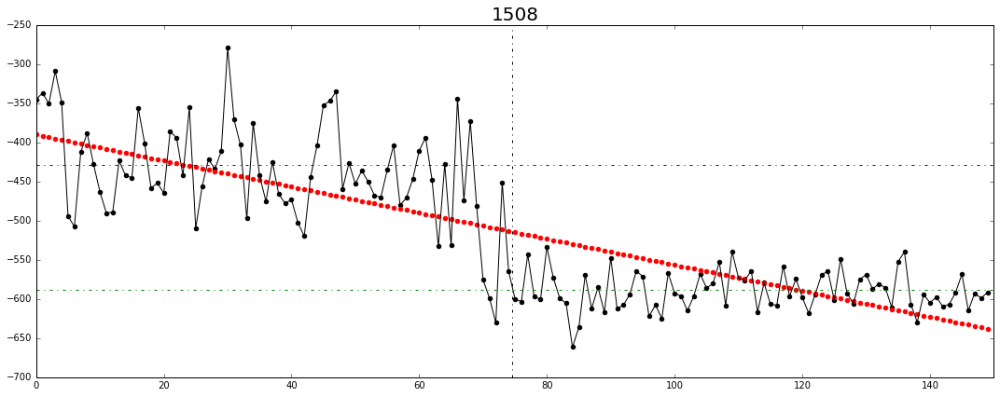

mean diff= 117.331083361
sigma front = 160.747032057
sigma end = 73.9284282676


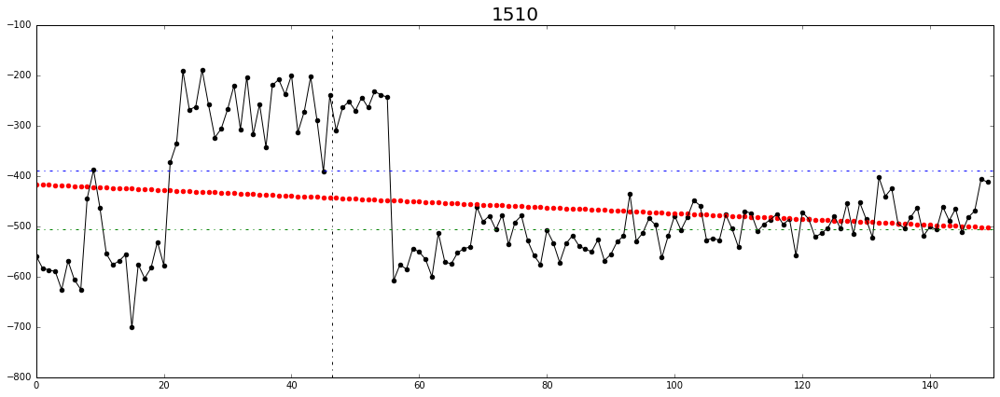

mean diff= 123.571783489
sigma front = 62.7371010015
sigma end = 21.9743391367


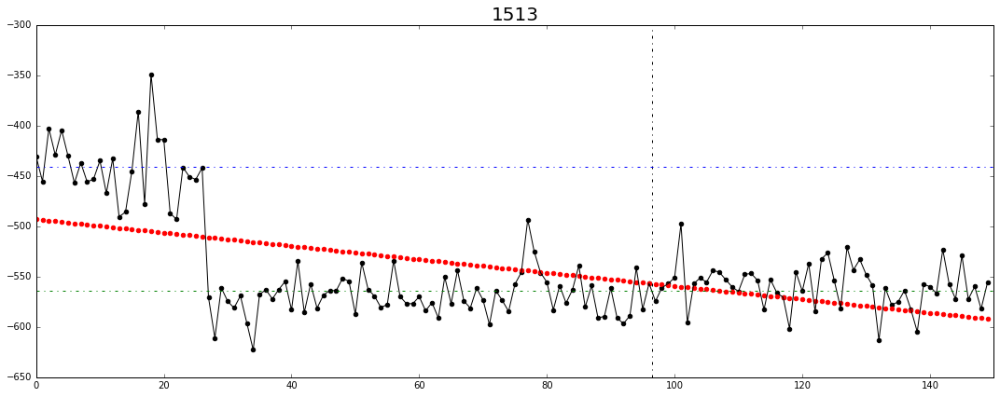

mean diff= 163.782342108
sigma front = 82.8181678354
sigma end = 24.2286876386


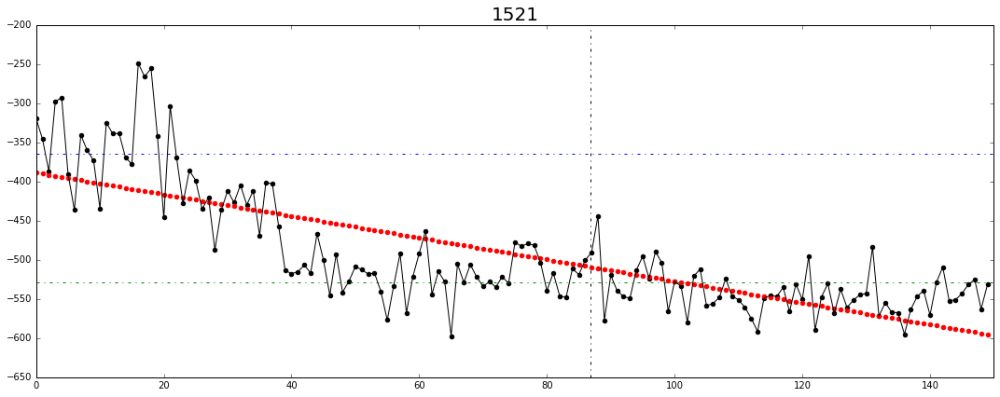

mean diff= 161.304596582
sigma front = 84.3834183917
sigma end = 12.1561507926


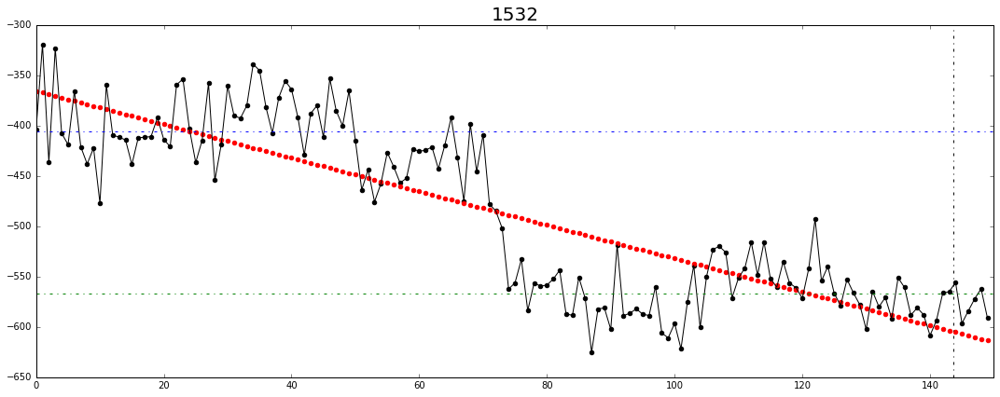

mean diff= 146.769104519
sigma front = 74.3044599604
sigma end = 21.8645656659


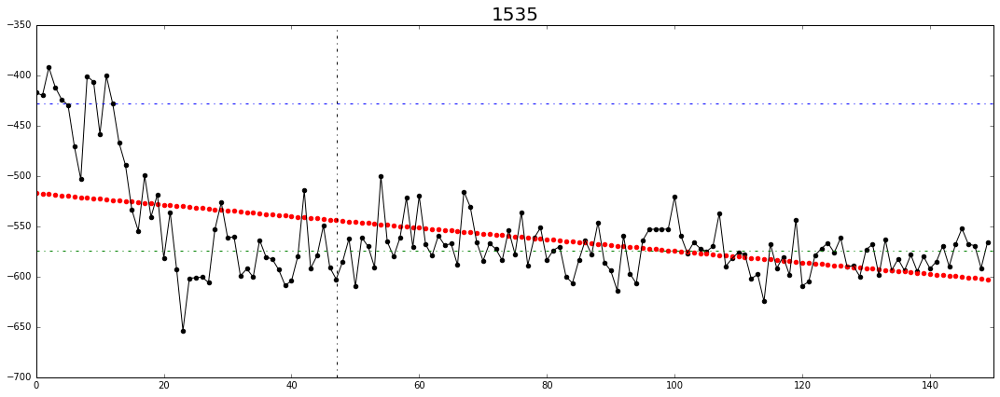

mean diff= 91.5593515206
sigma front = 34.7486472679
sigma end = 49.592784907


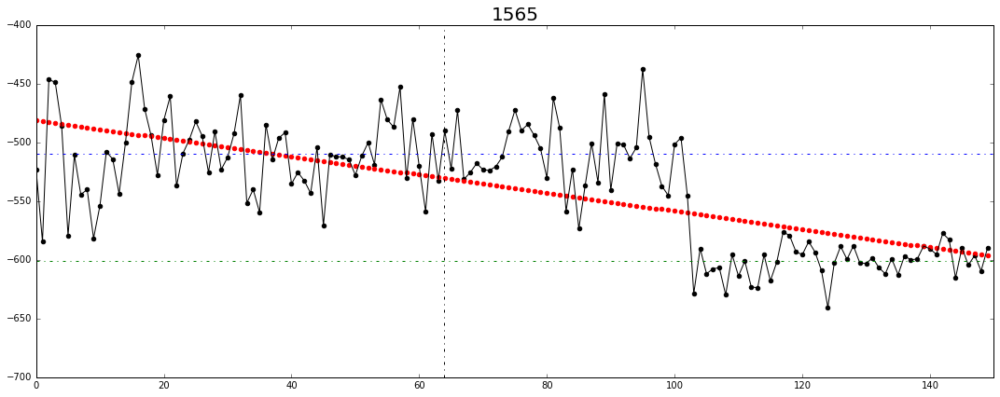

mean diff= 96.9799083275
sigma front = 58.6318478017
sigma end = 10.5009415676


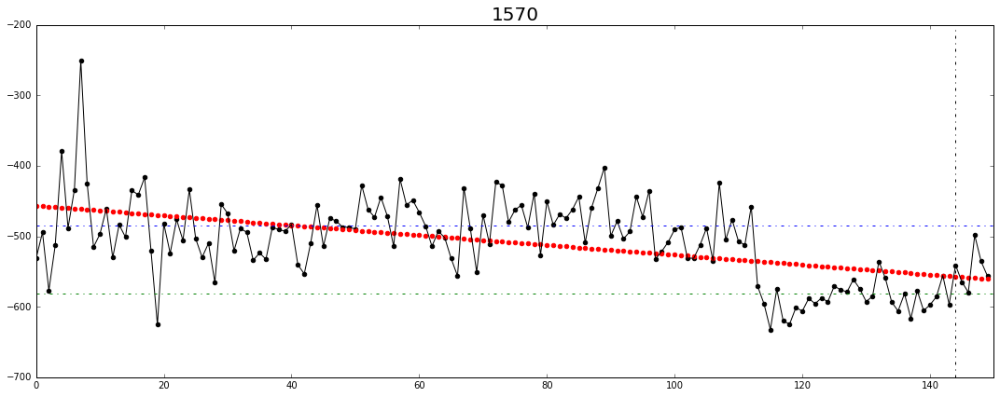

mean diff= 99.3561694771
sigma front = 60.1545398995
sigma end = 17.1532385758


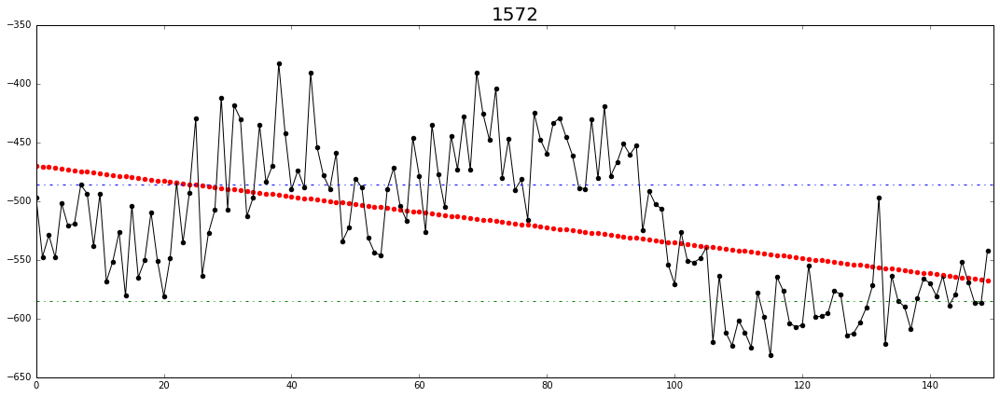

mean diff= 226.529791611
sigma front = 106.8686379
sigma end = 27.2538520984


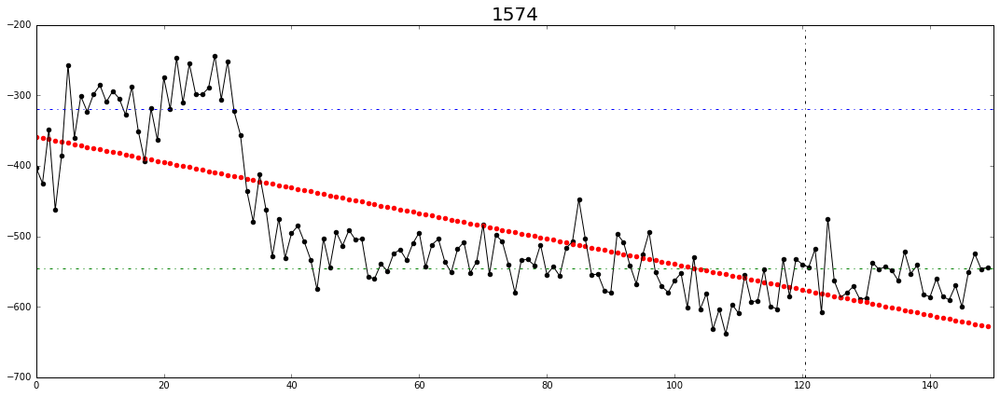

mean diff= 117.454898404
sigma front = 68.2142498383
sigma end = 8.97383428897


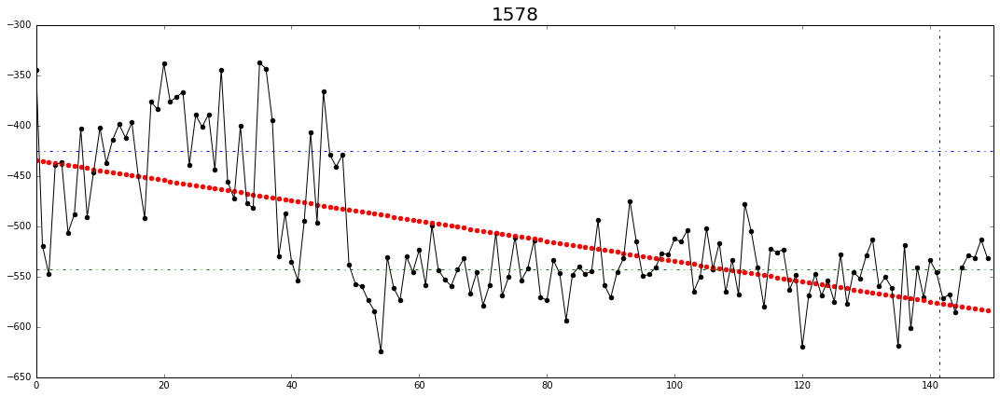

mean diff= 296.370371132
sigma front = 163.52698323
sigma end = 20.8570983395


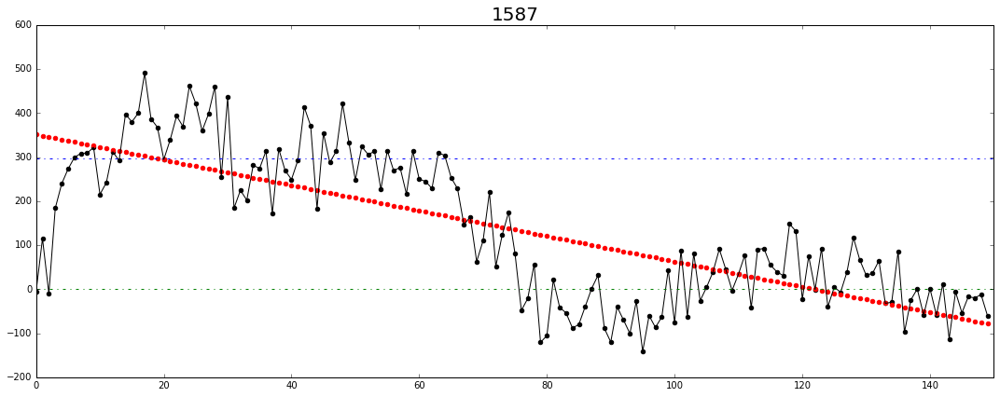

mean diff= 99.0362354405
sigma front = 70.4050455788
sigma end = 62.3327070116


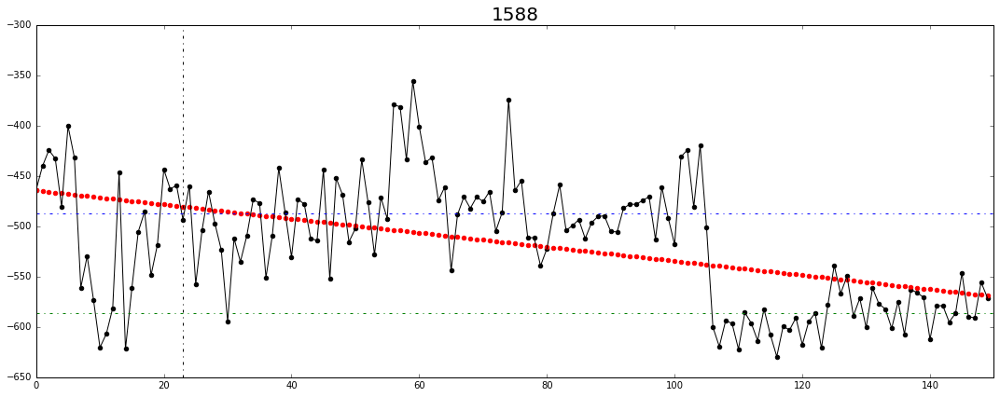

mean diff= 73.9034923492
sigma front = 20.6165027759
sigma end = 36.8933949421


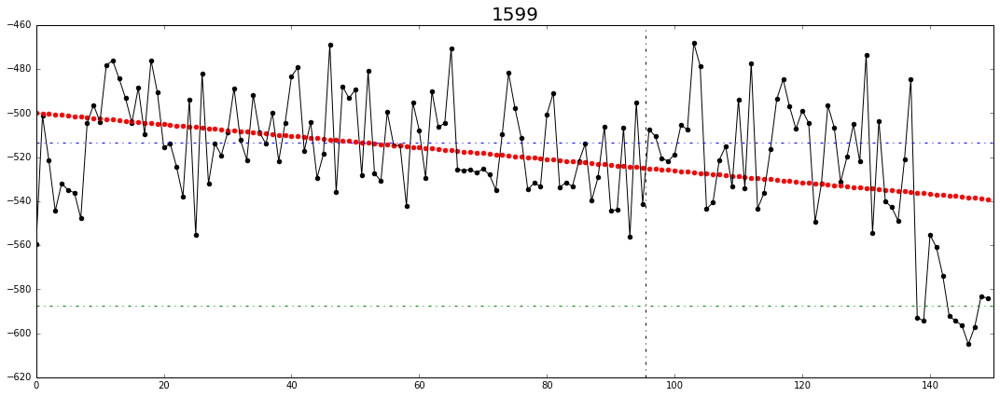

mean diff= 163.758978792
sigma front = 48.2399999995
sigma end = 26.6495471467


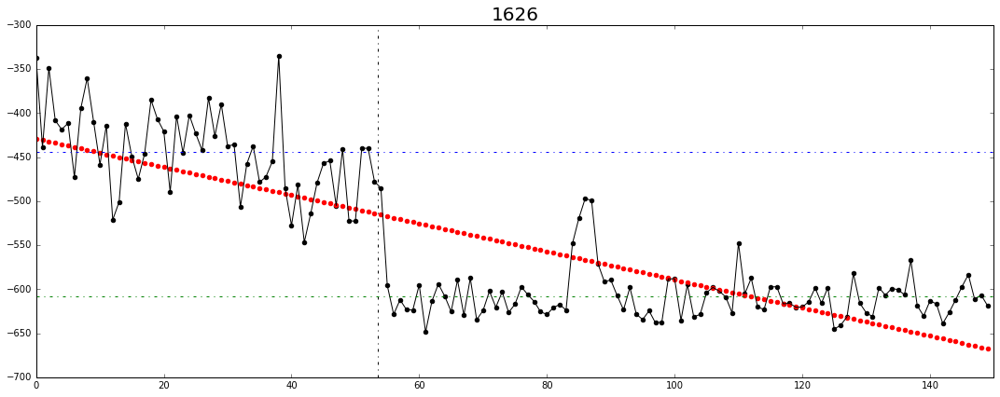

mean diff= 175.583461938
sigma front = 72.3709192787
sigma end = 35.9279795061


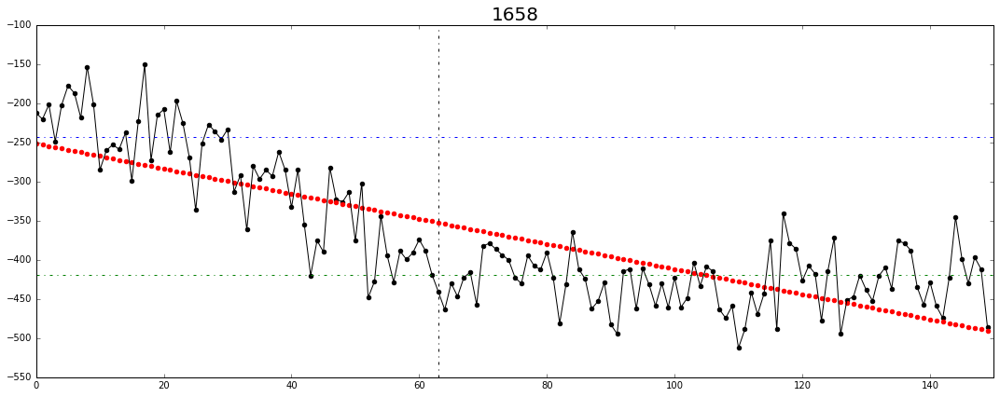

mean diff= 83.8090914521
sigma front = 35.3515585071
sigma end = 51.9264703163


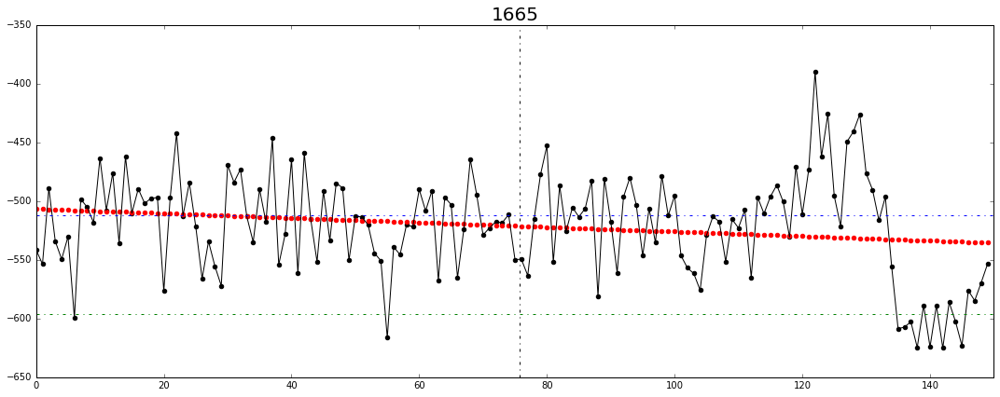

mean diff= 111.677864689
sigma front = 50.1447936406
sigma end = 24.8249737654


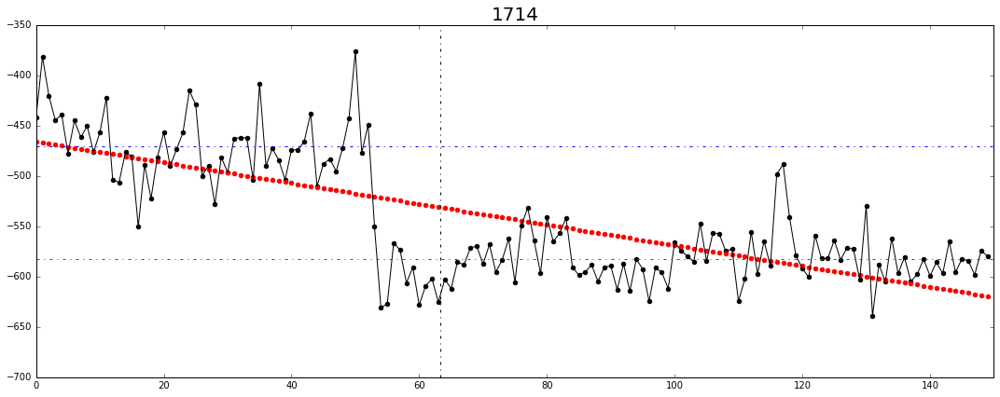

mean diff= 107.760985257
sigma front = 36.1898864239
sigma end = 54.5316882983


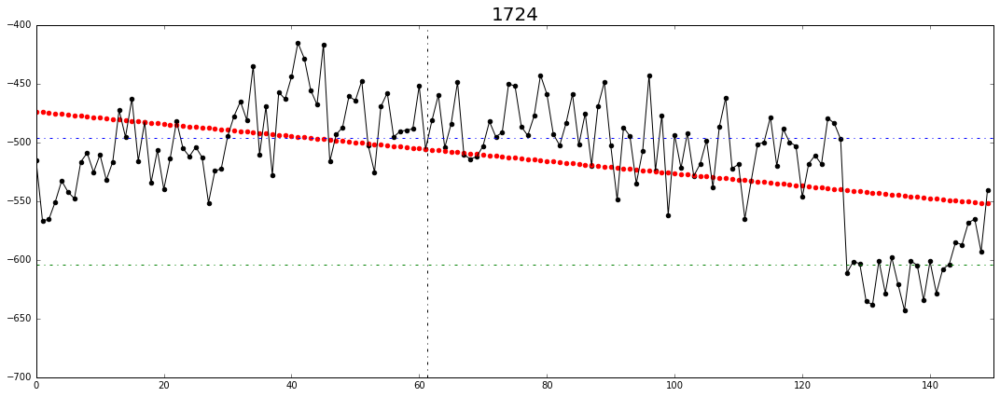

mean diff= 204.490285577
sigma front = 44.745887003
sigma end = 71.4869528648


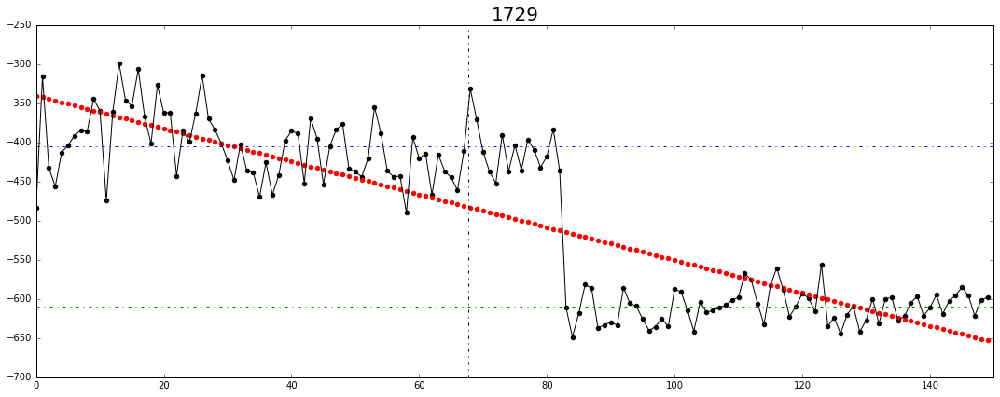

mean diff= 98.8399293064
sigma front = 32.5721574806
sigma end = 67.2964136883


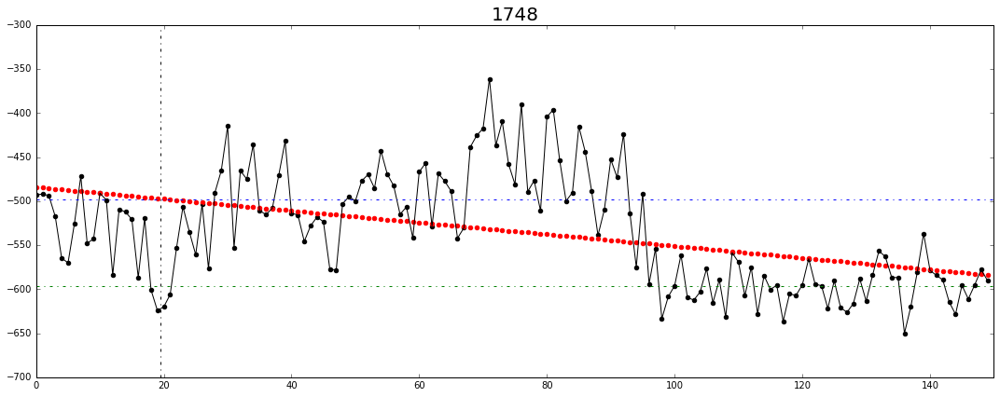

mean diff= 320.959873305
sigma front = 163.708044211
sigma end = 44.9082622836


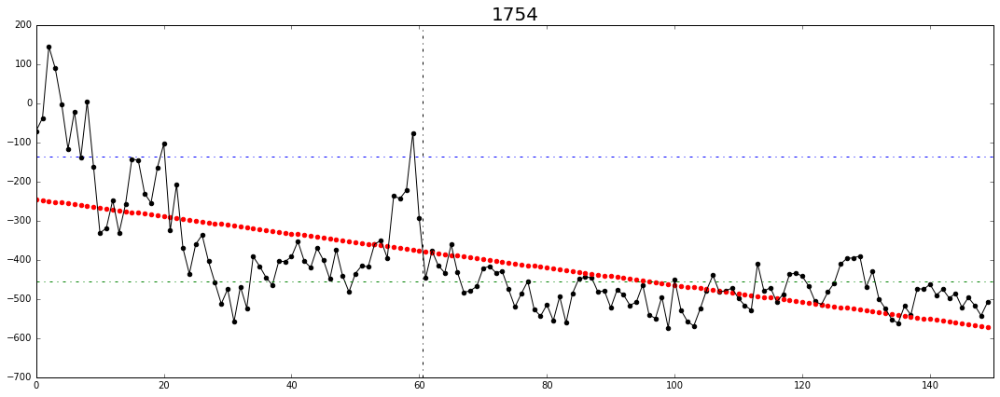

mean diff= 106.435109182
sigma front = 63.6918844124
sigma end = 21.2850314526


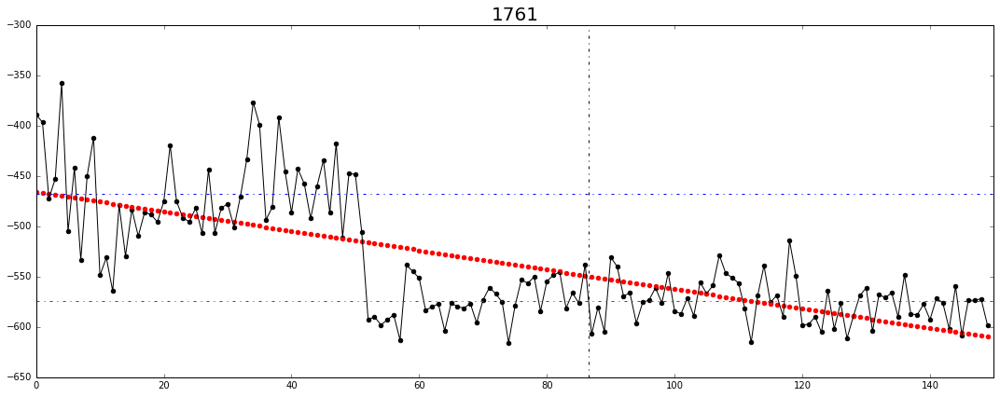

mean diff= 82.8080957092
sigma front = 43.4629179109
sigma end = 45.8588633391


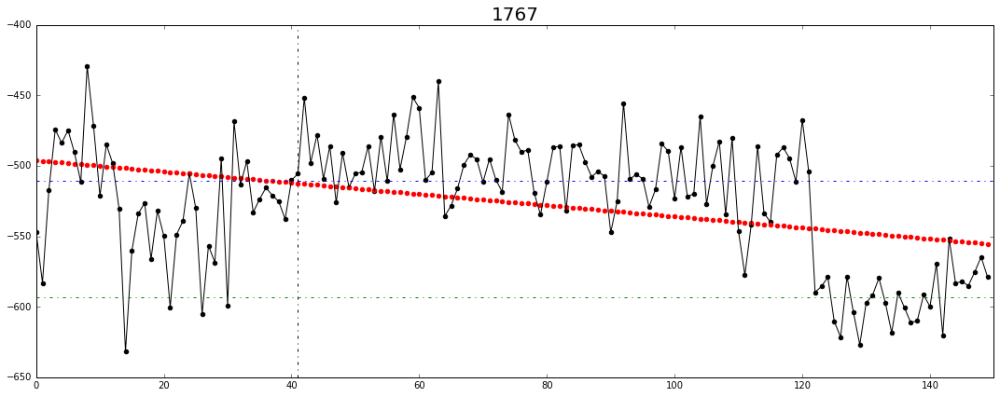

mean diff= 142.274079479
sigma front = 64.0806601171
sigma end = 19.8653482312


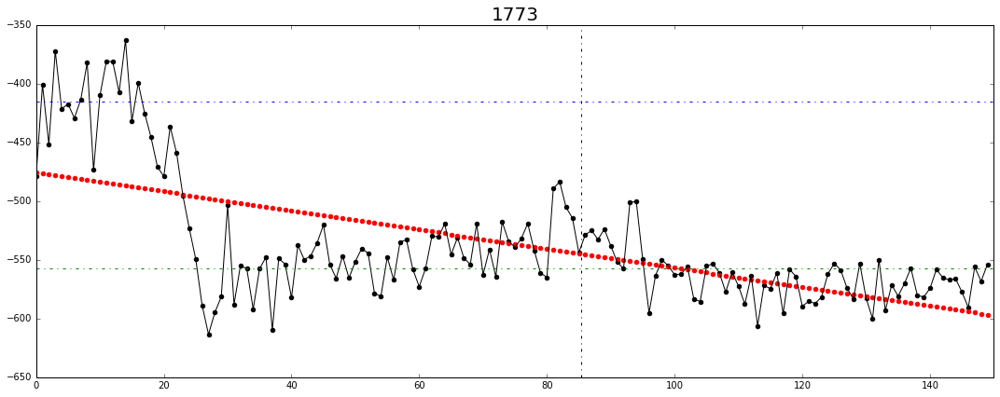

mean diff= 119.340360409
sigma front = 74.6099382984
sigma end = 29.7353880989


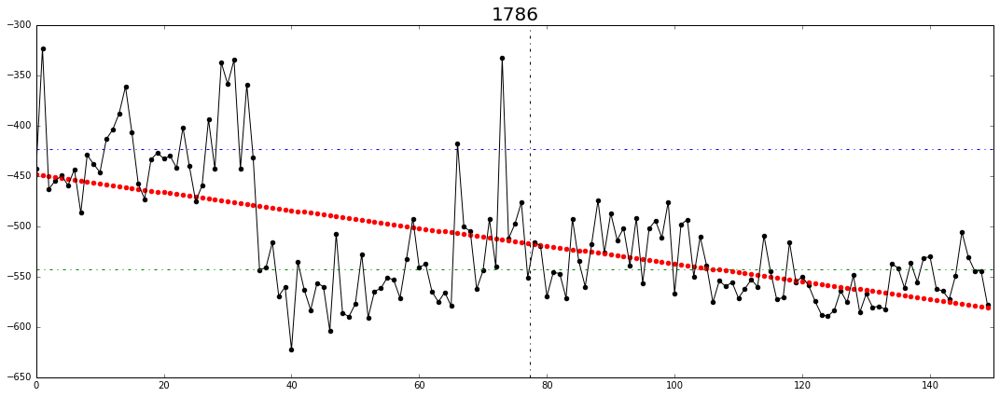

mean diff= 106.661282353
sigma front = 39.5546712744
sigma end = 15.2579878171


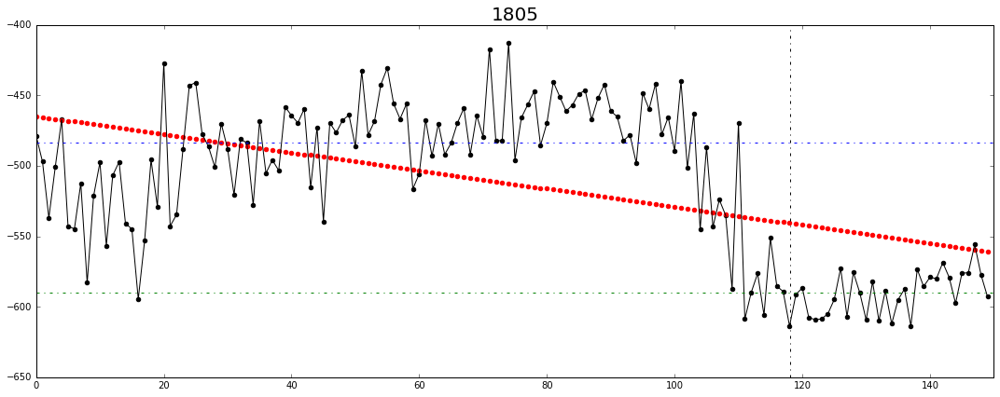

mean diff= 397.478736974
sigma front = 192.080481589
sigma end = 33.3542740373


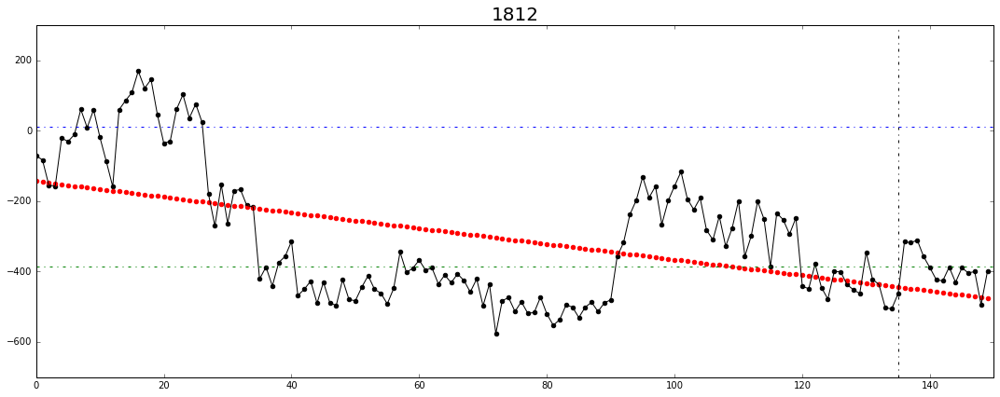

mean diff= 201.004437992
sigma front = 85.0986815322
sigma end = 34.8368732459


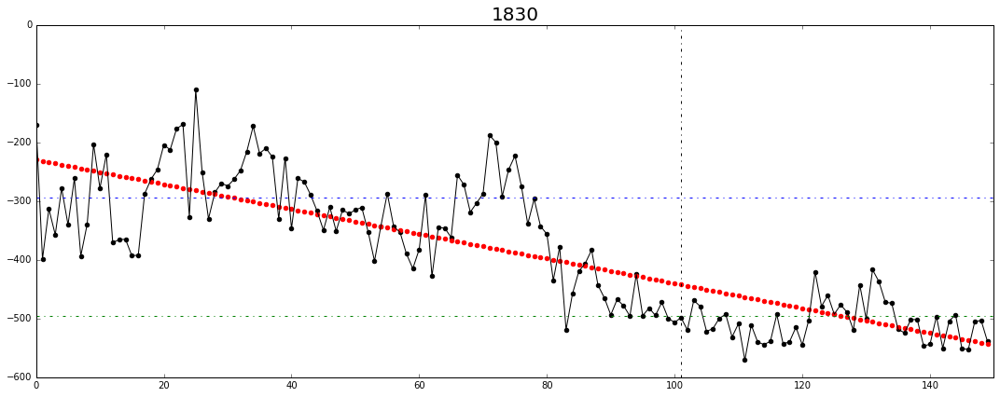

mean diff= 178.215040034
sigma front = 83.0161655429
sigma end = 18.3629084217


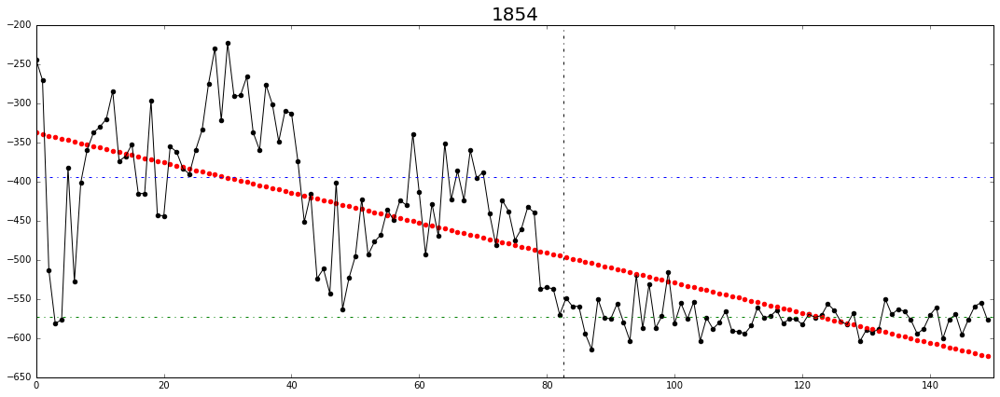

mean diff= 114.523195123
sigma front = 36.695128405
sigma end = 68.656422765


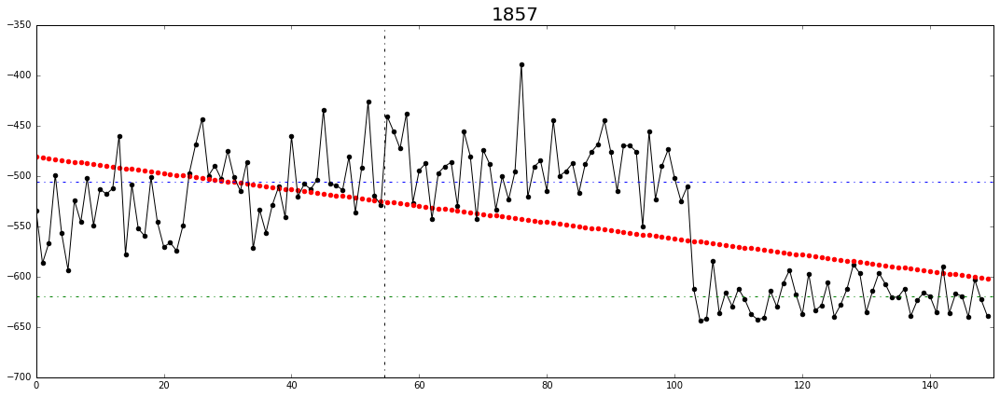

mean diff= 76.7643751734
sigma front = 30.1174104559
sigma end = 12.5019096055


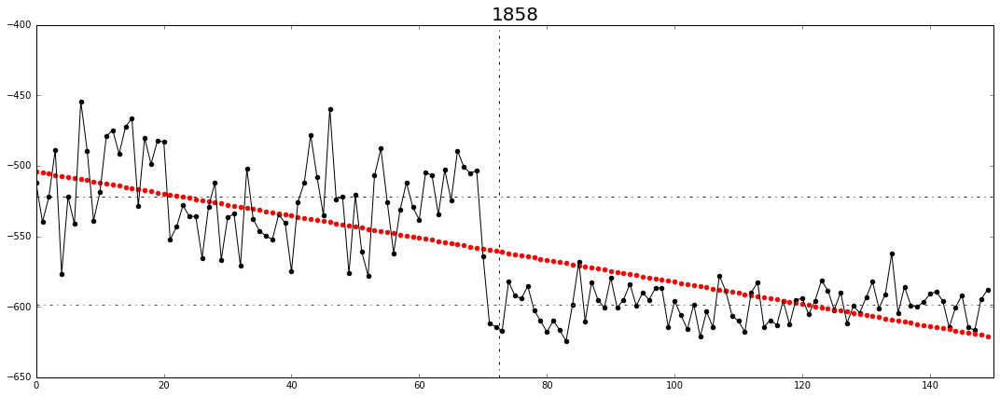

mean diff= 161.757306719
sigma front = 62.6209401171
sigma end = 45.5849539018


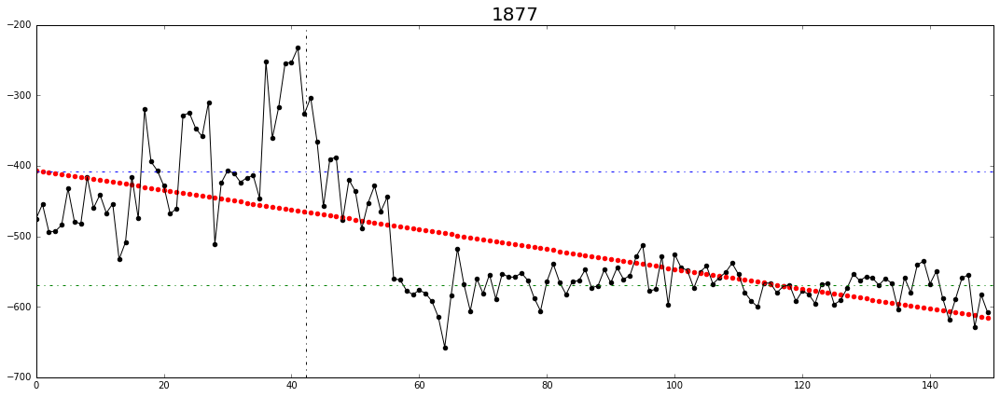

mean diff= 186.316706255
sigma front = 111.537426286
sigma end = 43.6234132383


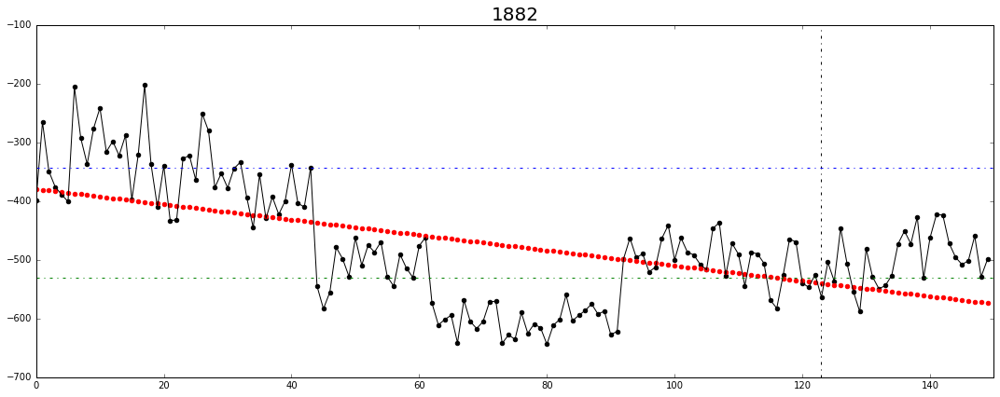

mean diff= 157.680817368
sigma front = 49.2289997957
sigma end = 28.5023984884


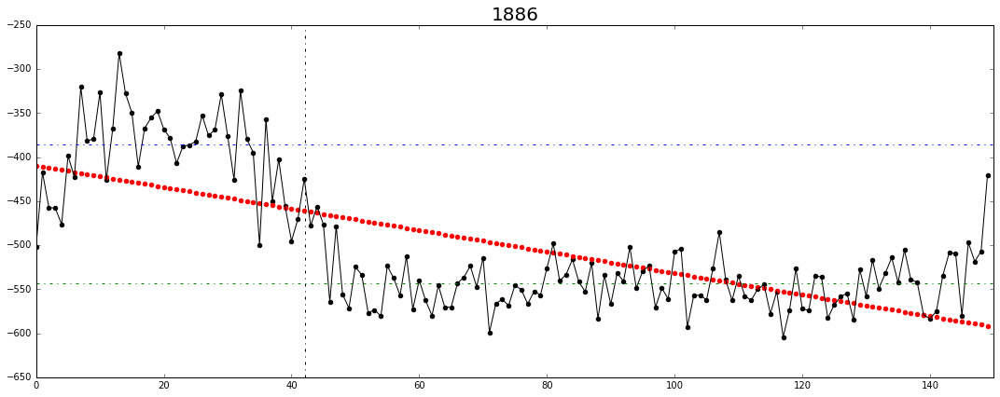

mean diff= 212.909039938
sigma front = 122.661434188
sigma end = 18.3020330751


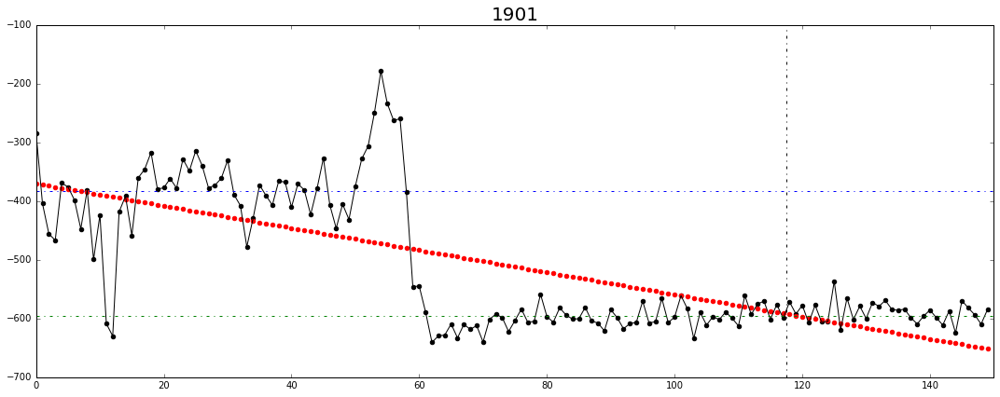

mean diff= 151.20863859
sigma front = 50.8980694901
sigma end = 64.4018816269


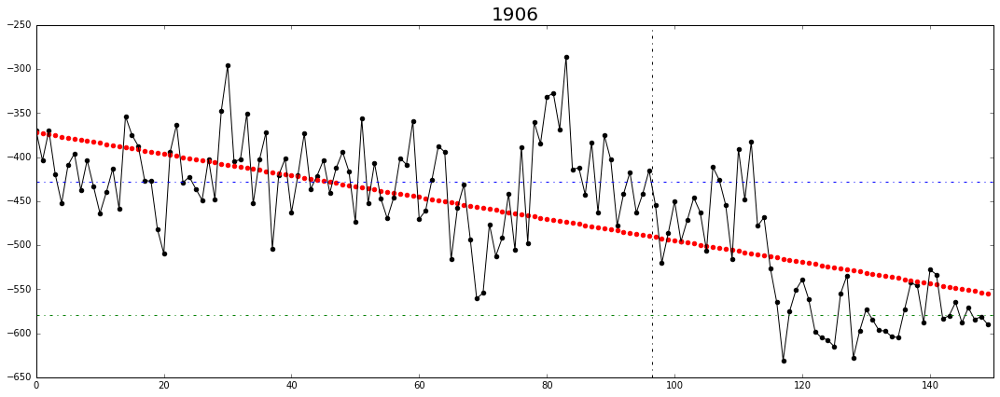

mean diff= 126.257765184
sigma front = 70.3243271141
sigma end = 15.762751613


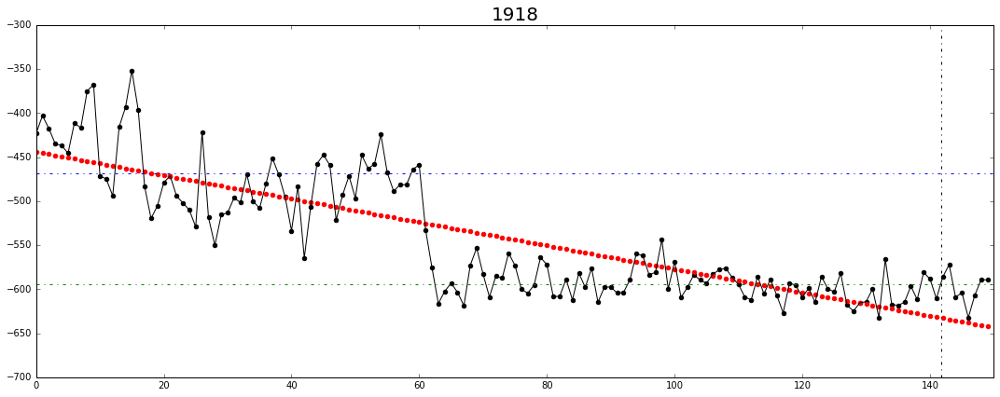

mean diff= 112.460504853
sigma front = 62.3221305776
sigma end = 17.4962546888


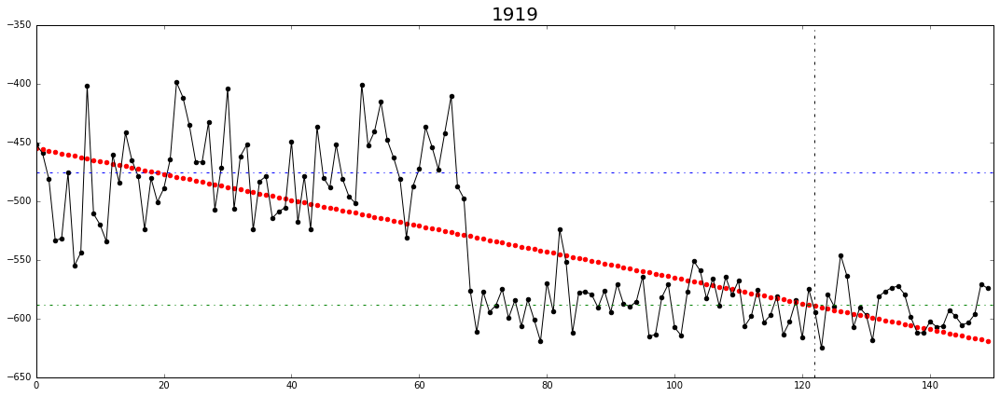

mean diff= 94.4855213596
sigma front = 48.4817691731
sigma end = nan


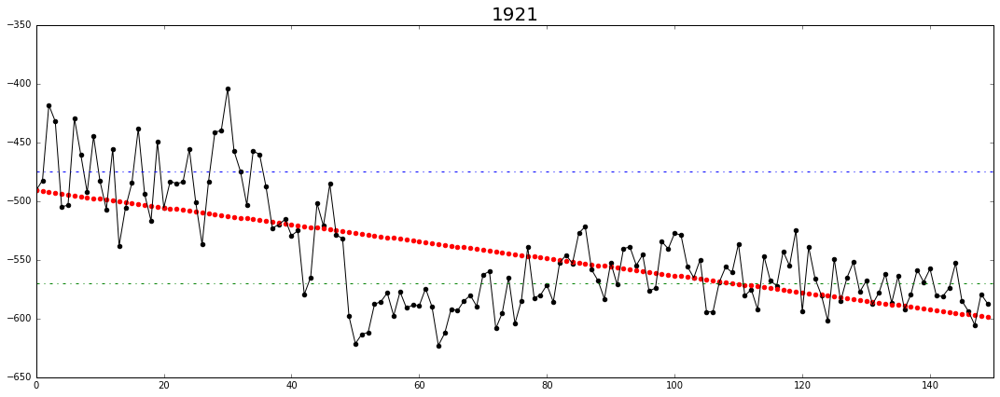

In [95]:
vals =np.arange(0,len(AREASS[0][0]))
valsf =np.arange(0,len(AREA[0][0]))
#vals = np.add.reduceat(vals2, np.arange(0, len(vals2), AVG))
Q=0
Offset=4
for x in range(0,len(AREASS[Q])):
    if MEAND[Q][x]>70 and CHIDIF[Q][x]<-0.75:
        
        plt.figure(figsize=(15,6))
        vals =np.arange(0,len(AREASS[Q][x]))
        plt.title(x,fontsize=20)
        #print('Chi ratio = ',chiRa[x])
        #print('tau =', str(data[x][1])+' '+"+/-"+' '+str(Dtau[x]/7.75))
        TauH   = LIFETIME[Q][x]
        #Data = running_mean(Signal[x],4)
        DataLeft  = AREASS[Q][x][:int(TauH)-Offset]
        DataRight = AREASS[Q][x][int(TauH)+Offset:]
        #meanI  = np.mean(DataLeft)
        #meanE  = np.mean(DataRight)
        #print('mean front=',meanI)
        #print('mean back=',meanE)
        print('mean diff=',MEAND[Q][x])
        print('sigma front =',np.std(DataLeft))
        print('sigma end =',np.std(DataRight))
        #plt.title(str(x) +'\n'+str(PairsMade[x]),fontsize=20)

        plt.scatter(vals,AREASS[Q][x]+Correct,color='k')
        plt.scatter(valsf,AREA[Q][x]+Correct,color='r')

        plt.plot(vals,AREASS[Q][x]+Correct,color='k')
        plt.axvline(LIFETIME[Q][x],linestyle ='-.',color='k')
        plt.axhline(MEANI[Q][x]+Correct,linestyle ='-.',color='b')
        plt.axhline(MEANE[Q][x]+Correct,linestyle ='-.',color='g')
        
        plt.xlim(0,150)
        plt.tight_layout()
        plt.show()

In [39]:
Xc=[]
Yc=[]
for ah in range(0,150):
    Xc.append(random.randint(10,210))
    Yc.append(random.randint(10,210))
len(Xc)

150

In [40]:
eCoeff = 0.01160
eOffset= 1917
AreaFull = dict()
AreaCUT = dict()
PairsM = dict()
PairsA = dict()
AreaCUT2 = dict() 
PairsM2 = dict()
Bleached = dict()
INFO1 = dict()
INFO2 = dict()

LIFETIME= dict()
INTENSITY= dict()
AREA= dict()
AREAPRE=dict()
AREAPOST=dict()
AREASS=dict()
CHIR= dict()
CHIDIF=dict()
MEAND= dict()
MEANI=dict()
MEANE=dict()
CHISQUARE=dict()
CHILINE=dict()
NUM=dict()
ERRORS=dict()
PPairs = []
for z in range(0,len(DataSet)):
    FoldPath = DataPath+'/'+DataSet[z]
    Folders = os.listdir(FoldPath)
    Folders = [x for x in Folders if x != '.DS_Store']
    
    AreaH=[]        # kill this ?
    AreaHH=[]       # kill this ?
    SpotAreaH = []  # kill this ?
    SpotAreaHH = [] # kill this ?
    SpotAreaHH2 = []# kill this ?
    PairsMade2 = [] # kill this ?
    Bleach = []     # kill this ?
    MASTERTau = []
    MASTERItn = []
    MASTERarea=[]
    MASTERchiRa=[]
    MASTERmeanD=[]
    MASTERareaSS=[]
    MASTERareaPre=[]
    MASTERareaPost=[]
    MASTERmeanI=[]
    MASTERmeanE=[]
    MASTERchiDiff=[]
    MASTERchiSQUARE=[]
    MASTERchiLINE=[]
    MASTERERROR=[]
    SPOTS=[]

    PairsMade = []
    Shape = 221
    xvs = np.arange(0,Shape)
    ##Means = []# kill this ?
    #Devs  = []# kill this ?
    neighborhood_size = 9
    Row = int(4) # define the area to take around the spots
    Col = int(4) # define the area to take around the spots
    for w in range(0,len(Folders)):
        folder = FoldPath+'/'+Folders[w]
        files = os.listdir(folder)
        files = [x for x in files if x != '.DS_Store']
        DataSub = np.zeros(Shape**2).reshape((Shape,Shape))
        fitts = []
        AllPairs =[]
        SpotInfo2 = []

        ImageB = []
        MeanFit = np.zeros(Shape**2).reshape((Shape,Shape))
        eCoeffM = eCoeff*np.ones(Shape**2).reshape((Shape,Shape))
        eOffsetM = eOffset*np.ones(Shape**2).reshape((Shape,Shape))
        
        for q in range(0,len(files)):
            Images = (np.array(Image.open(folder+'/'+files[q])))# - MeanFit)
            Images = eCoeffM*(Images - eOffsetM) - MeanFit
            Images[Images < 0] = 0 

            SpotInfoHolder = []

            for we in range(0,len(Xc)):
                Xindex = int(Xc[we])
                Yindex = int(Yc[we])

                spot1 = np.array(Images[Yindex-Row:Yindex+Row+1,Xindex-Col:Xindex+Col+1])
                spot2 = np.array(Images[Yindex-Row:Yindex+Row+1,Xindex-Col:Xindex+Col+1])
                spot = spot1[2:7,2:7]
                SpotRemove = np.zeros(5**2).reshape((5,5))
                spot2[2:7,2:7]=SpotRemove
                spotB = spot2

                ATot = spot.sum()
                ATotB = spot2.sum()
                SpotInfo2.append([z,w,Xindex,Yindex,ATot,ATotB])

    ########################################################################################  

            clear_output()
            print('Finding all areas in dataset'+' '+str(z)) 
            print('Finding all areas in folder'+' '+str(w)) 
            print('On file'+' '+str(q+1)+' '+'of'+' '+str(len(files)))

        Par = len(Xc)
        AVG = 5
        Mnumb = 5
        PairsMade=[]
        Tau = []
        Signal = []
        sigmas = []
        for x in range(0,Par):
            HoldArea = np.array(SpotInfo2[x::Par])[:,4]
            HoldAreaB = np.array(SpotInfo2[x::Par])[:,5]
            aa = np.add.reduceat(HoldArea, np.arange(0, len(HoldArea), AVG))
            aaB = np.add.reduceat(HoldAreaB, np.arange(0, len(HoldAreaB), AVG))
            vals =np.arange(0,len(aa))
            
            sigmas.append(np.sqrt(np.array(aa)))

            coefs = poly.polyfit(vals,aaB, 3)
            ffit  = poly.polyval(vals, coefs)
            Sig = np.array(aa-ffit*(25/56))

            meanI = np.mean(Sig[:Mnumb])
            meanE = np.mean(Sig[-Mnumb:])
            meanM = np.mean(Sig)
            T = len(Sig)
            tau = ((meanM - meanE)/(meanI -meanE))*T
            Tau.append(tau)
            Signal.append(Sig)

        Tau2 = []
        Offset = 5
        for x in range(0,Par):
            TauH = Tau[x]
            for q in range(0,20):
                meanI = np.mean(Signal[x][:int(TauH)-Offset])
                meanE = np.mean(Signal[x][int(TauH)+Offset:])
                T = len(Signal[x])
                meanM = np.mean(Signal[x])
                tau = ((meanM - meanE)/(meanI -meanE))*T 
                if tau != tau:
                    tau = -10
                TauH = tau
            Tau2.append(TauH)

        Tau3 = []
        Offset = 3
        for x in range(0,Par):
            TauH = Tau2[x]
            for q in range(0,20):
                meanI = np.mean(Signal[x][:int(TauH)-Offset])
                meanE = np.mean(Signal[x][int(TauH)+Offset:])
                T = len(Signal[x])
                meanM = np.mean(Signal[x])
                tau = ((meanM - meanE)/(meanI -meanE))*T 
                if tau != tau:
                    tau = -10
                TauH = tau
            Tau3.append(TauH)
            

        #data = []
        #PairsMade = []
        chiSQUAR = []
        chiLINE = []
        #chiFIT=[]
        chiRa = []
        meanDif = []
        #Dtau = []
        areaS=[]
        areaSS=[]
        areaPre=[]
        areaPost=[]
        ITEN=[]
        MeanI=[]
        MeanE=[]
        chiDiff = []
        Offset =3
        NUMBER = 0
        errors=[]
        for x in range(0,Par):
            TauH   = Tau3[x]
            if TauH>0 and TauH<150:
                
                Data = Signal[x] 
                DataLeft  = Data[:int(TauH)-Offset]
                DataRight = Data[int(TauH)+Offset:]
                sigmasLeft  = sigmas[x][:int(TauH)-Offset]
                sigmasRight = sigmas[x][int(TauH)+Offset:]
                mean  = np.mean(Data)
                meanI  = np.mean(DataLeft)
                meanE  = np.mean(DataRight)


                chiHIGH = np.sum((DataLeft - meanI)**2/abs(sigmasLeft)**2)/749
                chiLOW = np.sum((DataRight - meanE)**2/abs(sigmasRight)**2)/749

                val = np.arange(0,len(Data),1)
                coefs=np.polyfit(val,Data,1)    
                ffit  = coefs[0]*val+coefs[1]
                chiFit  = np.sum((ffit - Data)**2/abs(sigmas[x])**2)/748



                if meanI-meanE>100 and ((chiLOW+chiHIGH) - chiFit)<1:
                    NUMBER += 1

                chiRa.append((chiLOW+chiHIGH)/ chiFit)
                meanDif.append(meanI-meanE)
                areaS.append(ffit)
                areaSS.append(Data)
                areaPre.append(DataLeft)
                areaPost.append(DataRight)
                MeanI.append(meanI)
                MeanE.append(meanE)
                errors.append(sigmas[x])
                chiDiff.append((chiLOW+chiHIGH) - chiFit)
                chiSQUAR.append(chiLOW+chiHIGH)
                chiLINE.append(chiFit)
            
        SPOTS.append(NUMBER)
        MASTERTau.append(Tau3)
        MASTERarea.append(areaS)
        MASTERareaSS.append(areaSS)
        MASTERareaPre.append(areaPre)
        MASTERareaPost.append(areaPost)
        MASTERchiRa.append(chiRa)
        MASTERmeanD.append(meanDif)
        MASTERmeanI.append(MeanI)
        MASTERmeanE.append(MeanE)
        MASTERchiDiff.append(chiDiff)
        MASTERchiSQUARE.append(chiSQUAR)
        MASTERchiLINE.append(chiLINE)
        MASTERERROR.append(errors)
        
    ERRORS[z]    = [item for sublist in MASTERERROR for item in sublist] 
    MEANI[z]    = [item for sublist in MASTERmeanI for item in sublist] 
    MEANE[z]    = [item for sublist in MASTERmeanE for item in sublist]
    LIFETIME[z] = [item for sublist in MASTERTau for item in sublist]
    AREA[z]     = [item for sublist in MASTERarea for item in sublist]
    AREAPRE[z]  = [item for sublist in MASTERareaPre for item in sublist]
    AREAPOST[z] = [item for sublist in MASTERareaPost for item in sublist]

    AREASS[z]   = [item for sublist in MASTERareaSS for item in sublist]

    CHIR[z]     = [item for sublist in MASTERchiRa for item in sublist]
    CHIDIF[z]   = [item for sublist in MASTERchiDiff for item in sublist]
    MEAND[z]    = [item for sublist in MASTERmeanD for item in sublist]
    CHISQUARE[z]= [item for sublist in MASTERchiSQUARE for item in sublist]
    CHILINE[z]  = [item for sublist in MASTERchiLINE for item in sublist]
    NUM[z]      =  SPOTS


Finding all areas in dataset 2
Finding all areas in folder 21
On file 750 of 750


In [34]:
for x in range(0,len(DataSet)):
    print(DataSet[x]+' '+' pairs = ',len(LIFETIME[x]))

Ba  pairs =  2062
Ca  pairs =  84
Na  pairs =  1917


In [62]:
len(MEAND[0]+MEAND[0])

3870

In [27]:
x4 = CHIDIF[0]
y4 = MEAND[0]

In [56]:
def isNaN(num):
    return num != num
chk = y4
te=[]
for a in range(0,len(chk)):
    if chk[a]!=chk[a]:
        te.append(1)
len(te)

25

In [29]:
y4 = np.nan_to_num(y4)

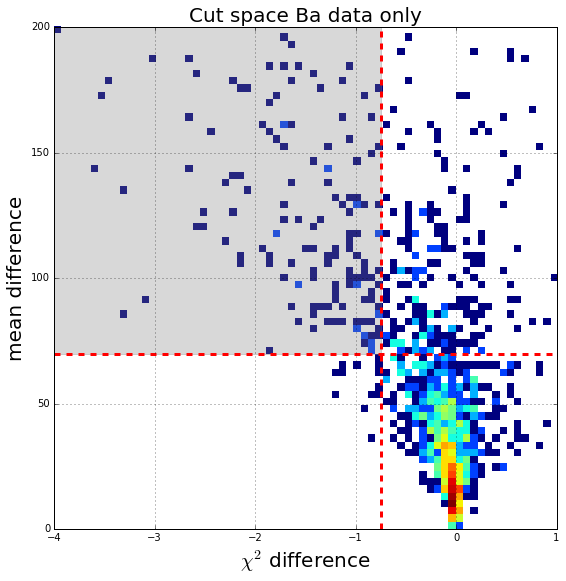

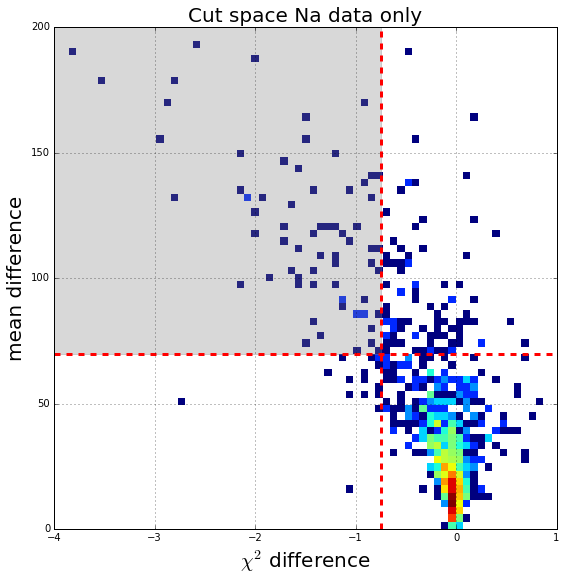

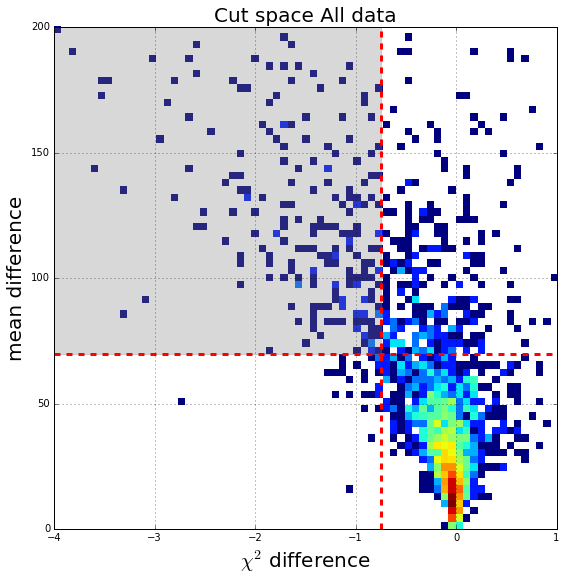

In [63]:
bins = 70
x4 = CHIDIF[0]
y4 = MEAND[0]
plt.figure(figsize=(9,9))
plt.title(r'Cut space Ba data only',fontsize=20)

xedges, yedges = np.linspace(-4, 1, bins), np.linspace(0, 200, bins)
plt.hist2d(x4, y4, bins=(xedges, yedges), norm=LogNorm())
plt.xlim(-4,1)
plt.ylim(0,200)
plt.axvspan(-4, -0.75, ymin=0.35, ymax=200, alpha=0.3, color='grey')
plt.axhline(70,linewidth=3,linestyle='--',color='r')
plt.axvline(-0.75,linewidth=3,linestyle='--',color='r')
plt.grid(True)
plt.xlabel(r'$\chi ^2$ difference', fontsize=20)
plt.ylabel('mean difference', fontsize=20)
#plt.savefig('/Users/austinmcdonald/Desktop/fitting/'+'chiBadata-cut')
plt.show()

bins = 70
x4 = CHIDIF[2]
y4 = MEAND[2]
plt.figure(figsize=(9,9))
plt.title(r'Cut space Na data only',fontsize=20)

xedges, yedges = np.linspace(-4, 1, bins), np.linspace(0, 200, bins)
plt.hist2d(x4, y4, bins=(xedges, yedges), norm=LogNorm())
plt.xlim(-4,1)
plt.ylim(0,200)
plt.axvspan(-4, -0.75, ymin=0.35, ymax=200, alpha=0.3, color='grey')
plt.axhline(70,linewidth=3,linestyle='--',color='r')
plt.axvline(-0.75,linewidth=3,linestyle='--',color='r')
plt.grid(True)
plt.xlabel(r'$\chi ^2$ difference', fontsize=20)
plt.ylabel('mean difference', fontsize=20)
#plt.savefig('/Users/austinmcdonald/Desktop/fitting/'+'chiBadata-cut')
plt.show()

bins = 70
x4 = CHIDIF[0] + CHIDIF[2]
y4 = MEAND[0] + MEAND[2]
plt.figure(figsize=(9,9))
plt.title(r'Cut space All data',fontsize=20)

xedges, yedges = np.linspace(-4, 1, bins), np.linspace(0, 200, bins)
plt.hist2d(x4, y4, bins=(xedges, yedges), norm=LogNorm())
plt.xlim(-4,1)
plt.ylim(0,200)
plt.axvspan(-4, -0.75, ymin=0.35, ymax=200, alpha=0.3, color='grey')
plt.axhline(70,linewidth=3,linestyle='--',color='r')
plt.axvline(-0.75,linewidth=3,linestyle='--',color='r')
plt.grid(True)
plt.xlabel(r'$\chi ^2$ difference', fontsize=20)
plt.ylabel('mean difference', fontsize=20)
#plt.savefig('/Users/austinmcdonald/Desktop/fitting/'+'chiBadata-cut')
plt.show()

In [50]:
def isNaN(num):
    return num != num
chk = y2
te=[]
for a in range(0,len(chk)):
    if chk[a]!=chk[a]:
        te.append(1)
len(te)

100

In [51]:
y3 = np.nan_to_num(y2)

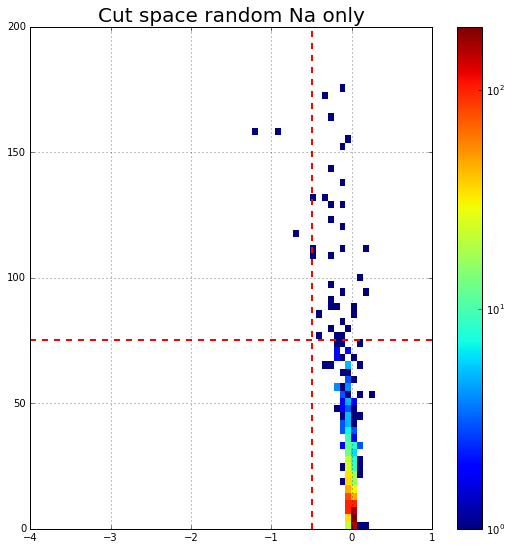

In [85]:

plt.figure(figsize=(9,9))

plt.title(r'Cut space random Na only',fontsize=20)

xedges, yedges = np.linspace(-4, 1, bins), np.linspace(0, 200, bins)
plt.hist2d(x2, y3, bins=(xedges, yedges), norm=LogNorm())
plt.colorbar()
plt.xlim(-4,1)
plt.ylim(0,200)
plt.axhline(75,linewidth=2,linestyle='--',color='r')
plt.axvline(-0.5,linewidth=2,linestyle='--',color='r')
plt.grid(True)
#plt.savefig('/Users/austinmcdonald/Desktop/fitting/'+'chinaRAND-cut')
plt.show()

In [32]:
lifetime=dict()
for x in range(0,len(DataSet)):
    LT=[]
    for z in range(0,len(MEAND[x])):
        if MEAND[x][z]>70 and CHIDIF[x][z]<-0.75:#CHISQUARE[x][z]<CHILINE[x][z] :#and MEANE[x][z]<20:
      
            LT.append(LIFETIME[x][z])
    lifetime[x]=LT# = [item for sublist in LT for item in sublist]
print('Ba Passes Cuts = ',len(lifetime[0]))
print('Na Passes Cuts = ',len(lifetime[2]))
print('sigma = ',(len(lifetime[0])-len(lifetime[2]))/np.sqrt(len(lifetime[2])))

Ba Passes Cuts =  187
Na Passes Cuts =  75
sigma =  12.9326460298


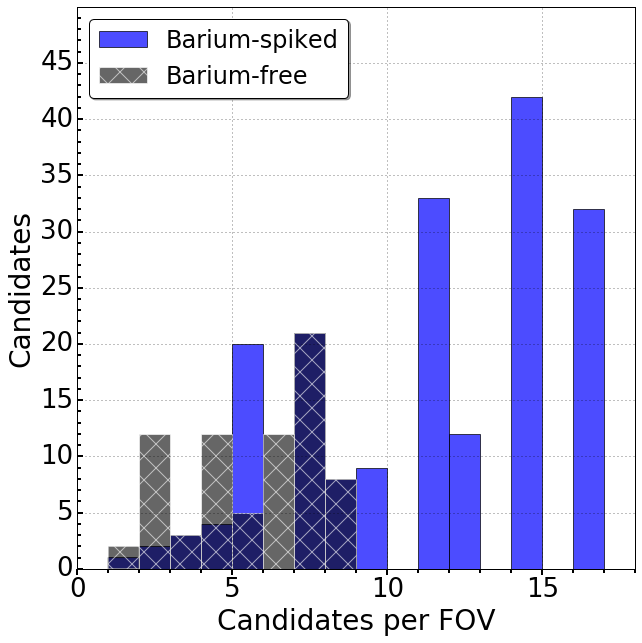

In [33]:

fig, ax = plt.subplots(figsize=(9,9))
num =1

s1 = ax.hist(NUM[0],label='Barium-spiked',alpha=0.7,color='blue',bins=np.arange(1,21,num),weights=NUM[0])
b1 = ax.hist(NUM[2],label='Barium-free',alpha=0.6,color='k',bins=np.arange(1,21,num),weights=NUM[2],edgecolor='w', hatch="x")

ax.set_xlabel('Candidates per FOV', fontsize=28)
ax.set_ylabel('Candidates', fontsize=28)

#handles,labels = ax.get_legend_handles_labels()
#handles = [handles[3], handles[1], handles[2], handles[0]]
#labels = [labels[3], '    '+labels[1], labels[2], '    '+labels[0]]
ax.legend(loc='upper left',fontsize=24,shadow=True, fancybox=True)

plt.xticks(fontsize = 26)
plt.yticks(fontsize = 26)

xmajor_ticks = np.arange(0, 21, 5)
xminor_ticks = np.arange(0, 21, 1)
ymajor_ticks = np.arange(0, 50, 5)
yminor_ticks = np.arange(0, 50, 1)
ax.tick_params(axis = 'x', which = 'major', direction='out',width=2,length=6,top="off",right='off')
ax.tick_params(axis = 'x', which = 'minor', direction='out',width=2,length=4,top="off",right='off')

ax.tick_params(axis = 'y', which = 'major', direction='in',width=2,length=6,top="off",right='off')
ax.tick_params(axis = 'y', which = 'minor', direction='in',width=2,length=4,top="off",right='off')

ax.set_xticks(xmajor_ticks)
ax.set_xticks(xminor_ticks, minor = True)
ax.set_yticks(ymajor_ticks)
ax.set_yticks(yminor_ticks, minor = True)

ax.set_xlim(0,18)
ax.set_ylim(0,50)
plt.grid(True)
plt.tight_layout()
#plt.savefig('/Users/austinmcdonald/Desktop/fitting/Ba-FOV-V3.png')
plt.show()